# Preamble

## import

In [59]:
import os

import numpy as np

import nengo
from nengo.params import Default, NumberParam
from nengo.utils.matplotlib import rasterplot
from nengo.dists import Uniform
from nengo.solvers import LstsqL2, NoSolver
from nengo.neurons import *
from nengo.builder.neurons import *

from nengolib.signal import s, nrmse, LinearSystem
from nengolib.synapses import Highpass, Lowpass

from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

from tqdm.autonotebook import tqdm

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(context='poster', style='whitegrid')
%matplotlib inline

## utilities

In [60]:
def norms(signal, freq, amp, ss, tau, t, dt=0.001, plot=False):
    lpf=nengo.Lowpass(tau)
    with nengo.Network() as model:
        if signal == 'cos':
            stim = nengo.Node(output=lambda t: amp*np.cos(freq*t))
        elif signal == 'white_noise':
            stim = nengo.Node(nengo.processes.WhiteSignal(period=t/2, high=freq, rms=amp, seed=ss))
        p_stim = nengo.Probe(stim, synapse=None)
        p_integral = nengo.Probe(stim, synapse=1/s)
    with nengo.Simulator(model, progress_bar=False, dt=dt) as sim:
        sim.run(t, progress_bar=False)
    stimulus = sim.data[p_stim]
    target = sim.data[p_integral]
    target_f = lpf.filt(sim.data[p_integral], dt=dt, y0=0)
    norm_s = np.max(np.abs(stimulus))
    norm = np.max(np.abs(target))
    norm_f = np.max(np.abs(target_f))
    if plot:
        plt.plot(sim.trange(), stimulus, label='stim', alpha=0.5)
        plt.plot(sim.trange(), target, label='integral', alpha=0.5)
        plt.plot(sim.trange(), lpf.filt(sim.data[p_integral]/norm_f, dt=dt), label='target', alpha=0.5, y0=0)
        plt.legend()
        plt.show()
    return norm, norm_s, norm_f

In [61]:
def bin_activities_values_1d(
    xhat_pre,
    act_bio,
    x_min=-1,
    x_max=1,
    n_neurons=10,
    n_eval_points=20):

    def find_nearest(array,value):
        idx = (np.abs(array-value)).argmin()
        return idx

    x_bins = np.linspace(x_min, x_max, num=n_eval_points)
    hz_means = np.empty((n_neurons, n_eval_points))
    hz_stds = np.empty((n_neurons, n_eval_points))
    for i in range(n_neurons):
        bin_act = [[] for _ in range(x_bins.shape[0])]
        for t in range(act_bio.shape[0]):
            idx = find_nearest(x_bins, xhat_pre[t])
            bin_act[idx].append(act_bio[t, i])
        for x in range(len(bin_act)):
            hz_means[i, x] = np.average(bin_act[x])
            hz_stds[i, x] = np.std(bin_act[x])

    return x_bins, hz_means, hz_stds

In [62]:
def hyperopt_objective(hyps):
    num = 1  # constant term?
    den = 1  # constant term?
    for n in range(hyps['n_num']): # terms in transfer function's numerator
        num += s**(n+1) * hyps['%s_num'%n]
    for d in range(hyps['n_den']): # terms in transfer function's denominator
        den += s**(d+1) * hyps['%s_den'%d]  
    h = num / den
    h /= h.dcgain

    A = h.filt(np.load(hyps['savefile'])['spikes'], dt=hyps['dt'], y0=0)
    target = np.load(hyps['savefile'])['target']    # already filtered with lowpass(tau)
    d = np.load(hyps['savefile'])['decoders']
    xhat = np.dot(A, d)
    loss = nrmse(xhat, target=target)
    hyps['pbar'].update()

    return {'loss': loss, 'h': h, 'status': STATUS_OK }

# Wilson Neuron

In [63]:
import os

import numpy as np

import nengo
from nengo.params import Default, NumberParam
from nengo.dists import Uniform
from nengo.neurons import *
from nengo.builder.neurons import *

__all__ = ['WilsonNeuron']


class WilsonNeuron(NeuronType):
    """
    Wilson Neuron Model.
    
    Description
    -----------
    
    TODO
    
    Paramters
    ---------

    TODO
    
    References
    ----------
    [1] Wilson, Hugh R. "Simplified dynamics of human and mammalian neocortical neurons."
        Journal of theoretical biology 200.4 (1999): 375-388.

    
    """
    
    probeable = ('spikes', 'voltage', 'recovery', 'conductance', 'AP')
    threshold = NumberParam('threshold')
    tau_V = NumberParam('tau_V')
    tau_R = NumberParam('tau_R')
    tau_H = NumberParam('tau_H')
    
    def __init__(self, threshold=-0.20, tau_V=0.00097, tau_R=0.0056, tau_H=0.0990):
        super(WilsonNeuron, self).__init__()
        self.threshold = threshold
        self.tau_V = tau_V
        self.tau_R = tau_R
        self.tau_H = tau_H
        
    @property
    def _argreprs(self):
        args = []
        def add(attr, default):
            if getattr(self, attr) != default:
                args.append("%s=%s" %(attr, getattr(self, attr)))
        add("threshold", -0.20)
        add("tau_V", 0.00097)
        add("tau_R", 0.0056)
        add("tau_H", 0.0990)
        return args

    
    def current(self, x, gain, bias):
        x = np.array(x, dtype=float, copy=False, ndmin=1)
        gain = np.array(gain, dtype=float, copy=False, ndmin=1)
        bias = np.array(bias, dtype=float, copy=False, ndmin=1)
        return gain * x + bias


    def gain_bias(self, max_rates, intercepts):
        max_rates = np.array(max_rates, dtype=float, copy=False, ndmin=1)
        intercepts = np.array(intercepts, dtype=float, copy=False, ndmin=1)

        J_steps = 201  # Odd number so that 0 is a sample
        max_rate = max_rates.max()

        # Find range of J that will achieve max rates (assume monotonic)
        J_threshold = None
        J_max = None
        Jr = 1.0
        for _ in range(10):
            J = np.linspace(-Jr, Jr, J_steps)
            rate = self.rates(J, np.ones(J_steps), np.zeros(J_steps))
#             print('rate', rate)
            if J_threshold is None and (rate <= 0).any():
                J_threshold = J[np.where(rate <= 0)[0][-1]]
            if J_max is None and (rate >= max_rate).any():
                J_max = J[np.where(rate >= max_rate)[0][0]]
            if J_threshold is not None and J_max is not None:
                break
            else:
                Jr *= 2
        else:
            if J_threshold is None:
                raise RuntimeError("Could not find firing threshold")
            if J_max is None:
                raise RuntimeError("Could not find max current")

        J = np.linspace(J_threshold, J_max, J_steps)
        rate = self.rates(J, np.ones(J_steps), np.zeros(J_steps))
        gain = np.zeros_like(max_rates)
        bias = np.zeros_like(max_rates)
        J_tops = np.interp(max_rates, rate, J)
        gain[:] = (J_threshold - J_tops) / (intercepts - 1)
        bias[:] = J_tops - gain

        return gain, bias


    def rates(self, x, gain, bias):
        J = self.current(x, gain, bias)
        dt = 0.00005
        t_transient = 0.1
        t = 1.0
        t_range = np.arange(dt, t, dt)
        spiked = np.zeros(x.shape[0], dtype=float)
        AP = np.zeros(x.shape[0], dtype=bool)
        voltage = np.array(-0.754*np.ones(x.shape[0]))
        recovery = np.array(0.279*np.ones(x.shape[0]))
        conductance = np.array(0.0*np.ones(x.shape[0]))
        all_spikes = np.zeros((t_range.shape[0], x.shape[0]))
        
        for t in range(t_range.shape[0]):
            spiked, voltage, recovery, conductance, AP = self.step_math(
                dt, J, spiked, voltage, recovery, conductance, AP)
            all_spikes[t] = spiked
        rates = np.sum(np.array(all_spikes)[int(t_transient/dt):], axis=0) / t  # total spikes / total time

        return rates


    def step_math(self, dt, J, spiked, voltage, recovery, conductance, AP):
        dV = -(17.81 + 47.58*voltage + 33.80*np.square(voltage))*(voltage - 0.48) - 26*recovery*(voltage + 0.95) - 13*conductance*(voltage + 0.95) + J
        dR = -recovery + 1.29*voltage + 0.79 + 3.30*np.square(voltage + 0.38)
        dH = -conductance + 11*(voltage + 0.754)*(voltage + 0.69)
        
        voltage[:] = (voltage + dV * dt/self.tau_V).clip(-0.9, 0.3)
        recovery[:] = (recovery + dR * dt/self.tau_R)  # .clip(0.18, 0.42)
        conductance[:] = (conductance + dH * dt/self.tau_H)  # .clip(0, 0.23)
        spiked[:] = (voltage > self.threshold) & (~AP)
        spiked /= dt
        AP[:] = voltage > self.threshold
        
        return spiked, voltage, recovery, conductance, AP


@Builder.register(WilsonNeuron)
def build_wilsonneuron(model, neuron_type, neurons):
    model.sig[neurons]['voltage'] = Signal(
        -0.754*np.ones(neurons.size_in), name="%s.voltage" % neurons)
    model.sig[neurons]['recovery'] = Signal(
        0.279*np.ones(neurons.size_in), name="%s.recovery" % neurons)
    model.sig[neurons]['conductance'] = Signal(
        0.0*np.ones(neurons.size_in), name="%s.conductance" % neurons)
    model.sig[neurons]['AP'] = Signal(
        np.zeros(neurons.size_in, dtype=bool), name="%s.AP" % neurons)
    model.add_op(SimNeurons(
        neurons=neuron_type,
        J=model.sig[neurons]['in'],
        output=model.sig[neurons]['out'],
        states=[model.sig[neurons]['voltage'],
            model.sig[neurons]['recovery'],
            model.sig[neurons]['conductance'],
            model.sig[neurons]['AP']]))

# Network

In [64]:
def simulate(  
    d_pre,
    d_supv,
    d_fb,
    h,
    t=1,
    dt=0.001,
    dt_sample=0.001,
    n_neurons=100,
    signal='cos',
    freq=1,
    amp=1,
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    neuron_type=nengo.LIF(),
    gain=Default,
    bias=Default,
    max_rates=Default,
    intercepts=Default,
    **kwargs):
    
    # transform input signal u so that the integral x is normalized to np.max(x)==1
    norm, norm_s, norm_f = norms(signal, freq, amp, seeds['ss'], taus['network'], t, dt=dt, plot=False)
    
    # Simulate the full network, skipping simulation of supv or bio when possible.
    with nengo.Network(seed=seeds['ns']) as model:

        # Nodes
        model.T = t
        def flip(t, x):
            if t<model.T/2: return x
            elif t>=model.T/2: return -1.0*x
        if signal == 'cos':
            u_raw = nengo.Node(output=lambda t: amp*np.cos(freq*t))
        elif signal == 'white_noise':
            u_raw = nengo.Node(nengo.processes.WhiteSignal(period=model.T/2, high=freq, rms=amp, seed=seeds['ss']))
        u = nengo.Node(output=flip, size_in=1)
                                              
        # Ensembles
        pre_u = nengo.Ensemble(n_neurons, 1, max_rates=max_rates, seed=seeds['es'], radius=norm_s)
        pre_x = nengo.Ensemble(n_neurons, 1, max_rates=max_rates, seed=seeds['es'], radius=norm)
        supv = nengo.Ensemble(n_neurons, 1,
            gain=gain, bias=bias,
            max_rates=max_rates, intercepts=intercepts,
            neuron_type=neuron_type, seed=seeds['es'], label='supv')
        fb = nengo.Ensemble(n_neurons, 1,
            gain=gain, bias=bias,
            max_rates=max_rates, intercepts=intercepts,
            neuron_type=neuron_type, seed=seeds['es'], label='fb')
        lif = nengo.Ensemble(n_neurons, 1, max_rates=max_rates, neuron_type=nengo.LIF(), seed=seeds['es'])
        lif_ideal = nengo.Ensemble(n_neurons, 1, max_rates=max_rates, neuron_type=nengo.LIF(), seed=seeds['es'])
        tar = nengo.Ensemble(1, 1, neuron_type=nengo.Direct())

        # normal connections
        nengo.Connection(u_raw, u, synapse=None, seed=seeds['cs'])
        nengo.Connection(u, pre_u, synapse=None, seed=seeds['cs'])
        nengo.Connection(u, pre_x, synapse=1/s, seed=seeds['cs'])  # transform=1.0/norm_f, 
        nengo.Connection(u, tar, synapse=1/s, transform=1.0/norm_f)
        nengo.Connection(pre_u, lif, synapse=taus['network'], transform=taus['network']/norm_f)
        nengo.Connection(lif, lif, synapse=taus['network'])
        
        # supervised connections
        nengo.Connection(pre_u, supv, synapse=taus['network'],
            transform=taus['network']/norm_f, seed=seeds['cs'])
        nengo.Connection(pre_x, supv, synapse=taus['network'], # seed=seeds['cs'])
            solver=NoSolver(d_pre), seed=seeds['cs'])
        
        # feedback connections
        nengo.Connection(pre_u, fb, synapse=taus['network'],
            transform=taus['network']/norm_f, seed=seeds['cs'])
        nengo.Connection(fb, fb, synapse=h,
            solver=NoSolver(d_fb), seed=seeds['cs'])

        # probes
        p_target = nengo.Probe(tar, synapse=None, sample_every=dt)
        p_target_ds = nengo.Probe(tar, synapse=None, sample_every=dt_sample)
        p_spk_pre = nengo.Probe(pre_x.neurons, synapse=None, sample_every=dt)
        p_spk_supv = nengo.Probe(supv.neurons, synapse=None, sample_every=dt)
        p_spk_supv_ds = nengo.Probe(supv.neurons, synapse=None, sample_every=dt_sample)
        p_spk_fb = nengo.Probe(fb.neurons, synapse=None, sample_every=dt)
        p_spk_lif = nengo.Probe(lif.neurons, synapse=None, sample_every=dt)
        p_lif = nengo.Probe(lif, synapse=taus['readout'], sample_every=dt)
        

    # Run the simulation
    with nengo.Simulator(model, seed=seeds['ss'], dt=dt, progress_bar=True) as sim:
        sim.run(t, progress_bar=True)
        
    return dict(
        tar=sim.data[p_target],
        tar_ds=sim.data[p_target_ds],
        spk_pre=sim.data[p_spk_pre],
        spk_supv=sim.data[p_spk_supv],
        spk_supv_ds=sim.data[p_spk_supv_ds],
        spk_fb=sim.data[p_spk_fb],
        spk_lif=sim.data[p_spk_lif],
        x_lif=sim.data[p_lif])

## Decoder and Filter Updates

In [65]:
def update_d(
    target_data,
    spk_data,
    h,
    reg=1e-2,
    taus={'network': 0.1, 'readout': 0.1},
    dt=0.001,
    dt_sample=0.001,
    **kwargs):
    
    lpf = nengo.Lowpass(taus['readout'])
    target = lpf.filt(target_data, dt=dt, y0=0)
    A = h.filt(spk_data, dt=dt, y0=0)
    d_new = LstsqL2(reg=reg)(A, target)[0]
    
    return d_new

In [66]:
def update_h(
    d,
    target_data,
    spk_data,
    n_neurons=100,
    reg=1e-2,
    taus={'network': 0.1, 'readout': 0.1},
    dt=0.001,
    dt_sample=0.001,
    n_num=1,
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=100,
    **kwargs):
    
    savefile = "/home/pduggins/nengo_bioneurons/nengo_bioneurons/tests/data/quad/spikes_targets.npz"
#     assert(np.count_nonzero(target_data) > 0, "target must be nonzero")
    target = nengo.Lowpass(taus['readout']).filt(target_data, dt=dt, y0=0)  # dt=dt_sample
    np.savez(savefile, spikes=spk_data, target=target, decoders=d)
    pbar = tqdm(total=max_evals, desc="Hyperopt")
    hyps = dict(savefile=savefile, n_num=n_num, n_den=n_den,
        tau=taus['readout'], n_neurons=n_neurons, dt=dt, dt_sample=dt_sample, pbar=pbar)
    for num in range(n_num):  
        hyps['%s_num'%num] = hp.uniform('%s_num'%num, num_min, num_max)
    for den in range(n_den):
        hyps['%s_den'%den] = hp.uniform('%s_den'%den, den_min, den_max)
    trials = Trials()
    best = fmin(hyperopt_objective,
        rstate=np.random.RandomState(seed=kwargs['seeds']['ls']),
        space=hyps,
        algo=tpe.suggest,
        max_evals=max_evals,
        trials=trials)
    pbar.close()
    best_idx = np.array(trials.losses()).argmin()
    h_new = trials.trials[best_idx]['result']['h']
    
    return h_new

## Plotting

In [67]:
def get_nrmse(datadict, d_supv, d_fb, h, **kwargs):
    dt = kwargs['dt']
    lpf = Lowpass(kwargs['taus']['readout'])
    A_pre = lpf.filt(datadict['spk_pre'], dt=dt, y0=0)
    A_lif = lpf.filt(datadict['spk_lif'], dt=dt, y0=0)
    A_supv = h.filt(datadict['spk_supv'], dt=dt, y0=0)
    A_fb = h.filt(datadict['spk_fb'], dt=dt, y0=0)
    target = lpf.filt(datadict['tar'], dt=dt, y0=0)
    xhat_lif = datadict['x_lif']
    nrmse_lif = nrmse(xhat_lif, target=target)
    xhat_fb = np.dot(A_fb, d_fb)
    nrmse_fb = nrmse(xhat_fb, target=target)
    return nrmse_lif, nrmse_fb

In [68]:
def make_plots(datadict, d_supv, d_fb, h,
        plot_tuning=False, plot_filter=False, plot_estimate=False, **kwargs):

    dt = kwargs['dt']
    dt_sample = kwargs['dt_sample']
    n_neurons = kwargs['n_neurons']
    taus = kwargs['taus']
    lpf = Lowpass(taus['readout'])
    A_pre = lpf.filt(datadict['spk_pre'], dt=dt, y0=0)[::int(dt_sample/dt)]
    A_lif = lpf.filt(datadict['spk_lif'], dt=dt, y0=0)[::int(dt_sample/dt)]
    A_supv = h.filt(datadict['spk_supv'], dt=dt, y0=0)[::int(dt_sample/dt)]
    A_fb = h.filt(datadict['spk_fb'], dt=dt, y0=0)[::int(dt_sample/dt)]
    target = lpf.filt(datadict['tar'], dt=dt, y0=0)[::int(dt_sample/dt)]
    times = dt_sample * np.arange(0, len(target), 1)
    cmap = sns.color_palette('hls', 10)

    xhat_lif = datadict['x_lif'][::int(dt_sample/dt)]
    nrmse_lif = nrmse(xhat_lif, target=target)
    xhat_supv = np.dot(A_supv, d_supv)
    nrmse_supv = nrmse(xhat_supv, target=target)
    xhat_fb = np.dot(A_fb, d_fb)
    nrmse_fb = nrmse(xhat_fb, target=target)
    
    x_bins_pre, hz_means_pre, hz_stds_pre = bin_activities_values_1d(
        target, A_pre, n_neurons=n_neurons)
#     x_bins_lif, hz_means_lif, hz_stds_lif = bin_activities_values_1d(
#         xhat_lif, A_lif, n_neurons=n_neurons)
#     x_bins_supv, hz_means_supv, hz_stds_supv = bin_activities_values_1d(
#         xhat_supv, A_supv, n_neurons=n_neurons)
#     x_bins_fb, hz_means_fb, hz_stds_fb = bin_activities_values_1d(
#         xhat_fb, A_fb, n_neurons=n_neurons)
    x_bins_lif, hz_means_lif, hz_stds_lif = bin_activities_values_1d(
        target, A_lif, n_neurons=n_neurons)
    x_bins_supv, hz_means_supv, hz_stds_supv = bin_activities_values_1d(
        target, A_supv, n_neurons=n_neurons)
    x_bins_fb, hz_means_fb, hz_stds_fb = bin_activities_values_1d(
        target, A_fb, n_neurons=n_neurons)

    if plot_filter:
        impulse_time = np.arange(0, 1, 0.001)
        fig, ax = plt.subplots(1, 1, figsize=(8, 4))
        ax.plot(impulse_time, Lowpass(taus['readout']).impulse(len(impulse_time)), label='lowpass')
        ax.plot(impulse_time, h.impulse(len(impulse_time)), label='optimized')
        ax.set(xlabel='time (s)', ylabel='amplitude')
        ax.legend()
        plt.tight_layout()
        plt.show()

#     fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 16), sharex=True)
#     times_spk = dt_sample * np.arange(0, len(datadict['spk_supv']), 1)
#     rasterplot(times_spk, datadict['spk_supv'], ax=ax1)
#     rasterplot(times_spk, datadict['spk_fb'], ax=ax2)
#     ax1.set(xlabel='time', ylabel='neuron', title='supv')
#     ax2.set(xlabel='time', title='fb')
#     plt.tight_layout()

    if plot_tuning:
        a_error_supv = np.average(np.abs(A_supv - A_lif))
        a_error_fb = np.average(np.abs(A_fb - A_lif))
    #     a_error_fb = np.average(np.abs(A_fb - A_supv))
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(8, 8), sharey=True)
        for n in range(10):  # n_neurons
            ax1.plot(x_bins_pre, hz_means_pre[n], c=cmap[n])
            ax1.fill_between(x_bins_pre,
                hz_means_pre[n]+hz_stds_pre[n],
                hz_means_pre[n]-hz_stds_pre[n],
                alpha=0.5, facecolor=cmap[n])
            ax2.plot(x_bins_lif, hz_means_lif[n], c=cmap[n])
            ax2.fill_between(x_bins_lif,
                hz_means_lif[n]+hz_stds_lif[n],
                hz_means_lif[n]-hz_stds_lif[n],
                alpha=0.5, facecolor=cmap[n])
            ax3.plot(x_bins_supv, hz_means_supv[n], c=cmap[n])
            ax3.fill_between(x_bins_supv,
                hz_means_supv[n]+hz_stds_supv[n],
                hz_means_supv[n]-hz_stds_supv[n],
                alpha=0.5, facecolor=cmap[n])
            ax4.plot(x_bins_fb, hz_means_fb[n], c=cmap[n])
            ax4.fill_between(x_bins_fb,
                hz_means_fb[n]+hz_stds_fb[n],
                hz_means_fb[n]-hz_stds_fb[n],
                alpha=0.5, facecolor=cmap[n])
        ax1.set(xlim=((-1,1)), xlabel='$\mathbf{x}$', ylabel='activity (Hz)', title='pre_x')
        ax2.set(xlim=((-1,1)), xlabel='$\mathbf{x}$', title='lif')
        ax3.set(xlim=((-1,1)), xlabel='$\mathbf{x}$', title='supv \n %s \n rmse=%.3f'
            %(str(kwargs['neuron_type']).split("(")[0], a_error_supv))
        ax4.set(xlim=((-1,1)), xlabel='$\mathbf{x}$', title='fb \n %s \n rmse=%.3f'
            %(str(kwargs['neuron_type']).split("(")[0], a_error_fb))
        plt.tight_layout()

    if plot_estimate:
        fig, ax = plt.subplots(1, 1, figsize=(8, 4))
        ax.plot(times, target, label='target', linestyle='--')
        ax.plot(times, xhat_lif, alpha=0.5, label='lif, nrmse=%.3f' %nrmse_lif)
        ax.plot(times, xhat_supv, alpha=0.5, label='supv, %s, nrmse=%.3f'
            %(str(kwargs['neuron_type']).split("(")[0], nrmse_supv))
        ax.plot(times, xhat_fb, alpha=0.5, label='fb, %s, nrmse=%.3f'
            %(str(kwargs['neuron_type']).split("(")[0], nrmse_fb))
        ax.set(xlabel='time', ylabel='$\mathbf{x}$')
        ax.legend(loc='lower left')
        plt.tight_layout()
        plt.show()
        
    return nrmse_lif, nrmse_fb

## Control Structure

In [69]:
def run(optimize_h=False, **kwargs):
    
    rng = np.random.RandomState(seed=kwargs['seeds']['ls'])
    d_pre = np.zeros((kwargs['n_neurons'], 1))
    d_supv = np.zeros((kwargs['n_neurons'], 1))
    d_fb = np.zeros((kwargs['n_neurons'], 1))
    h = Lowpass(kwargs['taus']['readout'])
    dt_set = kwargs['dt']
    dt_sample_set = kwargs['dt_sample']
       
    print("oracle method to compute decoders for pre_x => supv")
    kwargs['dt'] = 0.001
    kwargs['dt_sample'] = 0.001
    datadict1 = simulate(d_pre, d_supv, d_fb, h, **kwargs)
    d_pre = update_d(datadict1['tar'], datadict1['spk_pre'], h, **kwargs)
#     make_plots(datadict1, d_supv, d_fb, h, **kwargs)

    print("oracle method to compute decoders for supv (readout) and fb => fb")
    kwargs['dt'] = dt_set
    kwargs['dt_sample'] = dt_sample_set
    datadict2 = simulate(d_pre, d_supv, d_fb, h, **kwargs)
    d_supv = update_d(datadict2['tar'], datadict2['spk_supv'], h, **kwargs)
    d_fb = d_supv
    make_plots(datadict2, d_supv, d_fb, h, plot_tuning=True, plot_estimate=True, **kwargs)
    
    if optimize_h:
        print("filter optimization for computing xhat_supv from spk_supv and d_supv")
#         h = update_h(d_supv, datadict2['tar'], datadict2['spk_supv'], **kwargs)
        h = update_h(d_supv, datadict2['tar_ds'], datadict2['spk_supv_ds'], **kwargs)
        make_plots(datadict2, d_supv, d_fb, h, plot_filter=True, **kwargs)

    print("testing (no supervision)")
    kwargs['seeds']['ss'] = kwargs['seeds']['ss'] + 1
    kwargs['signal'] = 'white_noise'
    datadict3 = simulate(d_pre, d_supv, d_fb, h, **kwargs)
    make_plots(datadict3, d_supv, d_fb, h, plot_estimate=True, plot_tuning=True, **kwargs)
   
    return d_pre, d_supv, d_fb

In [72]:
def run_trials_types(n_trials, **kwargs):
    
    neuron_types = [nengo.LIF(), nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.1), WilsonNeuron()]
    nrmses = np.zeros((n_trials, 4))
    
    for nt, neuron_type in enumerate(neuron_types):
        print("neuron_type = %s" %neuron_type)
        kwargs['neuron_type'] = neuron_type
        rng = np.random.RandomState(seed=kwargs['seeds']['ls'])
        d_pre = np.zeros((kwargs['n_neurons'], 1))
        d_supv = np.zeros((kwargs['n_neurons'], 1))
        d_fb = np.zeros((kwargs['n_neurons'], 1))
        h = Lowpass(kwargs['taus']['readout'])
        dt_set = kwargs['dt']
        dt_sample_set = kwargs['dt_sample']

        print("oracle method to compute decoders for pre_x => supv")
        kwargs['dt'] = 0.001
        kwargs['dt_sample'] = 0.001
        datadict_pre = simulate(d_pre, d_supv, d_fb, h, **kwargs)
        d_pre = update_d(datadict_pre['tar'], datadict_pre['spk_pre'], h, **kwargs)

        print("oracle method to compute decoders for supv (readout) and fb => fb")
        kwargs['dt'] = dt_set
        kwargs['dt_sample'] = dt_sample_set
        datadict_supv = simulate(d_pre, d_supv, d_fb, h, **kwargs)
        d_supv = update_d(datadict_supv['tar'], datadict_supv['spk_supv'], h, **kwargs)
        d_fb = d_supv

        print("filter optimization for computing xhat_supv from spk_supv and d_supv")
        h = update_h(d_supv, datadict_supv['tar_ds'], datadict_supv['spk_supv_ds'], **kwargs)

        print("testing")
        for j in range(n_trials):
            print("trial %s" %j)
            kwargs['seeds']['ss'] = kwargs['seeds']['ss'] + 1
            datadict_test = simulate(d_pre, d_supv, d_fb, h, **kwargs)
            nrmse_lif, nrmse_fb = get_nrmse(datadict_test, d_supv, d_fb, h, **kwargs)
            nrmses[j, 0] = nrmse_lif
            nrmses[j, nt+1] = nrmse_fb

    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    sns.barplot(data=nrmses)
    ax.set(xlabel='neuron_type', ylabel='nrmse')
    plt.xticks(np.arange(4), ('default', 'LIF', 'ALIF', 'Wilson'))
    plt.show()

# Simulations

## LIF

### default

oracle method to compute decoders for pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

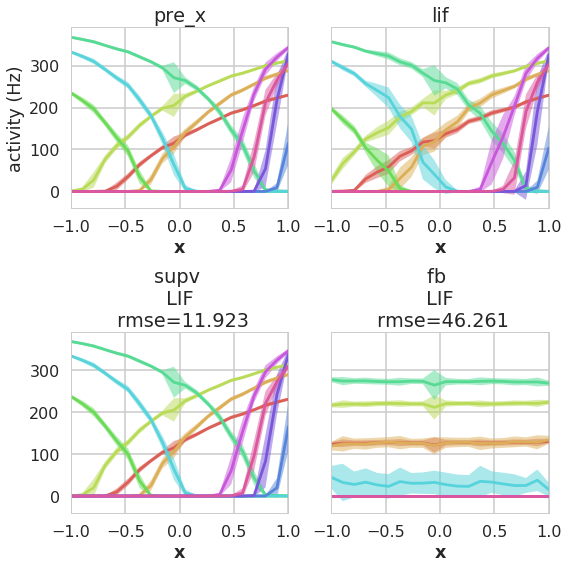

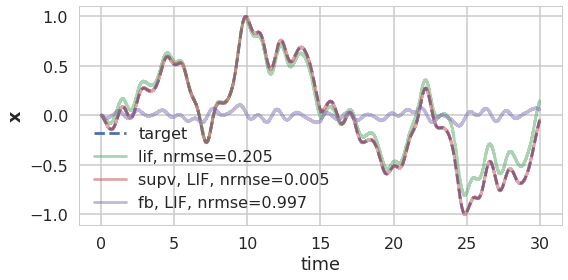

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

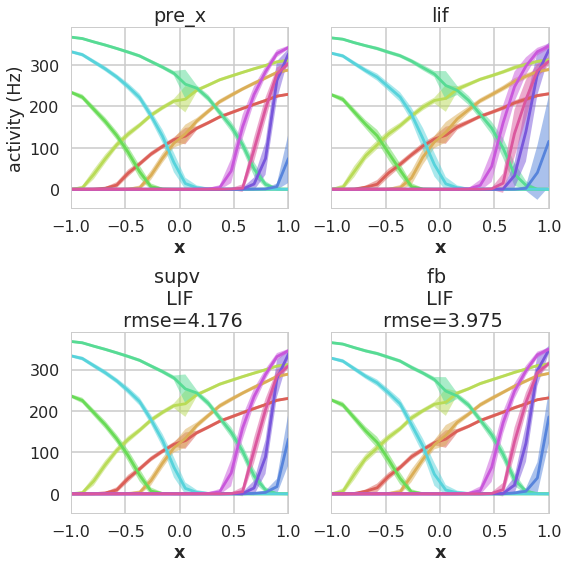

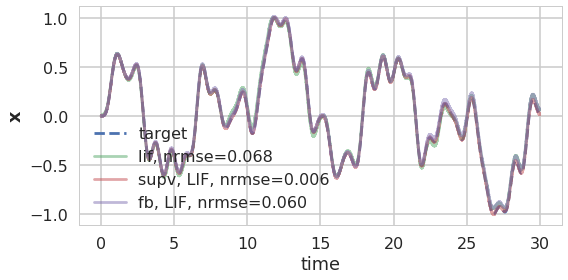

In [11]:
kwargs = dict(
    t=30,
    dt=0.001,
    dt_sample=0.001,
    n_neurons=100,
    freq=1,
    amp=1,
    max_rates=Default,
    intercepts=Default,
    neuron_type=nengo.LIF(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

d_pre, d_supv, d_fb = run(**kwargs)

## ALIF

### default

oracle method to compute decoders for pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

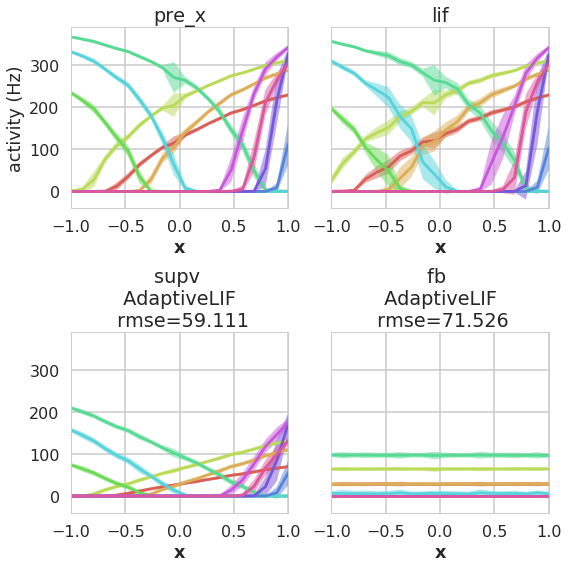

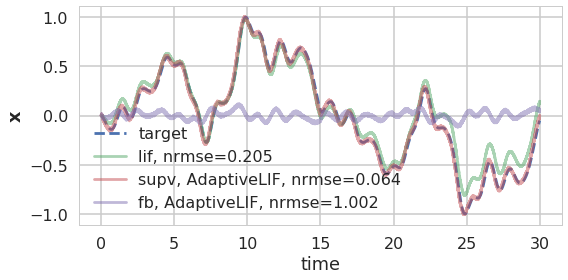

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

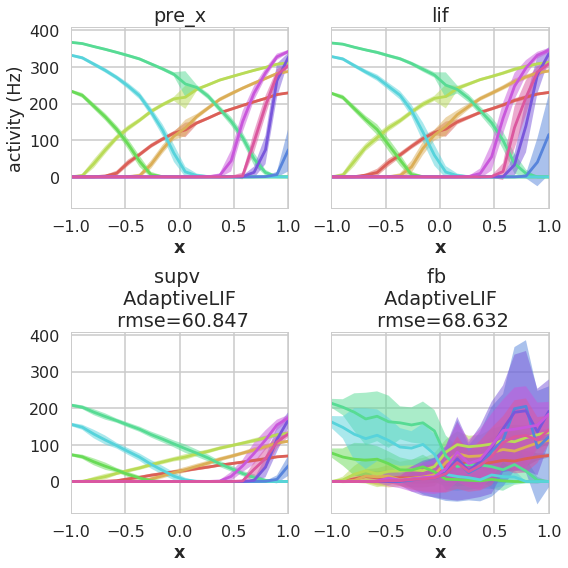

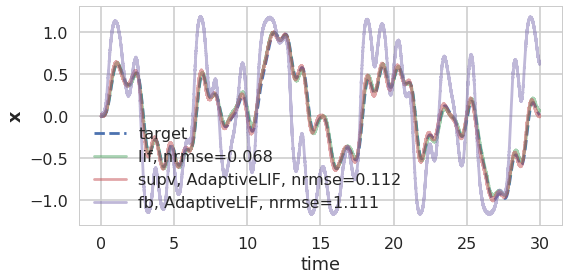

In [136]:
kwargs = dict(
    t=30,
    dt=0.001,
    dt_sample=0.001,
    n_neurons=100,
    freq=1,
    amp=1,
    max_rates=Default,
    intercepts=Default,
    neuron_type=nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.1),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

d_pre, d_supv, d_fb = run(**kwargs)

### filter

oracle method to compute decoders for pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

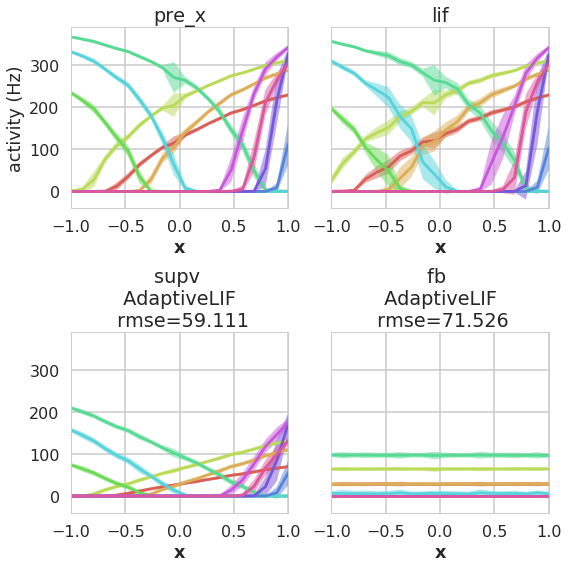

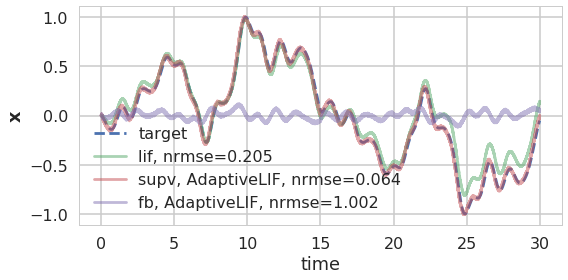

filter optimization for computing xhat_supv from spk_supv and d_supv


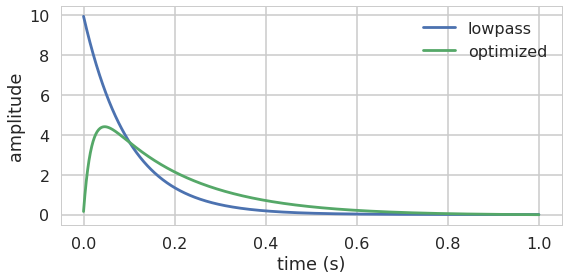

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

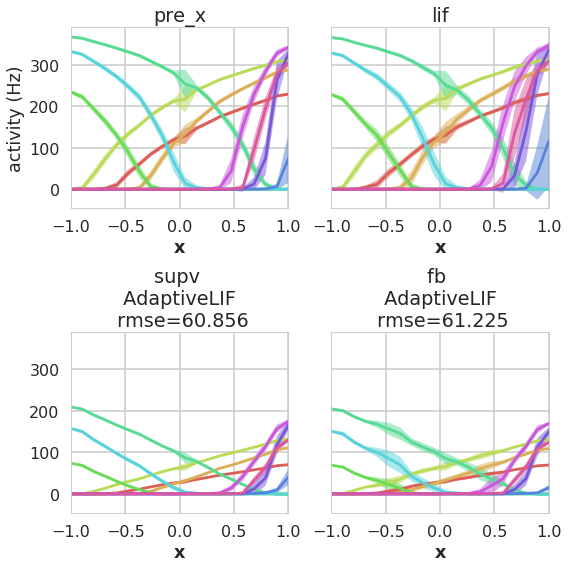

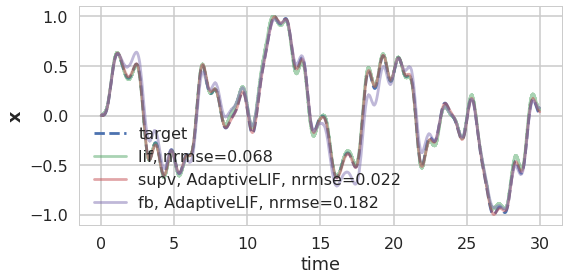

In [11]:
kwargs = dict(
    t=30,
    dt=0.001,
    dt_sample=0.001,
    n_neurons=100,
    freq=1,
    amp=1,
    max_rates=Default,
    intercepts=Default,
    neuron_type=nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.1),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

d_pre, d_supv, d_fb = run(optimize_h=True, **kwargs)

smaller dt, vary dt_sample

oracle method to compute decoders for pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

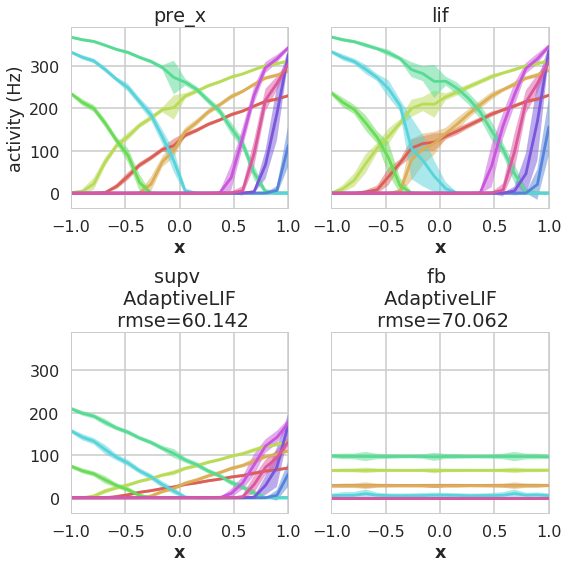

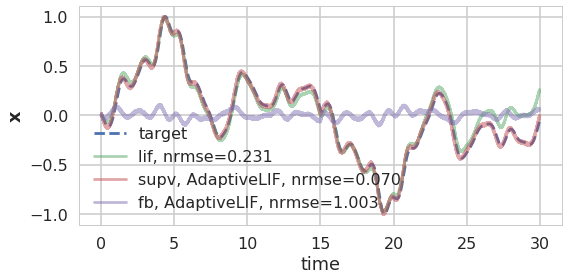

filter optimization for computing xhat_supv from spk_supv and d_supv


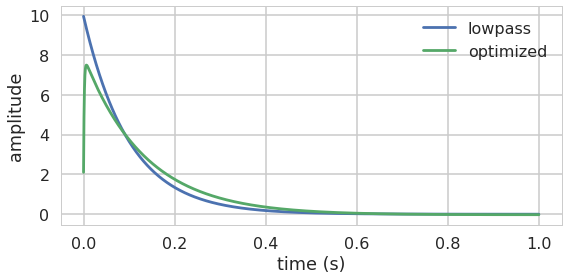

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

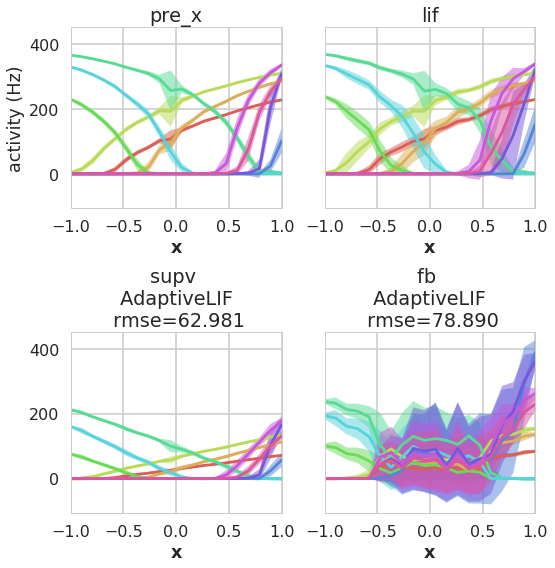

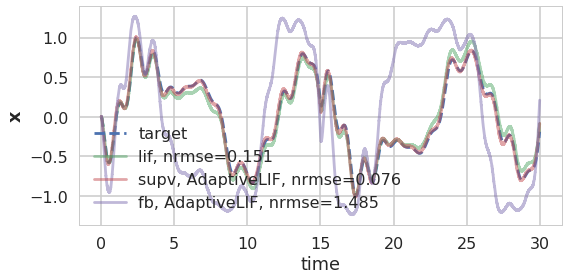

In [12]:
kwargs = dict(
    t=30,
    dt=0.0001,
    dt_sample=0.001,
    n_neurons=100,
    freq=1,
    amp=1,
    max_rates=Default,
    intercepts=Default,
    neuron_type=nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.1),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

d_pre, d_supv, d_fb = run(optimize_h=True, **kwargs)

oracle method to compute decoders for pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

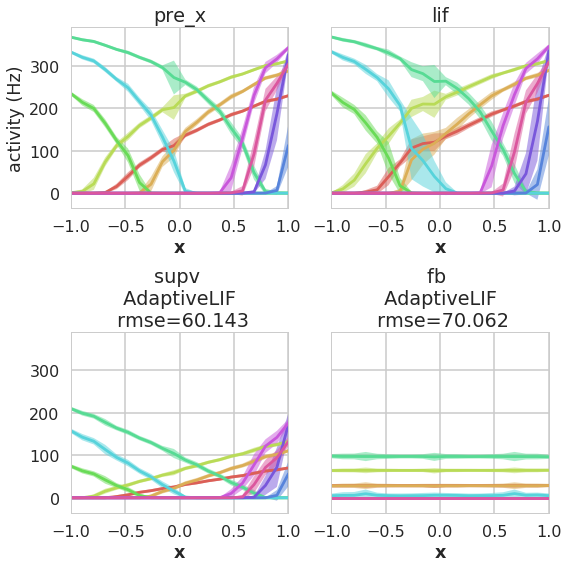

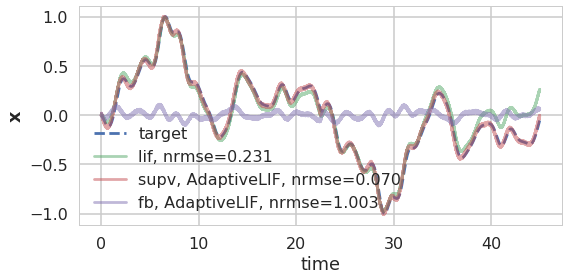

filter optimization for computing xhat_supv from spk_supv and d_supv


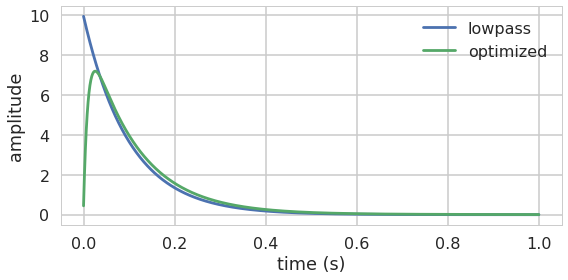

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

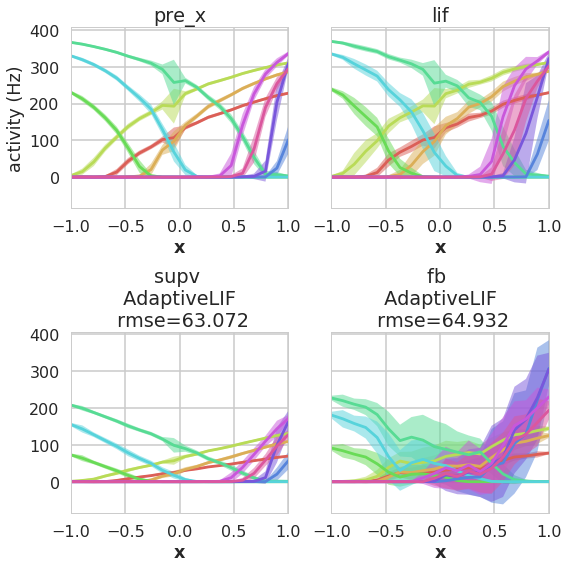

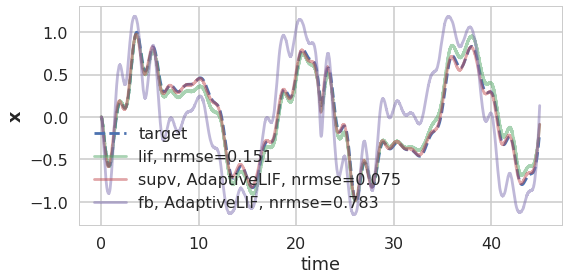

In [11]:
kwargs = dict(
    t=30,
    dt=0.0001,
    dt_sample=0.0003,
    n_neurons=100,
    freq=1,
    amp=1,
    max_rates=Default,
    intercepts=Default,
    neuron_type=nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.1),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

d_pre, d_supv, d_fb = run(optimize_h=True, **kwargs)

oracle method to compute decoders for pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

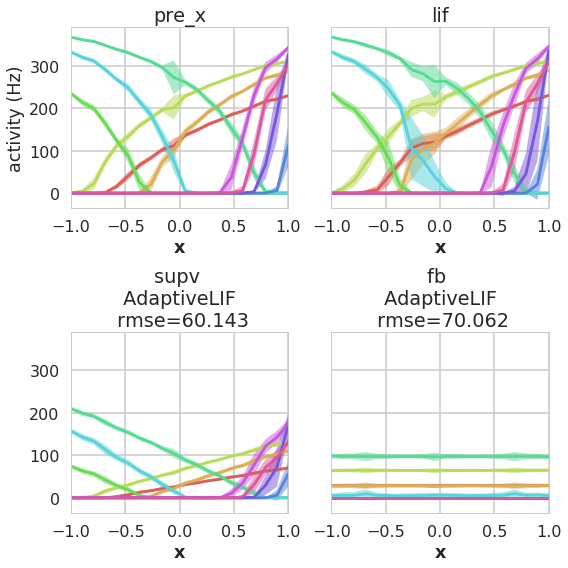

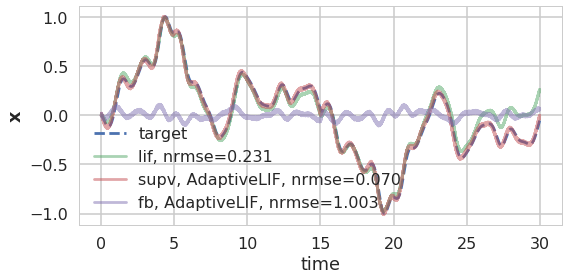

filter optimization for computing xhat_supv from spk_supv and d_supv


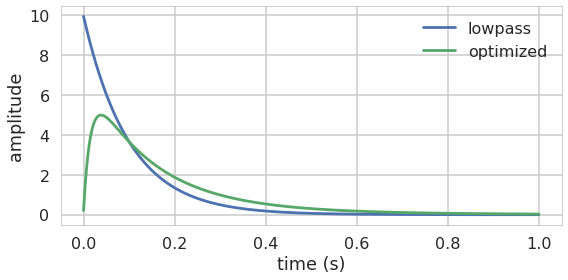

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

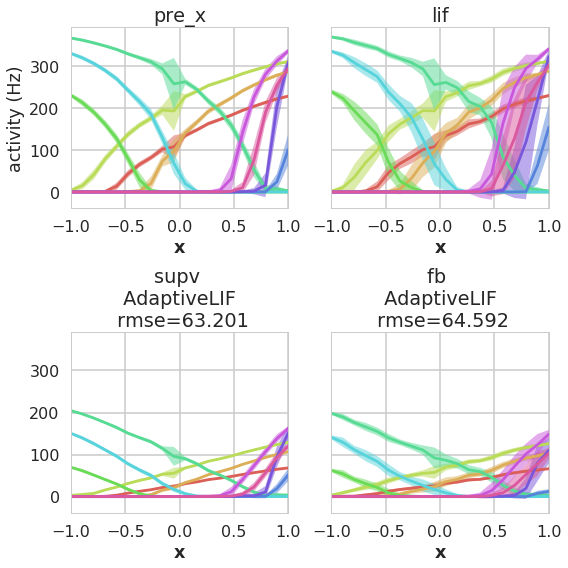

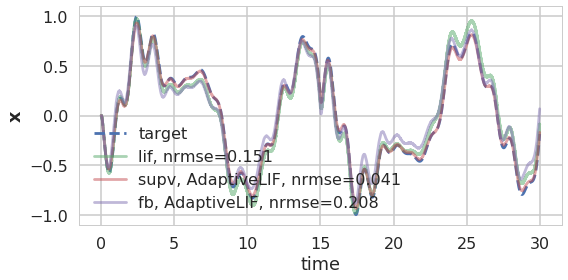

In [12]:
kwargs = dict(
    t=30,
    dt=0.0001,
    dt_sample=0.0001,
    n_neurons=100,
    freq=1,
    amp=1,
    max_rates=Default,
    intercepts=Default,
    neuron_type=nengo.AdaptiveLIF(tau_n=0.1, inc_n=0.1),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

d_pre, d_supv, d_fb = run(optimize_h=True, **kwargs)

## Wilson Neuron

### default

oracle method to compute decoders for pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

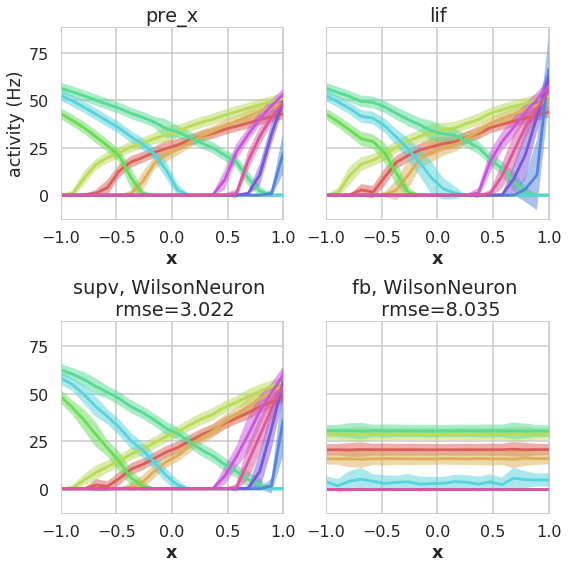

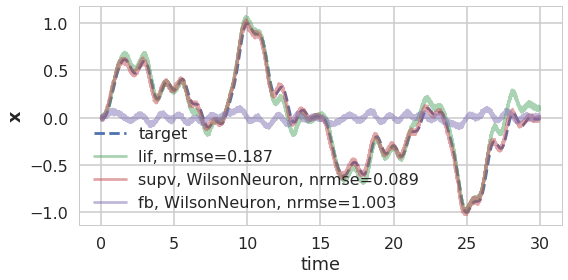

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

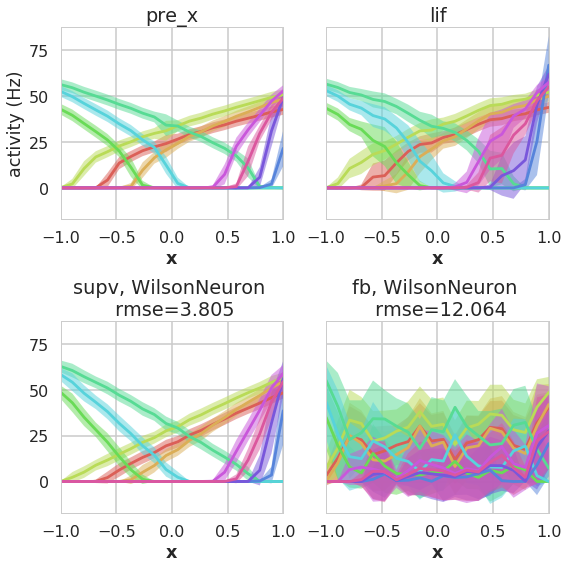

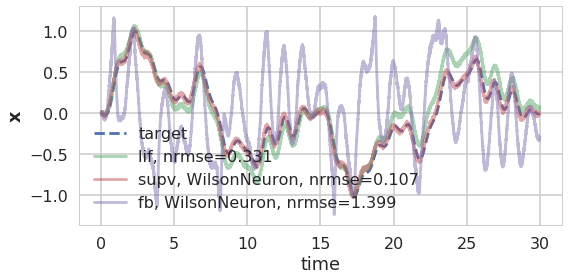

In [37]:
kwargs = dict(
    t=30,
    dt=0.00005,
    dt_sample=0.001,
    n_neurons=100,
    freq=1,
    amp=1,
    max_rates=Uniform(40, 60),
    intercepts=Default,
    neuron_type=WilsonNeuron(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

d_pre, d_supv, d_fb = run(optimize_h=False, **kwargs)

### filter

oracle method to compute decoders for pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

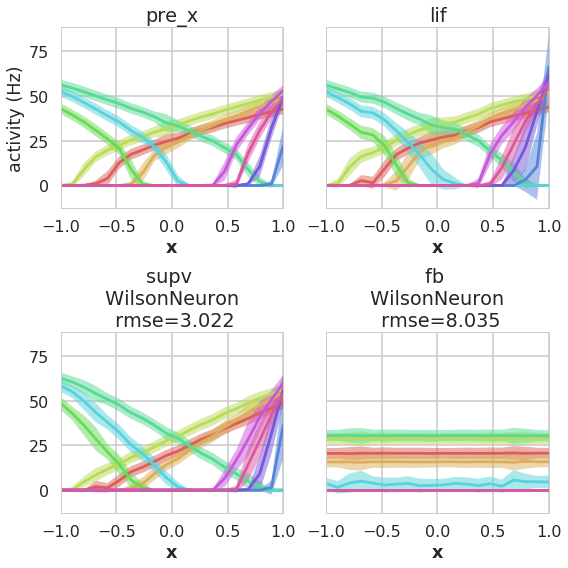

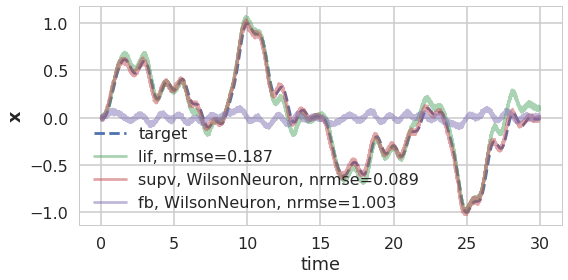

filter optimization for computing xhat_supv from spk_supv and d_supv


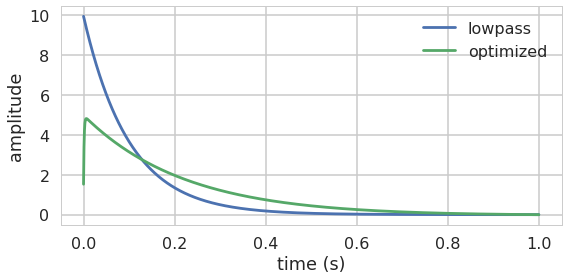

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

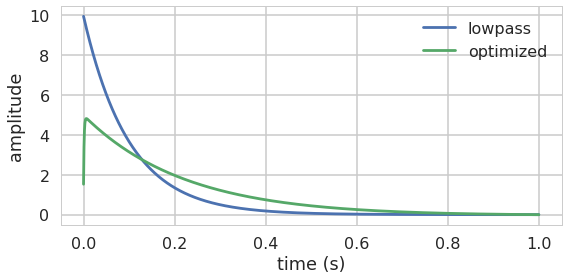

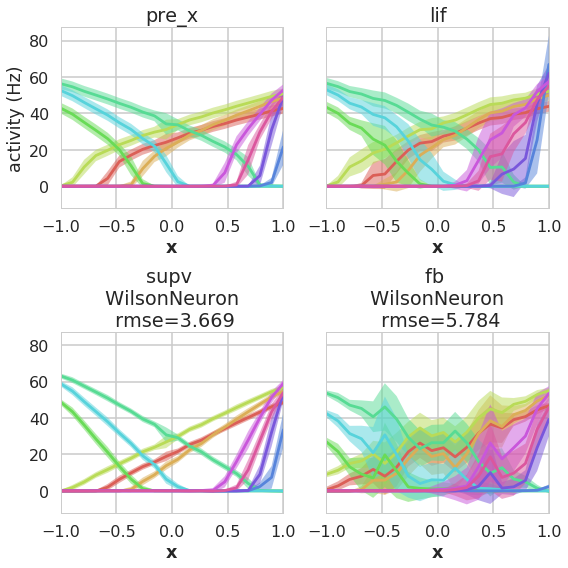

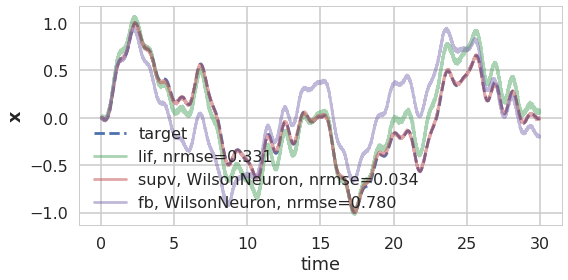

In [15]:
kwargs = dict(
    t=30,
    dt=0.00005,
    dt_sample=0.00005,
    n_neurons=100,
    freq=1,
    amp=1,
    max_rates=Uniform(40, 60),
    intercepts=Default,
    neuron_type=WilsonNeuron(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

d_pre, d_supv, d_fb = run(optimize_h=True, **kwargs)

oracle method to compute decoders for pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

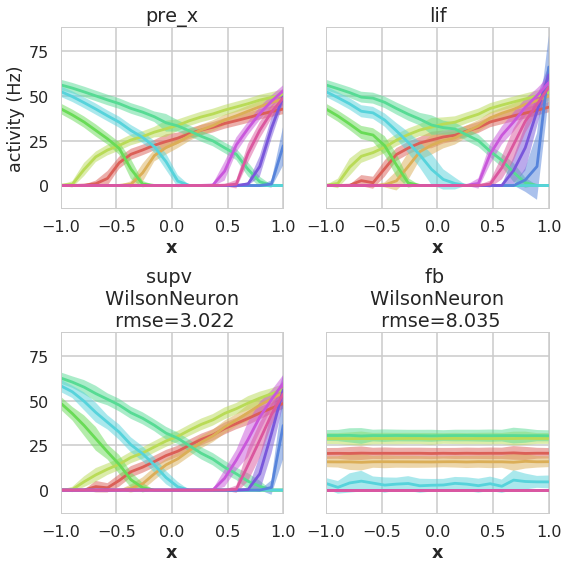

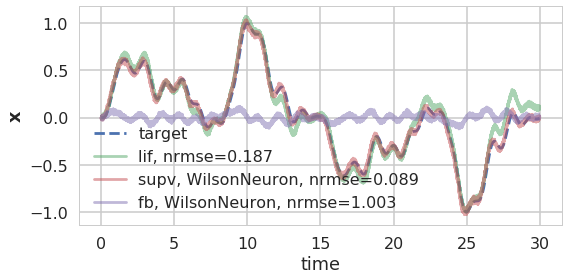

filter optimization for computing xhat_supv from spk_supv and d_supv


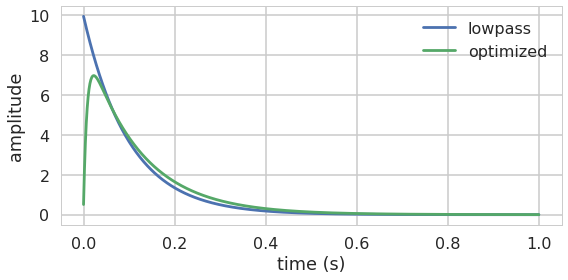

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

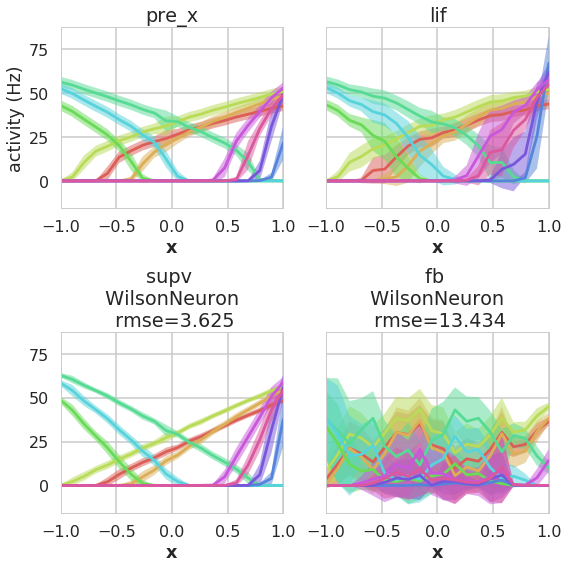

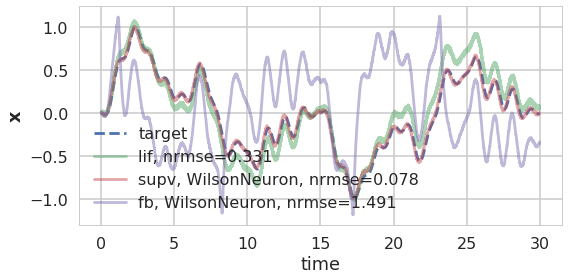

In [11]:
kwargs = dict(
    t=30,
    dt=0.00005,
    dt_sample=0.0002,
    n_neurons=100,
    freq=1,
    amp=1,
    max_rates=Uniform(40, 60),
    intercepts=Default,
    neuron_type=WilsonNeuron(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

d_pre, d_supv, d_fb = run(optimize_h=True, **kwargs)

oracle method to compute decoders for pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

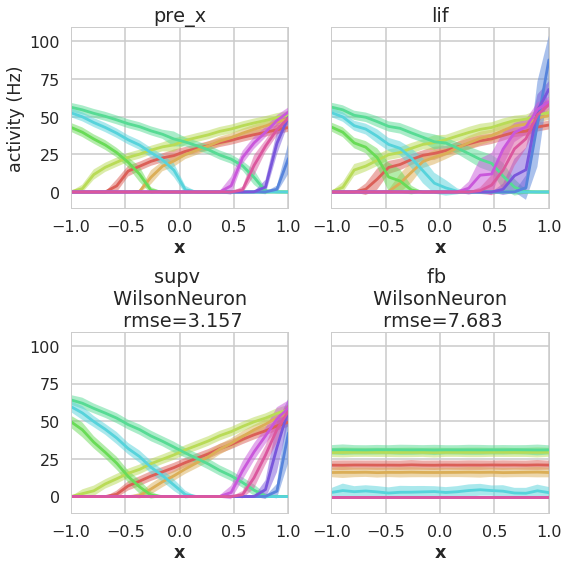

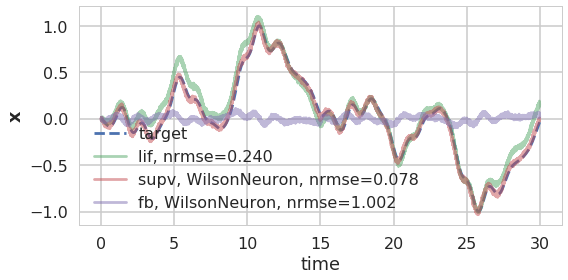

filter optimization for computing xhat_supv from spk_supv and d_supv


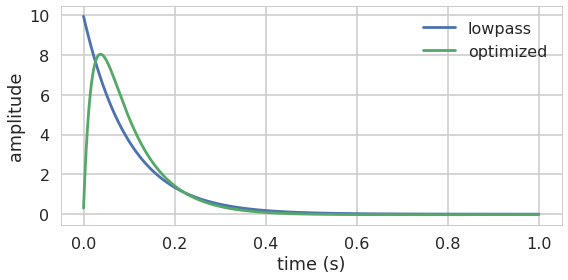

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

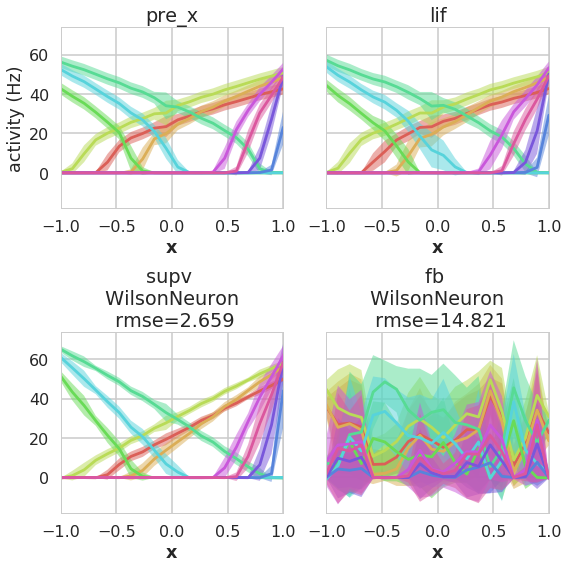

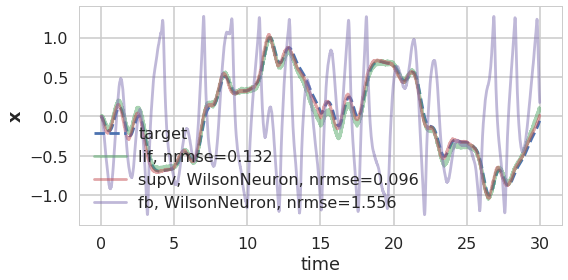

In [12]:
kwargs = dict(
    t=30,
    dt=0.00001,
    dt_sample=0.0001,
    n_neurons=100,
    freq=1,
    amp=1,
    max_rates=Uniform(40, 60),
    intercepts=Default,
    neuron_type=WilsonNeuron(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

d_pre, d_supv, d_fb = run(optimize_h=True, **kwargs)

oracle method to compute decoders for pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

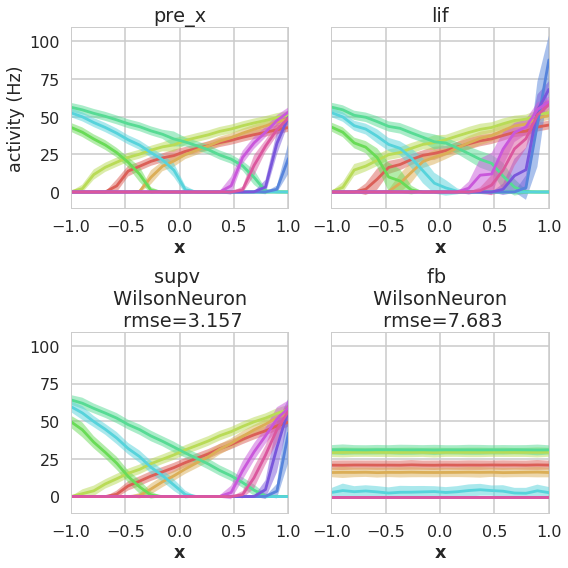

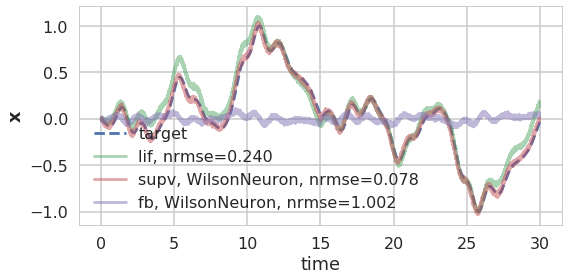

filter optimization for computing xhat_supv from spk_supv and d_supv


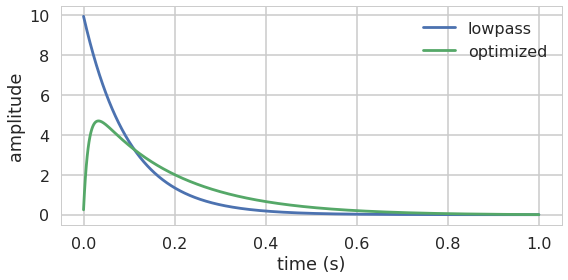

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

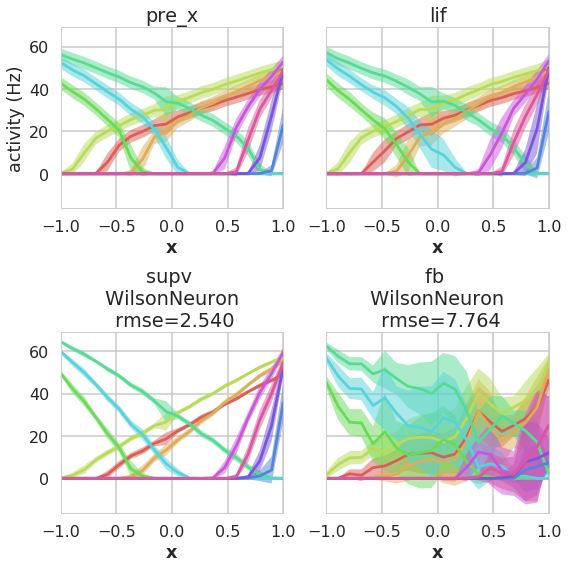

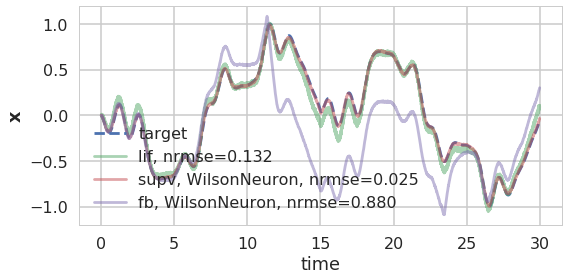

In [13]:
kwargs = dict(
    t=30,
    dt=0.00001,
    dt_sample=0.00001,
    n_neurons=100,
    freq=1,
    amp=1,
    max_rates=Uniform(40, 60),
    intercepts=Default,
    neuron_type=WilsonNeuron(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

d_pre, d_supv, d_fb = run(optimize_h=True, **kwargs)

oracle method to compute decoders for pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

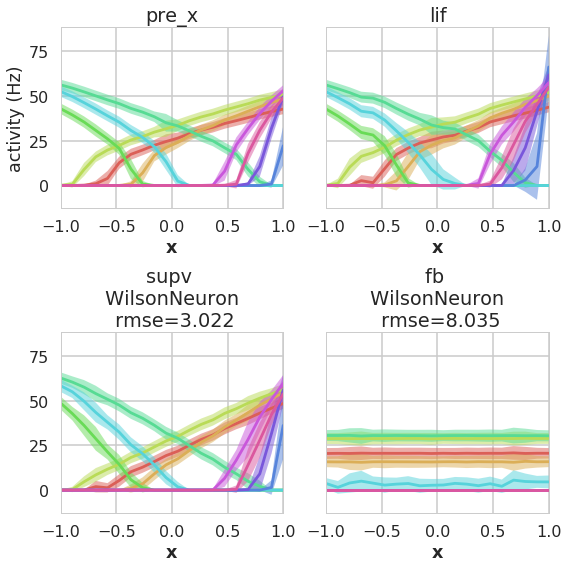

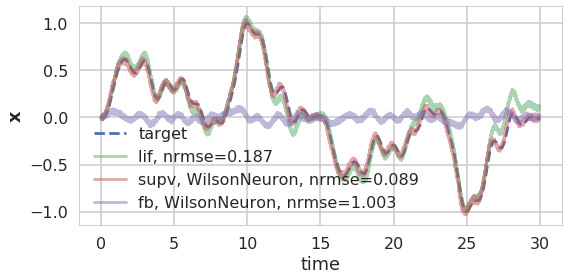

filter optimization for computing xhat_supv from spk_supv and d_supv


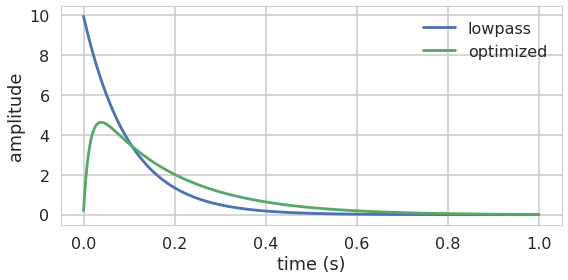

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

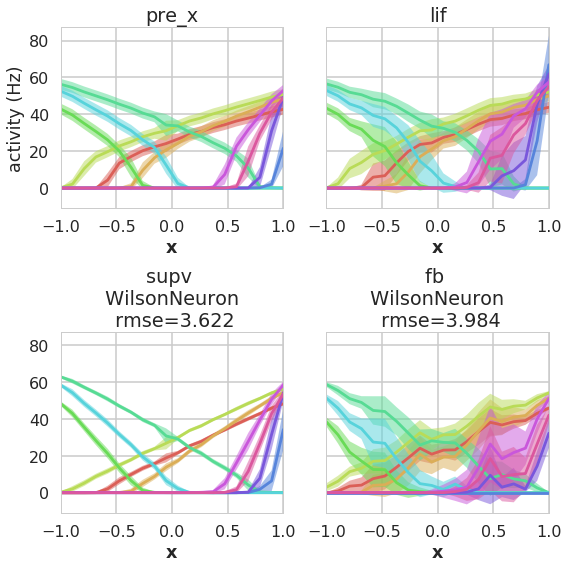

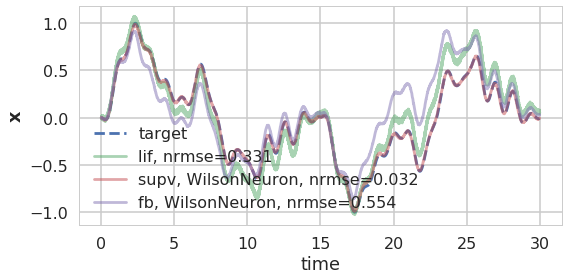

In [14]:
kwargs = dict(
    t=30,
    dt=0.00005,
    dt_sample=0.00005,
    n_neurons=100,
    freq=1,
    amp=1,
    max_rates=Uniform(40, 60),
    intercepts=Default,
    neuron_type=WilsonNeuron(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=2000,
    signal='white_noise')

d_pre, d_supv, d_fb = run(optimize_h=True, **kwargs)

oracle method to compute decoders for pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

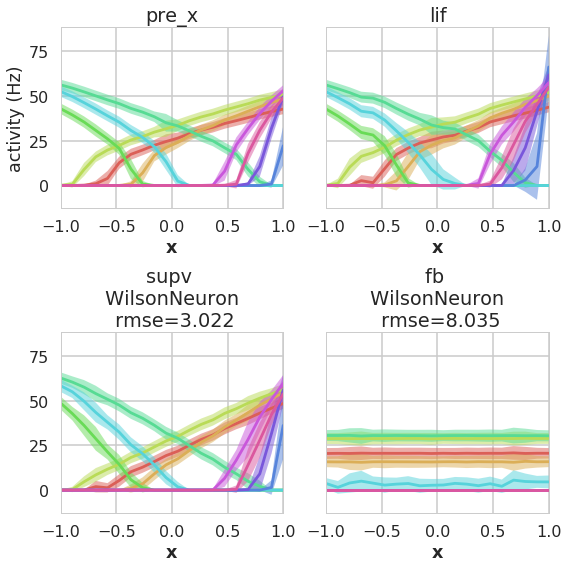

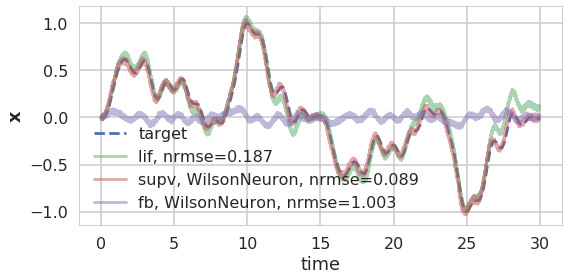

filter optimization for computing xhat_supv from spk_supv and d_supv


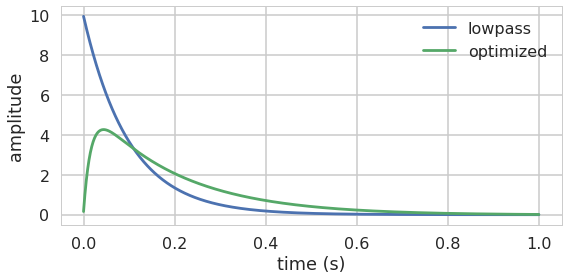

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

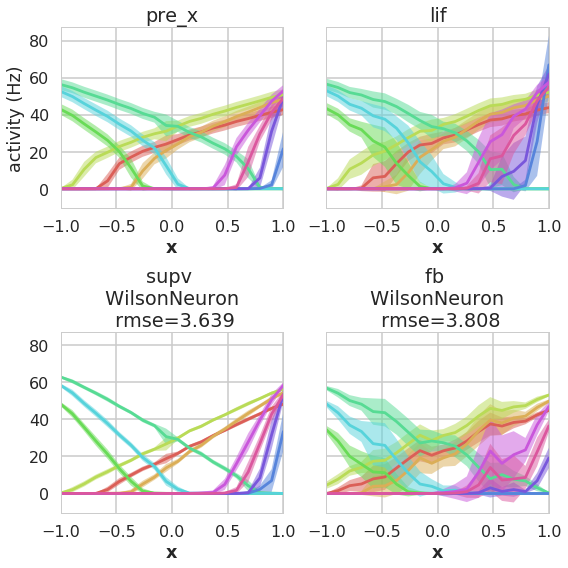

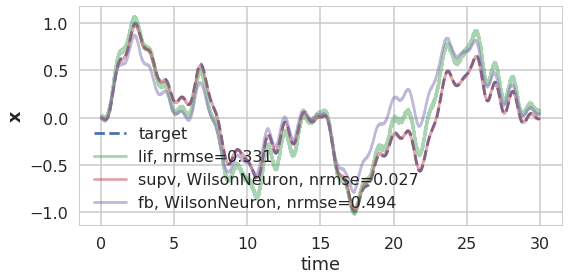

In [15]:
kwargs = dict(
    t=30,
    dt=0.00005,
    dt_sample=0.00005,
    n_neurons=100,
    freq=1,
    amp=1,
    max_rates=Uniform(40, 60),
    intercepts=Default,
    neuron_type=WilsonNeuron(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=3000,
    signal='white_noise')

d_pre, d_supv, d_fb = run(optimize_h=True, **kwargs)

oracle method to compute decoders for pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

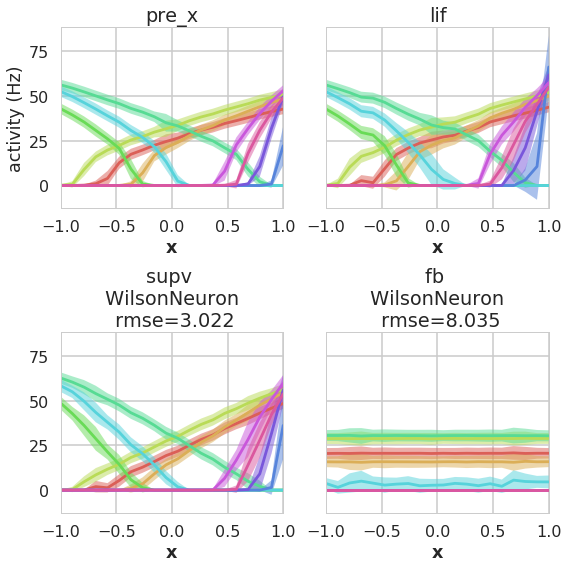

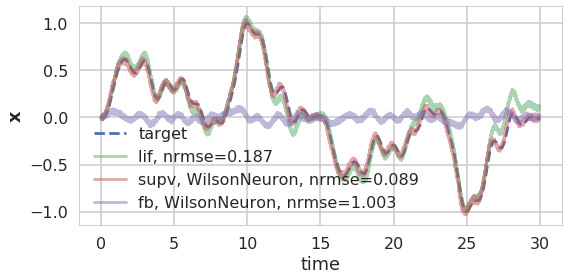

filter optimization for computing xhat_supv from spk_supv and d_supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99925491e-01 -8.15799255e-05 -1.36728818e-04]
 [ 4.99981373e-05  9.99999998e-01 -3.41826290e-09]
 [ 1.24996895e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99981373e-05]
 [1.24996895e-09]
 [2.08329453e-14]], C=[[-0.14871518  0.76356776  0.5956429 ]], D=[[0.78218904]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99844511e-01 -3.27711965e-05 -3.14945787e-04]
 [ 4.99961127e-05  9.99999999e-01 -7.87384873e-09]
 [ 1.24993521e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99961127e-05]
 [1.24993521e-09]
 [2.08325235e-14]], C=[[-3.05384386  0.05051315 -7.91663665]], D=[[2.25672759]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99991375e-01 -1.87660558e-05 -5.03958818e-05]
 [ 4.99997844e-05  1.00000000e+00 -1.25989886e-09]
 [ 1.24999641e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99997844e-05]
 [1.24999641e-09]
 [2.08332884e-14]], C=[[0.35785077 0.08014577 0.02534759]], D=[[0.97485163]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99957706e-01 -6.30037741e-05 -1.23138027e-04]
 [ 4.99989426e-05  9.99999998e-01 -3.07847238e-09]
 [ 1.24998238e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99989426e-05]
 [1.24998238e-09]
 [2.08331131e-14]], C=[[ 0.74063942 -0.85154112 -2.22646336]], D=[[1.90403278]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99957630e-01 -3.13049545e-05 -5.78669699e-05]
 [ 4.99989407e-05  9.99999999e-01 -1.44668446e-09]
 [ 1.24998235e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99989407e-05]
 [1.24998235e-09]
 [2.08331127e-14]], C=[[0.29052913 0.20684559 1.06309592]], D=[[0.08145061]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99938521e-01 -6.64874400e-05 -9.95640762e-05]
 [ 4.99984630e-05  9.99999998e-01 -2.48912741e-09]
 [ 1.24997438e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99984630e-05]
 [1.24997438e-09]
 [2.08330131e-14]], C=[[ 0.00766382 -0.21325641  0.21374862]], D=[[0.89266106]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99993566e-01 -2.71471339e-05 -5.62989569e-05]
 [ 4.99998392e-05  9.99999999e-01 -1.40747543e-09]
 [ 1.24999732e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99998392e-05]
 [1.24999732e-09]
 [2.08332998e-14]], C=[[1.10392483 0.25725953 0.95016094]], D=[[0.15614965]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99962581e-01 -3.90809932e-05 -5.33817524e-05]
 [ 4.99990645e-05  9.99999999e-01 -1.33455213e-09]
 [ 1.24998441e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99990645e-05]
 [1.24998441e-09]
 [2.08331384e-14]], C=[[0.51360452 0.74217394 0.81059507]], D=[[0.24077061]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99966269e-01 -3.98852059e-05 -6.12341701e-05]
 [ 4.99991567e-05  9.99999999e-01 -1.53086286e-09]
 [ 1.24998595e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99991567e-05]
 [1.24998595e-09]
 [2.08331577e-14]], C=[[0.33372574 1.03276165 1.219117  ]], D=[[0.00456197]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99942315e-01 -5.23573043e-05 -5.99588806e-05]
 [ 4.99985579e-05  9.99999999e-01 -1.49898643e-09]
 [ 1.24997596e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99985579e-05]
 [1.24997596e-09]
 [2.08330329e-14]], C=[[0.21193806 0.04693332 1.13940225]], D=[[0.04987437]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99960579e-01 -3.79405106e-05 -7.02096113e-05]
 [ 4.99990145e-05  9.99999999e-01 -1.75525181e-09]
 [ 1.24998357e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99990145e-05]
 [1.24998357e-09]
 [2.08331280e-14]], C=[[ 1.18518765 -0.10590763  1.07605754]], D=[[0.23369728]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99960425e-01 -3.70527273e-05 -7.81067598e-05]
 [ 4.99990106e-05  9.99999999e-01 -1.95268187e-09]
 [ 1.24998351e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99990106e-05]
 [1.24998351e-09]
 [2.08331272e-14]], C=[[0.79097989 0.17686016 0.88134906]], D=[[0.43581604]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99856182e-01 -1.02732796e-04 -1.71036713e-04]
 [ 4.99964045e-05  9.99999997e-01 -4.27602032e-09]
 [ 1.24994007e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99964045e-05]
 [1.24994007e-09]
 [2.08325843e-14]], C=[[2.95227757 1.13622664 3.13651518]], D=[[0.08315309]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99789931e-01 -1.49085355e-04 -2.50959475e-04]
 [ 4.99947481e-05  9.99999996e-01 -6.27420657e-09]
 [ 1.24991247e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99947481e-05]
 [1.24991247e-09]
 [2.08322392e-14]], C=[[4.63937144 2.70690238 4.92190076]], D=[[0.01948636]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99719153e-01 -8.71317544e-05 -4.48613177e-04]
 [ 4.99929785e-05  9.99999998e-01 -1.12158545e-08]
 [ 1.24988297e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99929785e-05]
 [1.24988297e-09]
 [2.08318705e-14]], C=[[-14.60345497  -3.05036247 -28.09867781]], D=[[4.13128697]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99848290e-01 -9.02949585e-05 -1.93027675e-04]
 [ 4.99962072e-05  9.99999998e-01 -4.82581390e-09]
 [ 1.24993679e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99962072e-05]
 [1.24993679e-09]
 [2.08325431e-14]], C=[[0.78796462 1.9023241  2.01850625]], D=[[0.47718556]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99822833e-01 -8.25469863e-05 -2.44078538e-04]
 [ 4.99955707e-05  9.99999998e-01 -6.10214364e-09]
 [ 1.24992618e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99955707e-05]
 [1.24992618e-09]
 [2.08324105e-14]], C=[[-1.45350127  0.42674416 -2.91395766]], D=[[1.59687745]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99969109e-01 -1.35615971e-04 -1.96091859e-04]
 [ 4.99992277e-05  9.99999997e-01 -4.90232171e-09]
 [ 1.24998713e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99992277e-05]
 [1.24998713e-09]
 [2.08331725e-14]], C=[[ 1.33003013 -6.42563255 -9.71904481]], D=[[3.47814845]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99583348e-01 -2.11186279e-04 -4.40607553e-04]
 [ 4.99895830e-05  9.99999995e-01 -1.10159539e-08]
 [ 1.24982638e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99895830e-05]
 [1.24982638e-09]
 [2.08311630e-14]], C=[[8.78971907 6.98933545 8.80410786]], D=[[0.00112089]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99701757e-01 -1.37651858e-04 -3.12904192e-04]
 [ 4.99925436e-05  9.99999997e-01 -7.82299370e-09]
 [ 1.24987572e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99925436e-05]
 [1.24987572e-09]
 [2.08317799e-14]], C=[[5.35730945 4.34770963 5.56015535]], D=[[0.11165681]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99627568e-01 -2.62447337e-04 -4.40953375e-04]
 [ 4.99906887e-05  9.99999993e-01 -1.10245188e-08]
 [ 1.24984481e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99906887e-05]
 [1.24984481e-09]
 [2.08313934e-14]], C=[[-4.92299598 -2.90340684 -4.96074775]], D=[[1.56239777]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99409615e-01 -2.87263777e-04 -6.04295127e-04]
 [ 4.99852390e-05  9.99999993e-01 -1.51088651e-08]
 [ 1.24975397e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99852390e-05]
 [1.24975397e-09]
 [2.08302579e-14]], C=[[-27.03393056  -5.515282   -23.50747898]], D=[[2.94445876]], analog=False)) has extra delay due to passthrough (https://github.

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99860683e-01 -1.34726545e-04 -1.64818428e-04]
 [ 4.99965170e-05  9.99999997e-01 -4.12055637e-09]
 [ 1.24994195e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99965170e-05]
 [1.24994195e-09]
 [2.08326077e-14]], C=[[2.45799633 1.05076088 2.87424465]], D=[[0.12811799]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99850259e-01 -9.49725302e-05 -1.53870112e-04]
 [ 4.99962564e-05  9.99999998e-01 -3.84684881e-09]
 [ 1.24993761e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99962564e-05]
 [1.24993761e-09]
 [2.08325534e-14]], C=[[0.48638009 1.5207031  2.24037643]], D=[[0.27204554]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99730935e-01 -1.61517511e-04 -4.03317037e-04]
 [ 4.99932731e-05  9.99999996e-01 -1.00833781e-08]
 [ 1.24988788e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99932731e-05]
 [1.24988788e-09]
 [2.08319319e-14]], C=[[6.47034728 3.15915748 8.04283612]], D=[[0.00304806]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99728082e-01 -1.59659587e-04 -4.00250793e-04]
 [ 4.99932018e-05  9.99999996e-01 -1.00067234e-08]
 [ 1.24988669e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99932018e-05]
 [1.24988669e-09]
 [2.08319170e-14]], C=[[-4.3829684  -2.8677127  -6.96762647]], D=[[1.87028923]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99923526e-01 -7.43359579e-05 -1.34372177e-04]
 [ 4.99980881e-05  9.99999998e-01 -3.35934724e-09]
 [ 1.24996814e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99980881e-05]
 [1.24996814e-09]
 [2.08329350e-14]], C=[[1.45389109 2.34329414 2.18446171]], D=[[0.18719104]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99895117e-01 -1.27421191e-04 -1.48254023e-04]
 [ 4.99973779e-05  9.99999997e-01 -3.70641536e-09]
 [ 1.24995630e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99973779e-05]
 [1.24995630e-09]
 [2.08327871e-14]], C=[[ 0.18180324 -1.15427815 -0.50227158]], D=[[1.16938671]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99920387e-01 -3.95680550e-05 -9.89072860e-05]
 [ 4.99980096e-05  9.99999999e-01 -2.47271496e-09]
 [ 1.24996683e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99980096e-05]
 [1.24996683e-09]
 [2.08329187e-14]], C=[[0.86890849 1.66002321 1.63987879]], D=[[0.17103503]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.98978268e-01 -3.96302825e-04 -1.32147341e-03]
 [ 4.99744524e-05  9.99999990e-01 -3.30424640e-08]
 [ 1.24957417e-09  4.99999998e-05  1.00000000e+00]], B=[[4.99744524e-05]
 [1.24957417e-09]
 [2.08280102e-14]], C=[[-1.11635215 14.48611806  6.54220209]], D=[[0.7525921]], analog=False)) has extra delay due to passthrough (https://github.com/nen

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99803265e-01 -1.80503902e-04 -2.45964837e-04]
 [ 4.99950815e-05  9.99999995e-01 -6.14932257e-09]
 [ 1.24991802e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99950815e-05]
 [1.24991802e-09]
 [2.08323086e-14]], C=[[-2.87412703 -2.45521203 -1.2113783 ]], D=[[1.24622608]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99825469e-01 -4.28984838e-05 -1.86363945e-04]
 [ 4.99956366e-05  9.99999999e-01 -4.65923415e-09]
 [ 1.24992728e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99956366e-05]
 [1.24992728e-09]
 [2.08324243e-14]], C=[[3.35539697 1.22521389 3.70098857]], D=[[0.00714014]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99837282e-01 -9.87928460e-05 -1.74569104e-04]
 [ 4.99959319e-05  9.99999998e-01 -4.36434596e-09]
 [ 1.24993220e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99959319e-05]
 [1.24993220e-09]
 [2.08324858e-14]], C=[[-8.9106763  -4.30755012 -8.68658542]], D=[[3.48780526]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99796587e-01 -8.77732451e-05 -2.20516072e-04]
 [ 4.99949145e-05  9.99999998e-01 -5.51308872e-09]
 [ 1.24991524e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99949145e-05]
 [1.24991524e-09]
 [2.08322738e-14]], C=[[3.9173593  1.63072741 4.07602559]], D=[[0.07589252]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99880857e-01 -1.00053190e-04 -1.31674567e-04]
 [ 4.99970214e-05  9.99999997e-01 -3.29192955e-09]
 [ 1.24995036e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99970214e-05]
 [1.24995036e-09]
 [2.08327128e-14]], C=[[1.57125107 0.73108441 1.61883539]], D=[[0.38532589]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99812051e-01 -1.28079315e-04 -1.92743236e-04]
 [ 4.99953012e-05  9.99999997e-01 -4.81873187e-09]
 [ 1.24992168e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99953012e-05]
 [1.24992168e-09]
 [2.08323544e-14]], C=[[0.07196522 0.36439853 0.78724823]], D=[[0.79579718]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99650009e-01 -3.18768336e-04 -3.78674407e-04]
 [ 4.99912498e-05  9.99999992e-01 -9.46741249e-09]
 [ 1.24985416e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99912498e-05]
 [1.24985416e-09]
 [2.08315103e-14]], C=[[-5.49113728 -4.72790069 -3.72670852]], D=[[1.49198682]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.98866087e-01 -1.12761914e-03 -1.26350079e-03]
 [ 4.99716470e-05  9.99999972e-01 -3.15934928e-08]
 [ 1.24952741e-09  4.99999995e-05  1.00000000e+00]], B=[[4.99716470e-05]
 [1.24952741e-09]
 [2.08274256e-14]], C=[[-116.1984161  -118.19126917 -126.31455567]], D=[[5.99575974]], analog=False)) has extra delay due to passthrough (https://gith

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99904069e-01 -1.05469378e-04 -1.10892483e-04]
 [ 4.99976017e-05  9.99999997e-01 -2.77235641e-09]
 [ 1.24996003e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99976017e-05]
 [1.24996003e-09]
 [2.08328337e-14]], C=[[1.7286746  1.05774465 1.86716937]], D=[[0.15815764]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99928653e-01 -5.93503317e-05 -7.28507938e-05]
 [ 4.99982163e-05  9.99999999e-01 -1.82129150e-09]
 [ 1.24997027e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99982163e-05]
 [1.24997027e-09]
 [2.08329617e-14]], C=[[0.5643943  0.91084945 1.37773958]], D=[[0.05444377]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99783060e-01 -1.97115647e-04 -2.21691567e-04]
 [ 4.99945763e-05  9.99999995e-01 -5.54248958e-09]
 [ 1.24990960e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99945763e-05]
 [1.24990960e-09]
 [2.08322034e-14]], C=[[2.41822707 0.64564193 2.38015989]], D=[[0.46324036]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99889112e-01 -1.21750581e-04 -1.26544283e-04]
 [ 4.99972278e-05  9.99999997e-01 -3.16366554e-09]
 [ 1.24995380e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99972278e-05]
 [1.24995380e-09]
 [2.08327558e-14]], C=[[1.44972911 1.66411579 2.27797243]], D=[[0.09998062]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99854924e-01 -1.18683894e-04 -1.69615016e-04]
 [ 4.99963730e-05  9.99999997e-01 -4.24047794e-09]
 [ 1.24993955e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99963730e-05]
 [1.24993955e-09]
 [2.08325777e-14]], C=[[2.75954778 2.12486997 2.97284797]], D=[[0.12371192]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99148760e-01 -8.30531310e-04 -9.29270467e-04]
 [ 4.99787162e-05  9.99999979e-01 -2.32350590e-08]
 [ 1.24964525e-09  4.99999997e-05  1.00000000e+00]], B=[[4.99787162e-05]
 [1.24964525e-09]
 [2.08288987e-14]], C=[[-46.2977748  -48.27881754 -49.18975024]], D=[[3.64555977]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99770301e-01 -6.42767559e-04 -1.15259018e-03]
 [ 4.99942574e-05  9.99999984e-01 -2.88158578e-08]
 [ 1.24990429e-09  4.99999997e-05  1.00000000e+00]], B=[[4.99942574e-05]
 [1.24990429e-09]
 [2.08321370e-14]], C=[[ -7.53152721 -48.48822376 -91.89269818]], D=[[4.98589827]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99887896e-01 -1.24623243e-04 -1.43236484e-04]
 [ 4.99971974e-05  9.99999997e-01 -3.58097901e-09]
 [ 1.24995329e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99971974e-05]
 [1.24995329e-09]
 [2.08327494e-14]], C=[[1.22429958 0.89065244 1.54581335]], D=[[0.46042842]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.96879602e-01 -1.70585991e-03 -3.13025206e-03]
 [ 4.99219498e-05  9.99999957e-01 -7.82970635e-08]
 [ 1.24869883e-09  4.99999993e-05  1.00000000e+00]], B=[[4.99219498e-05]
 [1.24869883e-09]
 [2.08170662e-14]], C=[[-1091.55237484  -597.2068905  -1069.4242804 ]], D=[[18.05541415]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99931387e-01 -4.33250549e-05 -6.86451239e-05]
 [ 4.99982847e-05  9.99999999e-01 -1.71614772e-09]
 [ 1.24997141e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99982847e-05]
 [1.24997141e-09]
 [2.08329760e-14]], C=[[0.96451778 0.37276775 1.34012454]], D=[[0.02390841]], analog=False)) has extra delay due to passthrough (https://git

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99443832e-01 -4.73995440e-04 -7.15763110e-04]
 [ 4.99860946e-05  9.99999988e-01 -1.78957369e-08]
 [ 1.24976823e-09  4.99999998e-05  1.00000000e+00]], B=[[4.99860946e-05]
 [1.24976823e-09]
 [2.08304362e-14]], C=[[-21.01405148 -23.79196019 -26.28035652]], D=[[2.83531726]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99953698e-01 -4.01644723e-05 -5.57130520e-05]
 [ 4.99988425e-05  9.99999999e-01 -1.39283705e-09]
 [ 1.24998071e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99988425e-05]
 [1.24998071e-09]
 [2.08330922e-14]], C=[[0.69460172 0.16007998 0.74149937]], D=[[0.33455252]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99725229e-01 -1.79827087e-04 -3.45200887e-04]
 [ 4.99931304e-05  9.99999996e-01 -8.63041743e-09]
 [ 1.24988551e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99931304e-05]
 [1.24988551e-09]
 [2.08319021e-14]], C=[[5.39956367 0.45560133 6.84144831]], D=[[0.0091989]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99662559e-01 -2.01498154e-04 -3.96386729e-04]
 [ 4.99915635e-05  9.99999995e-01 -9.91022564e-09]
 [ 1.24985939e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99915635e-05]
 [1.24985939e-09]
 [2.08315757e-14]], C=[[6.32039179 0.14731817 7.72550013]], D=[[0.02567416]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99749784e-01 -1.51645843e-04 -2.55411628e-04]
 [ 4.99937444e-05  9.99999996e-01 -6.38555703e-09]
 [ 1.24989574e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99937444e-05]
 [1.24989574e-09]
 [2.08320300e-14]], C=[[ 2.10305446 -0.48592346  3.92879509]], D=[[0.23098577]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99826862e-01 -1.26117769e-04 -1.90308731e-04]
 [ 4.99956714e-05  9.99999997e-01 -4.75785558e-09]
 [ 1.24992786e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99956714e-05]
 [1.24992786e-09]
 [2.08324315e-14]], C=[[2.93264819 0.61706436 3.80261132]], D=[[0.00102268]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99826192e-01 -1.56788076e-04 -1.74005556e-04]
 [ 4.99956547e-05  9.99999996e-01 -4.35026494e-09]
 [ 1.24992758e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99956547e-05]
 [1.24992758e-09]
 [2.08324280e-14]], C=[[ 1.85773116 -0.5495536   2.31857027]], D=[[0.33382335]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99875685e-01 -1.16003988e-04 -1.45034834e-04]
 [ 4.99968921e-05  9.99999997e-01 -3.62594599e-09]
 [ 1.24994820e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99968921e-05]
 [1.24994820e-09]
 [2.08326858e-14]], C=[[ 1.65212044 -0.04057997  1.59787732]], D=[[0.4491744]], analog=False)) has extra delay due to passthrough (https://github.com/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99828153e-01 -1.46957897e-04 -1.71943877e-04]
 [ 4.99957037e-05  9.99999996e-01 -4.29872004e-09]
 [ 1.24992839e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99957037e-05]
 [1.24992839e-09]
 [2.08324383e-14]], C=[[ 0.75752796 -1.32329236  0.92085518]], D=[[0.73224517]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99897761e-01 -1.01170586e-04 -1.11747773e-04]
 [ 4.99974440e-05  9.99999997e-01 -2.79374194e-09]
 [ 1.24995740e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99974440e-05]
 [1.24995740e-09]
 [2.08328008e-14]], C=[[1.07014174 0.79646968 2.13257075]], D=[[0.04585941]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99608906e-01 -3.41887390e-04 -4.22571396e-04]
 [ 4.99902221e-05  9.99999991e-01 -1.05649736e-08]
 [ 1.24983703e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99902221e-05]
 [1.24983703e-09]
 [2.08312962e-14]], C=[[ -6.47566981 -10.11219893  -5.71086989]], D=[[1.67559626]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99988106e-01 -5.90943844e-05 -8.44986840e-05]
 [ 4.99997027e-05  9.99999999e-01 -2.11247129e-09]
 [ 1.24999504e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99997027e-05]
 [1.24999504e-09]
 [2.08332714e-14]], C=[[1.45574369 0.62429168 1.58312114]], D=[[0.06323291]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99822304e-01 -2.68641256e-04 -2.69076772e-04]
 [ 4.99955575e-05  9.99999993e-01 -6.72711854e-09]
 [ 1.24992596e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99955575e-05]
 [1.24992596e-09]
 [2.08324078e-14]], C=[[1.67016663 0.5299451  3.07090321]], D=[[0.42941371]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99204067e-01 -1.15648035e-03 -1.30728579e-03]
 [ 4.99800993e-05  9.99999971e-01 -3.26864818e-08]
 [ 1.24966830e-09  4.99999995e-05  1.00000000e+00]], B=[[4.99800993e-05]
 [1.24966830e-09]
 [2.08291870e-14]], C=[[-117.10378083 -185.26316591 -192.32486077]], D=[[8.35295659]], analog=False)) has extra delay due to passthrough (https://github.

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99902436e-01 -1.14650854e-04 -1.27943026e-04]
 [ 4.99975609e-05  9.99999997e-01 -3.19862766e-09]
 [ 1.24995935e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99975609e-05]
 [1.24995935e-09]
 [2.08328252e-14]], C=[[1.38343891 0.5309826  2.07067625]], D=[[0.19082137]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99898593e-01 -1.30506629e-04 -1.60041440e-04]
 [ 4.99974648e-05  9.99999997e-01 -4.00110361e-09]
 [ 1.24995775e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99974648e-05]
 [1.24995775e-09]
 [2.08328052e-14]], C=[[2.49198282 1.86056758 3.19534166]], D=[[0.0017649]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99831353e-01 -1.47522907e-04 -1.75338986e-04]
 [ 4.99957837e-05  9.99999996e-01 -4.38359788e-09]
 [ 1.24992973e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99957837e-05]
 [1.24992973e-09]
 [2.08324549e-14]], C=[[2.12089247 0.56773134 2.81963111]], D=[[0.19601641]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99875195e-01 -1.00307501e-04 -1.33256547e-04]
 [ 4.99968798e-05  9.99999997e-01 -3.33148298e-09]
 [ 1.24994800e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99968798e-05]
 [1.24994800e-09]
 [2.08326833e-14]], C=[[1.8862241  0.62143817 2.66067507]], D=[[0.00173421]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99935727e-01 -1.17847244e-04 -1.26737447e-04]
 [ 4.99983932e-05  9.99999997e-01 -3.16847013e-09]
 [ 1.24997322e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99983932e-05]
 [1.24997322e-09]
 [2.08329986e-14]], C=[[1.93351507 0.45632276 2.1440874 ]], D=[[0.15414957]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99883772e-01 -1.10156889e-04 -1.32417161e-04]
 [ 4.99970943e-05  9.99999997e-01 -3.31049314e-09]
 [ 1.24995157e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99970943e-05]
 [1.24995157e-09]
 [2.08327280e-14]], C=[[-0.04061966 -1.35302718 -0.07508116]], D=[[1.02834859]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99959710e-01 -8.95845082e-05 -1.15654726e-04]
 [ 4.99989928e-05  9.99999998e-01 -2.89138756e-09]
 [ 1.24998321e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99989928e-05]
 [1.24998321e-09]
 [2.08331235e-14]], C=[[-0.12931151 -3.22272061 -3.01773537]], D=[[2.30460496]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99901194e-01 -1.11509608e-04 -1.22206427e-04]
 [ 4.99975298e-05  9.99999997e-01 -3.05521099e-09]
 [ 1.24995883e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99975298e-05]
 [1.24995883e-09]
 [2.08328187e-14]], C=[[ 1.05261738 -0.35963182  1.56925981]], D=[[0.35797882]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99856913e-01 -2.68851727e-04 -3.63711937e-04]
 [ 4.99964228e-05  9.99999993e-01 -9.09301529e-09]
 [ 1.24994038e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99964228e-05]
 [1.24994038e-09]
 [2.08325881e-14]], C=[[-11.80271841 -29.72816203 -35.72916182]], D=[[5.91138755]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99815732e-01 -1.70600781e-04 -1.87125107e-04]
 [ 4.99953932e-05  9.99999996e-01 -4.67827137e-09]
 [ 1.24992322e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99953932e-05]
 [1.24992322e-09]
 [2.08323736e-14]], C=[[-5.27056586 -6.28745044 -4.38630642]], D=[[2.17191711]], analog=False)) has extra delay due to passthrough (https://github.

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99845709e-01 -1.47976757e-04 -1.64424618e-04]
 [ 4.99961427e-05  9.99999996e-01 -4.11072117e-09]
 [ 1.24993571e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99961427e-05]
 [1.24993571e-09]
 [2.08325297e-14]], C=[[1.84059811 0.75419136 3.13390457]], D=[[0.04708223]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99576926e-01 -3.21445804e-04 -4.91410532e-04]
 [ 4.99894225e-05  9.99999992e-01 -1.22861297e-08]
 [ 1.24982370e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99894225e-05]
 [1.24982370e-09]
 [2.08311296e-14]], C=[[5.14325582 1.88201624 8.08938954]], D=[[0.17709555]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99810046e-01 -1.34563137e-04 -1.96525094e-04]
 [ 4.99952510e-05  9.99999997e-01 -4.91328290e-09]
 [ 1.24992085e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99952510e-05]
 [1.24992085e-09]
 [2.08323439e-14]], C=[[1.60039993 1.38879143 2.96886296]], D=[[0.24473233]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99864671e-01 -1.11896083e-04 -1.54696507e-04]
 [ 4.99966167e-05  9.99999997e-01 -3.86749991e-09]
 [ 1.24994361e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99966167e-05]
 [1.24994361e-09]
 [2.08326285e-14]], C=[[0.840839   0.63861469 2.03887691]], D=[[0.34105204]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99475292e-01 -3.97767746e-04 -6.12607614e-04]
 [ 4.99868812e-05  9.99999990e-01 -1.53165300e-08]
 [ 1.24978135e-09  4.99999998e-05  1.00000000e+00]], B=[[4.99868812e-05]
 [1.24978135e-09]
 [2.08306001e-14]], C=[[1.63532451 3.45568603 6.50059757]], D=[[0.4695714]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99239921e-01 -6.47594918e-04 -9.48850624e-04]
 [ 4.99809958e-05  9.99999984e-01 -2.37242717e-08]
 [ 1.24968324e-09  4.99999997e-05  1.00000000e+00]], B=[[4.99809958e-05]
 [1.24968324e-09]
 [2.08293737e-14]], C=[[-19.11806536 -11.52963802 -15.1062636 ]], D=[[1.79572704]], analog=False)) has extra delay due to passthrough (https://github.com/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99577436e-01 -2.59276768e-04 -4.45949810e-04]
 [ 4.99894352e-05  9.99999994e-01 -1.11495306e-08]
 [ 1.24982391e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99894352e-05]
 [1.24982391e-09]
 [2.08311322e-14]], C=[[2.85435495 3.75959979 6.27370804]], D=[[0.29673897]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99569040e-01 -4.19960394e-04 -5.73305707e-04]
 [ 4.99892253e-05  9.99999990e-01 -1.43336724e-08]
 [ 1.24982042e-09  4.99999998e-05  1.00000000e+00]], B=[[4.99892253e-05]
 [1.24982042e-09]
 [2.08310885e-14]], C=[[-1.8204814  -1.92799002  0.27040382]], D=[[0.97642222]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99758120e-01 -1.68706282e-04 -2.51431390e-04]
 [ 4.99939528e-05  9.99999996e-01 -6.28603818e-09]
 [ 1.24989921e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99939528e-05]
 [1.24989921e-09]
 [2.08320735e-14]], C=[[1.38555783 2.1786591  3.92090519]], D=[[0.22037758]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99717341e-01 -2.24371283e-04 -2.87556828e-04]
 [ 4.99929332e-05  9.99999994e-01 -7.18925942e-09]
 [ 1.24988222e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99929332e-05]
 [1.24988222e-09]
 [2.08318610e-14]], C=[[-14.36080638 -10.84334909 -12.92097961]], D=[[3.24636527]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99882390e-01 -8.75094335e-04 -1.06818783e-03]
 [ 4.99970599e-05  9.99999978e-01 -2.67052192e-08]
 [ 1.24995100e-09  4.99999996e-05  1.00000000e+00]], B=[[4.99970599e-05]
 [1.24995100e-09]
 [2.08327208e-14]], C=[[  0.43922737 -53.29774461 -57.71347797]], D=[[3.7013079]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99736157e-01 -2.05247663e-04 -2.98301350e-04]
 [ 4.99934037e-05  9.99999995e-01 -7.45786173e-09]
 [ 1.24989006e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99934037e-05]
 [1.24989006e-09]
 [2.08319591e-14]], C=[[-0.16293642  0.08127747  2.04022218]], D=[[0.65807177]], analog=False)) has extra delay due to passthrough (https://github.c

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99753829e-01 -2.25171783e-04 -2.54622078e-04]
 [ 4.99938455e-05  9.99999994e-01 -6.36581316e-09]
 [ 1.24989742e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99938455e-05]
 [1.24989742e-09]
 [2.08320511e-14]], C=[[3.17703797 3.27112764 5.08315302]], D=[[0.00194685]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99424010e-01 -4.23654550e-04 -6.31196286e-04]
 [ 4.99855990e-05  9.99999989e-01 -1.57814224e-08]
 [ 1.24975997e-09  4.99999998e-05  1.00000000e+00]], B=[[4.99855990e-05]
 [1.24975997e-09]
 [2.08303329e-14]], C=[[-7.68077921 -2.86561146 -2.20173507]], D=[[1.17435946]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99762110e-01 -2.05848196e-04 -2.79301171e-04]
 [ 4.99940526e-05  9.99999995e-01 -6.98280615e-09]
 [ 1.24990087e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99940526e-05]
 [1.24990087e-09]
 [2.08320943e-14]], C=[[4.40729264 3.14086909 5.58039943]], D=[[0.00112562]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99698522e-01 -3.39982169e-04 -4.02106433e-04]
 [ 4.99924627e-05  9.99999992e-01 -1.00531660e-08]
 [ 1.24987438e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99924627e-05]
 [1.24987438e-09]
 [2.08317630e-14]], C=[[-0.77760349 -2.88234223 -0.68271954]], D=[[1.08488009]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99815196e-01 -1.54931140e-04 -2.62692832e-04]
 [ 4.99953798e-05  9.99999996e-01 -6.56752309e-09]
 [ 1.24992300e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99953798e-05]
 [1.24992300e-09]
 [2.08323708e-14]], C=[[1.31212613 0.91838728 1.27792885]], D=[[0.75678614]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.98913945e-01 -8.11074081e-04 -1.42953123e-03]
 [ 4.99728439e-05  9.99999980e-01 -3.57447531e-08]
 [ 1.24954736e-09  4.99999997e-05  1.00000000e+00]], B=[[4.99728439e-05]
 [1.24954736e-09]
 [2.08276750e-14]], C=[[-20.88424023 -17.27627635 -27.01028015]], D=[[1.94421198]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99692860e-01 -2.51739866e-04 -3.70460596e-04]
 [ 4.99923212e-05  9.99999994e-01 -9.26198907e-09]
 [ 1.24987202e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99923212e-05]
 [1.24987202e-09]
 [2.08317335e-14]], C=[[1.15086596 0.01993076 1.17458848]], D=[[0.84149352]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99841886e-01 -1.58908609e-04 -2.05507565e-04]
 [ 4.99960471e-05  9.99999996e-01 -5.13782452e-09]
 [ 1.24993412e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99960471e-05]
 [1.24993412e-09]
 [2.08325098e-14]], C=[[ 0.58573005 -0.65695104  0.84515156]], D=[[0.79439084]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99506622e-01 -4.56227139e-04 -5.06938496e-04]
 [ 4.99876646e-05  9.99999989e-01 -1.26745048e-08]
 [ 1.24979440e-09  4.99999998e-05  1.00000000e+00]], B=[[4.99876646e-05]
 [1.24979440e-09]
 [2.08307633e-14]], C=[[-4.69535796 -4.15477266 -2.09000466]], D=[[1.20608901]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99675532e-01 -2.90299325e-04 -4.00456887e-04]
 [ 4.99918879e-05  9.99999993e-01 -1.00119637e-08]
 [ 1.24986480e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99918879e-05]
 [1.24986480e-09]
 [2.08316433e-14]], C=[[7.12423425 3.54052818 7.99148356]], D=[[0.00236614]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99503715e-01 -3.13134661e-04 -5.15925616e-04]
 [ 4.99875919e-05  9.99999992e-01 -1.28992075e-08]
 [ 1.24979319e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99875919e-05]
 [1.24979319e-09]
 [2.08307482e-14]], C=[[-27.42158053 -13.71856755 -25.9490888 ]], D=[[3.51418503]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99720912e-01 -2.12566500e-04 -3.05698930e-04]
 [ 4.99930225e-05  9.99999995e-01 -7.64282880e-09]
 [ 1.24988371e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99930225e-05]
 [1.24988371e-09]
 [2.08318796e-14]], C=[[4.14483381 2.30833354 5.43911979]], D=[[0.1105038]], analog=False)) has extra delay due to passthrough (https://github.com/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99546916e-01 -4.33892333e-04 -4.76765416e-04]
 [ 4.99886721e-05  9.99999989e-01 -1.19200357e-08]
 [ 1.24981120e-09  4.99999998e-05  1.00000000e+00]], B=[[4.99886721e-05]
 [1.24981120e-09]
 [2.08309732e-14]], C=[[5.64996174 4.36910828 9.50553439]], D=[[0.00334834]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.98783845e-01 -1.54834617e-03 -1.89024217e-03]
 [ 4.99695903e-05  9.99999961e-01 -4.72656386e-08]
 [ 1.24949312e-09  4.99999994e-05  1.00000000e+00]], B=[[4.99695903e-05]
 [1.24949312e-09]
 [2.08269970e-14]], C=[[-18.01622219 -44.73178732 -34.58363082]], D=[[1.91423728]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99823921e-01 -1.48683474e-04 -2.35680230e-04]
 [ 4.99955979e-05  9.99999996e-01 -5.89217867e-09]
 [ 1.24992663e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99955979e-05]
 [1.24992663e-09]
 [2.08324162e-14]], C=[[3.57126833 1.785122   4.71025344]], D=[[0.00079893]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99820853e-01 -1.44653706e-04 -2.28574808e-04]
 [ 4.99955212e-05  9.99999996e-01 -5.71454084e-09]
 [ 1.24992535e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99955212e-05]
 [1.24992535e-09]
 [2.08324002e-14]], C=[[3.47558434 1.67343222 4.54977151]], D=[[0.00484135]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99848741e-01 -1.51525364e-04 -2.24800868e-04]
 [ 4.99962185e-05  9.99999996e-01 -5.62016340e-09]
 [ 1.24993697e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99962185e-05]
 [1.24993697e-09]
 [2.08325455e-14]], C=[[3.09041117 1.15098472 3.69172123]], D=[[0.1789529]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99786157e-01 -1.68556005e-04 -2.74345967e-04]
 [ 4.99946538e-05  9.99999996e-01 -6.85889365e-09]
 [ 1.24991090e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99946538e-05]
 [1.24991090e-09]
 [2.08322195e-14]], C=[[2.66283879 0.74747961 3.51530624]], D=[[0.35939821]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99907410e-01 -8.85038366e-05 -1.56081574e-04]
 [ 4.99976852e-05  9.99999998e-01 -3.90209957e-09]
 [ 1.24996142e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99976852e-05]
 [1.24996142e-09]
 [2.08328511e-14]], C=[[2.29214832 0.60520058 2.80811122]], D=[[0.10047639]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99884378e-01 -8.08208472e-05 -1.69582622e-04]
 [ 4.99971094e-05  9.99999998e-01 -4.23964726e-09]
 [ 1.24995182e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99971094e-05]
 [1.24995182e-09]
 [2.08327311e-14]], C=[[2.83184717 0.76167607 3.18590866]], D=[[0.06071612]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99899469e-01 -9.19317709e-05 -1.72310983e-04]
 [ 4.99974867e-05  9.99999998e-01 -4.30784675e-09]
 [ 1.24995811e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99974867e-05]
 [1.24995811e-09]
 [2.08328097e-14]], C=[[2.27967779 0.37914216 2.6234936 ]], D=[[0.23877118]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99879200e-01 -6.30841601e-05 -1.50590784e-04]
 [ 4.99969800e-05  9.99999998e-01 -3.76484540e-09]
 [ 1.24994967e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99969800e-05]
 [1.24994967e-09]
 [2.08327041e-14]], C=[[2.07455845 0.82258884 2.84098686]], D=[[0.05677652]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99842038e-01 -1.43798792e-04 -2.30090676e-04]
 [ 4.99960509e-05  9.99999996e-01 -5.75241835e-09]
 [ 1.24993418e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99960509e-05]
 [1.24993418e-09]
 [2.08325106e-14]], C=[[2.14037544 0.37770718 2.76470674]], D=[[0.3992611]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99730682e-01 -2.03537270e-04 -3.37789750e-04]
 [ 4.99932668e-05  9.99999995e-01 -8.44512285e-09]
 [ 1.24988778e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99932668e-05]
 [1.24988778e-09]
 [2.08319305e-14]], C=[[ 3.01991501 -0.32519553  3.85956637]], D=[[0.42877979]], analog=False)) has extra delay due to passthrough (https://github.com/nen

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99879027e-01 -7.90542882e-05 -1.69705630e-04]
 [ 4.99969756e-05  9.99999998e-01 -4.24272630e-09]
 [ 1.24994959e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99969756e-05]
 [1.24994959e-09]
 [2.08327032e-14]], C=[[2.23142767 1.13767663 2.99397305]], D=[[0.1179456]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99882603e-01 -7.91100800e-05 -1.47878823e-04]
 [ 4.99970650e-05  9.99999998e-01 -3.69704291e-09]
 [ 1.24995108e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99970650e-05]
 [1.24995108e-09]
 [2.08327219e-14]], C=[[1.21467187 0.51024123 1.92369354]], D=[[0.34960917]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99755983e-01 -1.68869856e-04 -3.15144172e-04]
 [ 4.99938994e-05  9.99999996e-01 -7.87892477e-09]
 [ 1.24989832e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99938994e-05]
 [1.24989832e-09]
 [2.08320623e-14]], C=[[-0.23492812 -1.41913484  0.22781895]], D=[[0.96385922]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99886313e-01 -1.03738158e-04 -1.64065463e-04]
 [ 4.99971578e-05  9.99999997e-01 -4.10171430e-09]
 [ 1.24995263e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99971578e-05]
 [1.24995263e-09]
 [2.08327412e-14]], C=[[2.32533213 1.25977392 3.03739975]], D=[[0.0743856]], analog=False)) has extra delay due to passthrough (https://github.com/nen

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99892213e-01 -6.57356711e-05 -1.34179495e-04]
 [ 4.99973053e-05  9.99999998e-01 -3.35454765e-09]
 [ 1.24995509e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99973053e-05]
 [1.24995509e-09]
 [2.08327719e-14]], C=[[1.73522286 0.60958682 2.5227656 ]], D=[[0.05997946]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99841094e-01 -1.23152799e-04 -1.91327415e-04]
 [ 4.99960273e-05  9.99999997e-01 -4.78331206e-09]
 [ 1.24993379e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99960273e-05]
 [1.24993379e-09]
 [2.08325057e-14]], C=[[ 1.47003641 -0.00359221  2.00334397]], D=[[0.47650346]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99872327e-01 -1.10201378e-04 -1.61103211e-04]
 [ 4.99968081e-05  9.99999997e-01 -4.02766598e-09]
 [ 1.24994680e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99968081e-05]
 [1.24994680e-09]
 [2.08326684e-14]], C=[[ 1.28506362 -0.10678515  1.32097271]], D=[[0.59004902]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99698981e-01 -2.58682262e-04 -4.29383653e-04]
 [ 4.99924742e-05  9.99999994e-01 -1.07351300e-08]
 [ 1.24987457e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99924742e-05]
 [1.24987457e-09]
 [2.08317654e-14]], C=[[5.57281816 1.54556196 7.14815594]], D=[[0.16775127]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99891664e-01 -1.15410740e-04 -1.59482899e-04]
 [ 4.99972916e-05  9.99999997e-01 -3.98714448e-09]
 [ 1.24995486e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99972916e-05]
 [1.24995486e-09]
 [2.08327691e-14]], C=[[ 1.5669183  -0.23232841  1.80042838]], D=[[0.43557245]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99882198e-01 -9.11970847e-05 -1.39546196e-04]
 [ 4.99970549e-05  9.99999998e-01 -3.48872340e-09]
 [ 1.24995091e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99970549e-05]
 [1.24995091e-09]
 [2.08327198e-14]], C=[[ 0.43048945 -0.44286079  0.45150687]], D=[[0.83823268]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99919693e-01 -7.72862003e-05 -1.70231469e-04]
 [ 4.99979923e-05  9.99999998e-01 -4.25584369e-09]
 [ 1.24996654e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99979923e-05]
 [1.24996654e-09]
 [2.08329151e-14]], C=[[2.04482491 1.03676944 3.00884188]], D=[[0.11628529]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99808695e-01 -1.61332425e-04 -2.48943848e-04]
 [ 4.99952173e-05  9.99999996e-01 -6.22379467e-09]
 [ 1.24992029e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99952173e-05]
 [1.24992029e-09]
 [2.08323369e-14]], C=[[ 2.74724141 -0.7534639   2.44610012]], D=[[0.50875144]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99936222e-01 -5.01970949e-05 -8.32716625e-05]
 [ 4.99984055e-05  9.99999999e-01 -2.08181369e-09]
 [ 1.24997343e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99984055e-05]
 [1.24997343e-09]
 [2.08330012e-14]], C=[[1.28180011 0.14017133 1.52812225]], D=[[0.08247687]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99847729e-01 -1.25178148e-04 -1.90720007e-04]
 [ 4.99961932e-05  9.99999997e-01 -4.76812119e-09]
 [ 1.24993655e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99961932e-05]
 [1.24993655e-09]
 [2.08325402e-14]], C=[[1.84695523 0.28690423 2.62249507]], D=[[0.31252745]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99788988e-01 -1.54884608e-04 -3.16953714e-04]
 [ 4.99947245e-05  9.99999996e-01 -7.92412155e-09]
 [ 1.24991207e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99947245e-05]
 [1.24991207e-09]
 [2.08322343e-14]], C=[[2.39047316 1.67081677 4.01043007]], D=[[0.36741443]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99744855e-01 -1.91665037e-04 -4.50493167e-04]
 [ 4.99936211e-05  9.99999995e-01 -1.12628082e-08]
 [ 1.24989368e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99936211e-05]
 [1.24989368e-09]
 [2.08320044e-14]], C=[[1.62035528 0.7716048  2.21476264]], D=[[0.75421602]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.98784130e-01 -9.29593433e-04 -2.20597935e-03]
 [ 4.99695973e-05  9.99999977e-01 -5.51606664e-08]
 [ 1.24949324e-09  4.99999996e-05  1.00000000e+00]], B=[[4.99695973e-05]
 [1.24949324e-09]
 [2.08269984e-14]], C=[[ -73.42772035  -57.40204401 -135.52580303]], D=[[4.06991532]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99431373e-01 -4.74243128e-04 -1.10975845e-03]
 [ 4.99857831e-05  9.99999988e-01 -2.77465913e-08]
 [ 1.24976304e-09  4.99999998e-05  1.00000000e+00]], B=[[4.99857831e-05]
 [1.24976304e-09]
 [2.08303713e-14]], C=[[3.33855191 1.28383156 2.99312273]], D=[[0.86518365]], analog=False)) has extra delay due to passthrough (https://github.

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.98620502e-01 -7.17657632e-04 -2.17301044e-03]
 [ 4.99655048e-05  9.99999982e-01 -5.43377598e-08]
 [ 1.24942501e-09  4.99999997e-05  1.00000000e+00]], B=[[4.99655048e-05]
 [1.24942501e-09]
 [2.08261455e-14]], C=[[ -74.1288258   -30.36168367 -109.6803607 ]], D=[[3.52195502]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99707684e-01 -2.38200449e-04 -4.40228503e-04]
 [ 4.99926918e-05  9.99999994e-01 -1.10062488e-08]
 [ 1.24987819e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99926918e-05]
 [1.24987819e-09]
 [2.08318107e-14]], C=[[4.80886105 2.73659458 7.42959032]], D=[[0.15628993]], analog=False)) has extra delay due to passthrough (https://github.

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99707779e-01 -3.45857937e-04 -6.11760964e-04]
 [ 4.99926942e-05  9.99999991e-01 -1.52947691e-08]
 [ 1.24987823e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99926942e-05]
 [1.24987823e-09]
 [2.08318112e-14]], C=[[-21.7368385  -30.31877062 -49.9918162 ]], D=[[5.08529757]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99774578e-01 -1.88865524e-04 -3.24690217e-04]
 [ 4.99943643e-05  9.99999995e-01 -8.11756043e-09]
 [ 1.24990607e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99943643e-05]
 [1.24990607e-09]
 [2.08321592e-14]], C=[[4.4111621  1.88314585 6.38841369]], D=[[0.0163403]], analog=False)) has extra delay due to passthrough (https://github.com/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99769076e-01 -1.54076790e-04 -3.60114453e-04]
 [ 4.99942267e-05  9.99999996e-01 -9.00320786e-09]
 [ 1.24990378e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99942267e-05]
 [1.24990378e-09]
 [2.08321305e-14]], C=[[2.7851735  1.56056329 5.01094599]], D=[[0.30433681]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99600227e-01 -3.04342715e-04 -5.94679887e-04]
 [ 4.99900051e-05  9.99999992e-01 -1.48679879e-08]
 [ 1.24983341e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99900051e-05]
 [1.24983341e-09]
 [2.08312510e-14]], C=[[ 1.22600517 -1.32608015  2.59185304]], D=[[0.78212354]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99744042e-01 -1.87597928e-04 -4.07236166e-04]
 [ 4.99936008e-05  9.99999995e-01 -1.01813385e-08]
 [ 1.24989335e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99936008e-05]
 [1.24989335e-09]
 [2.08320001e-14]], C=[[ 1.71025616 -0.24895856  2.9406961 ]], D=[[0.63899084]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99478467e-01 -3.94300802e-04 -7.88070650e-04]
 [ 4.99869606e-05  9.99999990e-01 -1.97034792e-08]
 [ 1.24978267e-09  4.99999998e-05  1.00000000e+00]], B=[[4.99869606e-05]
 [1.24978267e-09]
 [2.08306166e-14]], C=[[-0.56595507 -2.81478889  0.94464614]], D=[[0.94008153]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.56871844e-01 -4.31857980e-02 -8.59086036e-02]
 [ 4.89138833e-05  9.99998912e-01 -2.16349520e-06]
 [ 1.23183182e-09  4.99999818e-05  1.00000000e+00]], B=[[4.89138833e-05]
 [1.23183182e-09]
 [2.06057330e-14]], C=[[-154874.53154009 -155569.58084663 -308919.21563203]], D=[[176.8896994]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99778144e-01 -1.57747926e-04 -3.40400410e-04]
 [ 4.99944534e-05  9.99999996e-01 -8.51032494e-09]
 [ 1.24990756e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99944534e-05]
 [1.24990756e-09]
 [2.08321778e-14]], C=[[2.54313712 1.32704742 3.86460072]], D=[[0.43240785]], analog=False)) has extra delay due to passthrough (https

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99552311e-01 -2.93102974e-04 -5.90489774e-04]
 [ 4.99888070e-05  9.99999993e-01 -1.47633461e-08]
 [ 1.24981344e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99888070e-05]
 [1.24981344e-09]
 [2.08310013e-14]], C=[[0.01202735 1.1912196  9.27528777]], D=[[0.21478645]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99821765e-01 -1.52585097e-04 -2.97916271e-04]
 [ 4.99955440e-05  9.99999996e-01 -7.44812803e-09]
 [ 1.24992573e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99955440e-05]
 [1.24992573e-09]
 [2.08324050e-14]], C=[[2.01402901 0.97182772 2.9356451 ]], D=[[0.50734757]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99719704e-01 -1.92683582e-04 -3.92728957e-04]
 [ 4.99929923e-05  9.99999995e-01 -9.81868265e-09]
 [ 1.24988320e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99929923e-05]
 [1.24988320e-09]
 [2.08318733e-14]], C=[[3.86269948 2.1170064  6.56046043]], D=[[0.16487684]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99692820e-01 -2.68508610e-04 -4.57887260e-04]
 [ 4.99923202e-05  9.99999993e-01 -1.14477676e-08]
 [ 1.24987200e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99923202e-05]
 [1.24987200e-09]
 [2.08317333e-14]], C=[[1.85364275 0.51904088 2.74407198]], D=[[0.70040109]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99816817e-01 -1.59567678e-04 -2.59807977e-04]
 [ 4.99954203e-05  9.99999996e-01 -6.49539773e-09]
 [ 1.24992367e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99954203e-05]
 [1.24992367e-09]
 [2.08323792e-14]], C=[[3.64379016 1.9501801  5.19010268]], D=[[0.00125713]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99803508e-01 -1.53298394e-04 -2.50231077e-04]
 [ 4.99950876e-05  9.99999996e-01 -6.25598182e-09]
 [ 1.24991813e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99950876e-05]
 [1.24991813e-09]
 [2.08323099e-14]], C=[[ 0.9461634  -0.54451998  1.74054789]], D=[[0.65224606]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99860313e-01 -1.47490871e-04 -2.24274767e-04]
 [ 4.99965078e-05  9.99999996e-01 -5.60699971e-09]
 [ 1.24994180e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99965078e-05]
 [1.24994180e-09]
 [2.08326058e-14]], C=[[2.13179299 0.45059359 3.02479538]], D=[[0.32569674]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99794062e-01 -1.71333086e-04 -3.11740479e-04]
 [ 4.99948514e-05  9.99999996e-01 -7.79377950e-09]
 [ 1.24991419e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99948514e-05]
 [1.24991419e-09]
 [2.08322607e-14]], C=[[2.70197938 1.92578206 5.53661068]], D=[[0.11207544]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99719187e-01 -2.03198836e-04 -4.04297147e-04]
 [ 4.99929794e-05  9.99999995e-01 -1.01079018e-08]
 [ 1.24988299e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99929794e-05]
 [1.24988299e-09]
 [2.08318707e-14]], C=[[0.25306939 0.51645316 1.94458678]], D=[[0.75954397]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99667528e-01 -2.75644443e-04 -5.01028389e-04]
 [ 4.99916878e-05  9.99999993e-01 -1.25264039e-08]
 [ 1.24986146e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99916878e-05]
 [1.24986146e-09]
 [2.08316016e-14]], C=[[-28.74708421 -25.38014438 -43.32499512]], D=[[5.32288804]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99868192e-01 -8.27813181e-05 -2.01817260e-04]
 [ 4.99967047e-05  9.99999998e-01 -5.04554235e-09]
 [ 1.24994508e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99967047e-05]
 [1.24994508e-09]
 [2.08326468e-14]], C=[[2.5829708  1.41639201 4.02514895]], D=[[0.00283958]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99942698e-01 -4.49287103e-05 -7.35931337e-05]
 [ 4.99985674e-05  9.99999999e-01 -1.83984591e-09]
 [ 1.24997612e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99985674e-05]
 [1.24997612e-09]
 [2.08330349e-14]], C=[[0.93532953 0.34270809 1.31918273]], D=[[0.10375815]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99843983e-01 -1.38526198e-04 -2.49454934e-04]
 [ 4.99960995e-05  9.99999997e-01 -6.23653552e-09]
 [ 1.24993499e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99960995e-05]
 [1.24993499e-09]
 [2.08325207e-14]], C=[[ 1.01343502 -0.35585721  0.78087743]], D=[[0.84349548]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99608820e-01 -3.41901729e-04 -5.41969810e-04]
 [ 4.99902199e-05  9.99999991e-01 -1.35501288e-08]
 [ 1.24983699e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99902199e-05]
 [1.24983699e-09]
 [2.08312957e-14]], C=[[4.7524343  0.86945622 5.77214352]], D=[[0.46758893]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99797803e-01 -1.47111654e-04 -2.86102700e-04]
 [ 4.99949449e-05  9.99999996e-01 -7.15280857e-09]
 [ 1.24991575e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99949449e-05]
 [1.24991575e-09]
 [2.08322802e-14]], C=[[ 1.92231619 -0.27401422  2.7723543 ]], D=[[0.51554564]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99801586e-01 -2.72569604e-04 -4.20226630e-04]
 [ 4.99950396e-05  9.99999993e-01 -1.05060132e-08]
 [ 1.24991732e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99950396e-05]
 [1.24991732e-09]
 [2.08322999e-14]], C=[[6.10134709 3.34797652 8.40080291]], D=[[0.00054294]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99588301e-01 -3.88562457e-04 -6.07597163e-04]
 [ 4.99897069e-05  9.99999990e-01 -1.51909716e-08]
 [ 1.24982844e-09  4.99999998e-05  1.00000000e+00]], B=[[4.99897069e-05]
 [1.24982844e-09]
 [2.08311888e-14]], C=[[ -7.45812417 -11.05723274 -11.13901671]], D=[[1.91645619]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99645407e-01 -2.44380415e-04 -4.48145547e-04]
 [ 4.99911347e-05  9.99999994e-01 -1.12043009e-08]
 [ 1.24985224e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99911347e-05]
 [1.24985224e-09]
 [2.08314863e-14]], C=[[1.75133996 0.10390367 2.46855758]], D=[[0.72462965]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99965202e-01 -1.75957016e-04 -2.55183233e-04]
 [ 4.99991301e-05  9.99999996e-01 -6.37961781e-09]
 [ 1.24998550e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99991301e-05]
 [1.24998550e-09]
 [2.08331521e-14]], C=[[3.57480902 1.65567264 5.09540171]], D=[[0.00163639]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99870983e-01 -1.05735589e-04 -2.06489770e-04]
 [ 4.99967745e-05  9.99999997e-01 -5.16235527e-09]
 [ 1.24994624e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99967745e-05]
 [1.24994624e-09]
 [2.08326614e-14]], C=[[-1.53038987 -2.08815688 -3.28217404]], D=[[1.79470337]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99743750e-01 -8.99027368e-06 -3.19901218e-04]
 [ 4.99935935e-05  1.00000000e+00 -7.99787205e-09]
 [ 1.24989322e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99935935e-05]
 [1.24989322e-09]
 [2.08319986e-14]], C=[[-25.15305475   2.34495299 -30.35695145]], D=[[5.74413039]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99801406e-01 -1.29706403e-04 -2.69743701e-04]
 [ 4.99950350e-05  9.99999997e-01 -6.74381575e-09]
 [ 1.24991725e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99950350e-05]
 [1.24991725e-09]
 [2.08322989e-14]], C=[[4.20431977 0.84705494 5.36290466]], D=[[0.00602459]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99860927e-01 -1.11310228e-04 -1.65927885e-04]
 [ 4.99965231e-05  9.99999997e-01 -4.14829328e-09]
 [ 1.24994205e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99965231e-05]
 [1.24994205e-09]
 [2.08326090e-14]], C=[[ 1.5891696  -0.32586096  2.01655289]], D=[[0.39238282]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99830642e-01 -1.04747642e-04 -2.06946948e-04]
 [ 4.99957659e-05  9.99999997e-01 -5.17381974e-09]
 [ 1.24992943e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99957659e-05]
 [1.24992943e-09]
 [2.08324512e-14]], C=[[3.23228242 0.95667089 4.12587197]], D=[[0.0032415]], analog=False)) has extra delay due to passthrough (https://github.com/nen

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99826018e-01 -8.81741838e-05 -2.01835479e-04]
 [ 4.99956503e-05  9.99999998e-01 -5.04603330e-09]
 [ 1.24992750e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99956503e-05]
 [1.24992750e-09]
 [2.08324271e-14]], C=[[ 2.11519626 -0.33431516  2.41370936]], D=[[0.40211221]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99859706e-01 -8.17142949e-05 -1.66982770e-04]
 [ 4.99964926e-05  9.99999998e-01 -4.17466687e-09]
 [ 1.24994154e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99964926e-05]
 [1.24994154e-09]
 [2.08326026e-14]], C=[[2.16910166 0.17518237 2.55382182]], D=[[0.23535743]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99808324e-01 -1.30964878e-04 -2.44735929e-04]
 [ 4.99952080e-05  9.99999997e-01 -6.11859371e-09]
 [ 1.24992013e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99952080e-05]
 [1.24992013e-09]
 [2.08323350e-14]], C=[[ 0.76017    -1.04994063  1.00701613]], D=[[0.79428447]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99831123e-01 -1.19325931e-04 -2.04317146e-04]
 [ 4.99957780e-05  9.99999997e-01 -5.10807243e-09]
 [ 1.24992963e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99957780e-05]
 [1.24992963e-09]
 [2.08324537e-14]], C=[[3.40370849 0.93152179 4.07139998]], D=[[0.00374093]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99801180e-01 -1.55860562e-04 -2.60892557e-04]
 [ 4.99950294e-05  9.99999996e-01 -6.52253007e-09]
 [ 1.24991716e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99950294e-05]
 [1.24991716e-09]
 [2.08322978e-14]], C=[[3.40095012 0.43525294 4.56937382]], D=[[0.12436759]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99857912e-01 -8.80676507e-05 -1.79551840e-04]
 [ 4.99964477e-05  9.99999998e-01 -4.48890231e-09]
 [ 1.24994080e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99964477e-05]
 [1.24994080e-09]
 [2.08325933e-14]], C=[[2.25607871 0.30423831 2.87047249]], D=[[0.20071313]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99759080e-01 -7.85146486e-05 -2.65172207e-04]
 [ 4.99939768e-05  9.99999998e-01 -6.62957141e-09]
 [ 1.24989961e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99939768e-05]
 [1.24989961e-09]
 [2.08320785e-14]], C=[[4.02568048 0.89431052 4.36270068]], D=[[0.17748259]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99711341e-01 -1.36612790e-04 -3.17623092e-04]
 [ 4.99927832e-05  9.99999997e-01 -7.94095937e-09]
 [ 1.24987972e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99927832e-05]
 [1.24987972e-09]
 [2.08318298e-14]], C=[[6.05962787 1.77825374 6.3445581 ]], D=[[0.00138836]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99788230e-01 -9.28093683e-05 -2.21836277e-04]
 [ 4.99947056e-05  9.99999998e-01 -5.54610269e-09]
 [ 1.24991176e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99947056e-05]
 [1.24991176e-09]
 [2.08322303e-14]], C=[[2.27904179 0.33965123 2.76122223]], D=[[0.37771002]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99739015e-01 -9.63337851e-05 -2.84786951e-04]
 [ 4.99934751e-05  9.99999998e-01 -7.11998351e-09]
 [ 1.24989125e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99934751e-05]
 [1.24989125e-09]
 [2.08319739e-14]], C=[[4.82393605 1.37235437 5.08207744]], D=[[0.10785691]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99718875e-01 -8.89571326e-05 -2.84198952e-04]
 [ 4.99929716e-05  9.99999998e-01 -7.10530674e-09]
 [ 1.24988286e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99929716e-05]
 [1.24988286e-09]
 [2.08318690e-14]], C=[[ 3.7059534  -0.49752201  3.72698896]], D=[[0.34439148]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99763709e-01 -9.04666223e-05 -2.51972899e-04]
 [ 4.99940925e-05  9.99999998e-01 -6.29957059e-09]
 [ 1.24990154e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99940925e-05]
 [1.24990154e-09]
 [2.08321026e-14]], C=[[4.07600727 0.05392629 4.55740287]], D=[[0.09576299]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99706752e-01 -8.16093700e-05 -3.41098599e-04]
 [ 4.99926685e-05  9.99999998e-01 -8.52788180e-09]
 [ 1.24987780e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99926685e-05]
 [1.24987780e-09]
 [2.08318059e-14]], C=[[5.05822584 1.5078446  5.97128693]], D=[[0.12482617]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99532899e-01 -1.07407239e-04 -5.14320381e-04]
 [ 4.99883216e-05  9.99999997e-01 -1.28590108e-08]
 [ 1.24980535e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99883216e-05]
 [1.24980535e-09]
 [2.08309002e-14]], C=[[-2.31301144 -0.61113234 -2.82995449]], D=[[1.27505166]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99519597e-01 -1.40176905e-04 -5.24393372e-04]
 [ 4.99879890e-05  9.99999996e-01 -1.31108842e-08]
 [ 1.24979981e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99879890e-05]
 [1.24979981e-09]
 [2.08308309e-14]], C=[[ 8.92111408  1.60568059 10.39611537]], D=[[0.00898652]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99562782e-01 -1.58673095e-04 -4.60771815e-04]
 [ 4.99890688e-05  9.99999996e-01 -1.15201350e-08]
 [ 1.24981781e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99890688e-05]
 [1.24981781e-09]
 [2.08310559e-14]], C=[[-36.63087756 -15.58626809 -37.55012523]], D=[[5.07380776]], analog=False)) has extra delay due to passthrough (https://github.

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99737366e-01 -1.15848600e-04 -2.82734711e-04]
 [ 4.99934339e-05  9.99999997e-01 -7.06867722e-09]
 [ 1.24989056e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99934339e-05]
 [1.24989056e-09]
 [2.08319653e-14]], C=[[4.80730714 1.17838506 5.63138863]], D=[[0.00425224]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99753418e-01 -4.48667308e-05 -2.61736393e-04]
 [ 4.99938352e-05  9.99999999e-01 -6.54367878e-09]
 [ 1.24989725e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99938352e-05]
 [1.24989725e-09]
 [2.08320490e-14]], C=[[4.30998534 0.45839145 4.76744302]], D=[[0.0893786]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99701536e-01 -1.11734022e-04 -2.99558514e-04]
 [ 4.99925381e-05  9.99999997e-01 -7.48933543e-09]
 [ 1.24987563e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99925381e-05]
 [1.24987563e-09]
 [2.08317787e-14]], C=[[-16.85456251  -7.86051841 -16.0799456 ]], D=[[3.68354013]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99667816e-01 -1.45449688e-04 -3.57814613e-04]
 [ 4.99916950e-05  9.99999996e-01 -8.94586065e-09]
 [ 1.24986158e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99916950e-05]
 [1.24986158e-09]
 [2.08316030e-14]], C=[[6.13024448 1.03944823 6.18467079]], D=[[0.13591518]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99773870e-01 -8.80879163e-05 -2.52931788e-04]
 [ 4.99943466e-05  9.99999998e-01 -6.32353304e-09]
 [ 1.24990577e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99943466e-05]
 [1.24990577e-09]
 [2.08321555e-14]], C=[[ 1.4830797  -0.02042004  1.80335099]], D=[[0.64355072]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99492222e-01 -2.08819618e-04 -5.09147224e-04]
 [ 4.99873045e-05  9.99999995e-01 -1.27297581e-08]
 [ 1.24978840e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99873045e-05]
 [1.24978840e-09]
 [2.08306883e-14]], C=[[ 4.41912159 -0.39184462  4.76710481]], D=[[0.53197286]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99767882e-01 -1.14796718e-04 -2.75734962e-04]
 [ 4.99941968e-05  9.99999997e-01 -6.89364077e-09]
 [ 1.24990328e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99941968e-05]
 [1.24990328e-09]
 [2.08321243e-14]], C=[[ 0.72203773 -0.52410653  1.02832777]], D=[[0.81355131]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99881025e-01 -1.08582006e-04 -3.71197840e-04]
 [ 4.99970256e-05  9.99999997e-01 -9.28013003e-09]
 [ 1.24995043e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99970256e-05]
 [1.24995043e-09]
 [2.08327137e-14]], C=[[5.93600527 0.42949118 6.15997841]], D=[[0.17030606]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99779501e-01 -8.96220223e-05 -2.26363030e-04]
 [ 4.99944873e-05  9.99999998e-01 -5.65928373e-09]
 [ 1.24990812e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99944873e-05]
 [1.24990812e-09]
 [2.08321848e-14]], C=[[ 0.61283722 -0.30646719  1.14355888]], D=[[0.74743384]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99909191e-01 -1.56152547e-04 -4.13274342e-04]
 [ 4.99977298e-05  9.99999996e-01 -1.03320149e-08]
 [ 1.24996216e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99977298e-05]
 [1.24996216e-09]
 [2.08328604e-14]], C=[[6.71888524 1.32953289 8.2185193 ]], D=[[0.00572751]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99418795e-01 -2.84317584e-04 -6.14001303e-04]
 [ 4.99854685e-05  9.99999993e-01 -1.53515199e-08]
 [ 1.24975780e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99854685e-05]
 [1.24975780e-09]
 [2.08303057e-14]], C=[[ 5.36337097 -0.03054056  7.58461034]], D=[[0.38254154]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99143276e-01 -3.77041493e-04 -9.36766351e-04]
 [ 4.99785789e-05  9.99999991e-01 -2.34225042e-08]
 [ 1.24964296e-09  4.99999998e-05  1.00000000e+00]], B=[[4.99785789e-05]
 [1.24964296e-09]
 [2.08288701e-14]], C=[[-5.03961787 -6.59529329 -4.48129083]], D=[[1.23908688]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99783653e-01 -5.92816795e-05 -2.63776029e-04]
 [ 4.99945911e-05  9.99999999e-01 -6.59463854e-09]
 [ 1.24990985e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99945911e-05]
 [1.24990985e-09]
 [2.08322065e-14]], C=[[ 0.99780533 -0.06771399  1.45716263]], D=[[0.72381778]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99953671e-01 -1.63670360e-05 -5.49635061e-05]
 [ 4.99988418e-05  1.00000000e+00 -1.37409826e-09]
 [ 1.24998070e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99988418e-05]
 [1.24998070e-09]
 [2.08330920e-14]], C=[[1.03365929 0.30222275 1.09888676]], D=[[0.0003719]], analog=False)) has extra delay due to passthrough (https://github.com/nen

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99521112e-01 -2.31274162e-04 -5.75953633e-04]
 [ 4.99880269e-05  9.99999994e-01 -1.43999903e-08]
 [ 1.24980044e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99880269e-05]
 [1.24980044e-09]
 [2.08308388e-14]], C=[[7.90252829 2.7306312  9.19053493]], D=[[0.20233734]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.97734614e-01 -1.08891896e-03 -2.45971849e-03]
 [ 4.99433442e-05  9.99999973e-01 -6.15162060e-08]
 [ 1.24905556e-09  4.99999995e-05  1.00000000e+00]], B=[[4.99433442e-05]
 [1.24905556e-09]
 [2.08215265e-14]], C=[[-837.12005819 -408.07719978 -903.25122903]], D=[[19.34006098]], analog=False)) has extra delay due to passthrough (https://github

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99814798e-01 -6.98430224e-05 -1.93665992e-04]
 [ 4.99953698e-05  9.99999998e-01 -4.84179927e-09]
 [ 1.24992283e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99953698e-05]
 [1.24992283e-09]
 [2.08323687e-14]], C=[[-0.17487394 -1.04369036 -0.21145523]], D=[[1.05458771]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99449285e-01 -2.49708302e-04 -5.96939150e-04]
 [ 4.99862309e-05  9.99999994e-01 -1.49248489e-08]
 [ 1.24977051e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99862309e-05]
 [1.24977051e-09]
 [2.08304646e-14]], C=[[-31.26578179 -16.75511855 -33.32395058]], D=[[3.79046648]], analog=False)) has extra delay due to passthrough (https://github.

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99822081e-01 -1.01308774e-04 -2.23383139e-04]
 [ 4.99955519e-05  9.99999997e-01 -5.58474409e-09]
 [ 1.24992586e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99955519e-05]
 [1.24992586e-09]
 [2.08324066e-14]], C=[[3.07179541 0.80250771 3.19584963]], D=[[0.28473444]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.98652551e-01 -4.68418928e-04 -1.37162694e-03]
 [ 4.99663063e-05  9.99999988e-01 -3.42983796e-08]
 [ 1.24943838e-09  4.99999998e-05  1.00000000e+00]], B=[[4.99663063e-05]
 [1.24943838e-09]
 [2.08263126e-14]], C=[[-47.624822     0.80464527 -42.05558432]], D=[[2.53202167]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99799106e-01 -6.29335628e-05 -2.30688772e-04]
 [ 4.99949775e-05  9.99999998e-01 -5.76741242e-09]
 [ 1.24991629e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99949775e-05]
 [1.24991629e-09]
 [2.08322870e-14]], C=[[3.22939023 0.67239811 4.23630989]], D=[[0.08190496]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99681062e-01 -1.85343828e-04 -3.89050070e-04]
 [ 4.99920262e-05  9.99999995e-01 -9.72676885e-09]
 [ 1.24986710e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99920262e-05]
 [1.24986710e-09]
 [2.08316721e-14]], C=[[ 0.5626783  -1.52450344  0.81153956]], D=[[0.89571906]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99790778e-01 -6.64474012e-05 -2.24194350e-04]
 [ 4.99947693e-05  9.99999998e-01 -5.60505420e-09]
 [ 1.24991282e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99947693e-05]
 [1.24991282e-09]
 [2.08322436e-14]], C=[[2.90251563 1.16174381 4.05575617]], D=[[0.0955767]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99816880e-01 -6.63832510e-05 -2.01522448e-04]
 [ 4.99954219e-05  9.99999998e-01 -5.03821497e-09]
 [ 1.24992370e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99954219e-05]
 [1.24992370e-09]
 [2.08323795e-14]], C=[[3.78940599 0.65490873 4.02634498]], D=[[0.00110971]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99271265e-01 -2.66664548e-04 -7.78386515e-04]
 [ 4.99817795e-05  9.99999993e-01 -1.94620272e-08]
 [ 1.24969631e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99817795e-05]
 [1.24969631e-09]
 [2.08295370e-14]], C=[[3.70095883 1.5331285  6.81674968]], D=[[0.56228265]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99766554e-01 -1.72153701e-04 -3.23745489e-04]
 [ 4.99941637e-05  9.99999996e-01 -8.09395216e-09]
 [ 1.24990273e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99941637e-05]
 [1.24990273e-09]
 [2.08321174e-14]], C=[[4.62978278 1.85244075 6.4647495 ]], D=[[0.00168572]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99824413e-01 -1.23244395e-04 -2.55286410e-04]
 [ 4.99956102e-05  9.99999997e-01 -6.38234703e-09]
 [ 1.24992684e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99956102e-05]
 [1.24992684e-09]
 [2.08324188e-14]], C=[[3.60447967 1.49762842 5.05265729]], D=[[0.01048127]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99793824e-01 -1.40247608e-04 -3.06933690e-04]
 [ 4.99948455e-05  9.99999996e-01 -7.67360596e-09]
 [ 1.24991409e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99948455e-05]
 [1.24991409e-09]
 [2.08322594e-14]], C=[[3.99701332 0.92354312 4.88853611]], D=[[0.20373157]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99496850e-01 -2.85931598e-04 -5.90923941e-04]
 [ 4.99874202e-05  9.99999993e-01 -1.47743377e-08]
 [ 1.24979033e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99874202e-05]
 [1.24979033e-09]
 [2.08307124e-14]], C=[[ 8.83623321  2.41366443 11.73565037]], D=[[0.00725822]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99779404e-01 -1.47684313e-04 -2.97113957e-04]
 [ 4.99944849e-05  9.99999996e-01 -7.42812205e-09]
 [ 1.24990808e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99944849e-05]
 [1.24990808e-09]
 [2.08321843e-14]], C=[[3.92387912 0.89650059 4.71801731]], D=[[0.20611321]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99686427e-01 -1.80446131e-04 -4.06165238e-04]
 [ 4.99921603e-05  9.99999995e-01 -1.01546617e-08]
 [ 1.24986934e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99921603e-05]
 [1.24986934e-09]
 [2.08317000e-14]], C=[[4.05267168 0.83218999 5.96516303]], D=[[0.26578801]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99816065e-01 -1.13522063e-04 -2.23243243e-04]
 [ 4.99954015e-05  9.99999997e-01 -5.58125218e-09]
 [ 1.24992336e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99954015e-05]
 [1.24992336e-09]
 [2.08323753e-14]], C=[[2.19151522 0.04844181 2.84150393]], D=[[0.36364421]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99847654e-01 -1.02473645e-04 -2.14267584e-04]
 [ 4.99961913e-05  9.99999997e-01 -5.35682562e-09]
 [ 1.24993652e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99961913e-05]
 [1.24993652e-09]
 [2.08325398e-14]], C=[[2.57751377 0.83326409 3.39848356]], D=[[0.20701381]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99676166e-01 -2.34097070e-04 -4.16569604e-04]
 [ 4.99919038e-05  9.99999994e-01 -1.04148023e-08]
 [ 1.24986506e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99919038e-05]
 [1.24986506e-09]
 [2.08316466e-14]], C=[[ 2.42254338 -1.04643454  1.75077198]], D=[[0.78989244]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99597180e-01 -2.68485912e-04 -5.73265686e-04]
 [ 4.99899289e-05  9.99999993e-01 -1.43326045e-08]
 [ 1.24983214e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99899289e-05]
 [1.24983214e-09]
 [2.08312351e-14]], C=[[ 4.55442149 -0.75075985  6.63930623]], D=[[0.42103905]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99882398e-01 -1.75068957e-04 -3.15989548e-04]
 [ 4.99970599e-05  9.99999996e-01 -7.89989354e-09]
 [ 1.24995100e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99970599e-05]
 [1.24995100e-09]
 [2.08327208e-14]], C=[[ 4.2383878  -0.21923763  2.29675222]], D=[[0.63659919]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99731170e-01 -1.81049862e-04 -3.83238613e-04]
 [ 4.99932790e-05  9.99999995e-01 -9.58139467e-09]
 [ 1.24988798e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99932790e-05]
 [1.24988798e-09]
 [2.08319331e-14]], C=[[5.29290016 2.48881515 7.64659653]], D=[[0.00250544]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99447438e-01 -2.47572437e-04 -5.63605250e-04]
 [ 4.99861847e-05  9.99999994e-01 -1.40914292e-08]
 [ 1.24976974e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99861847e-05]
 [1.24976974e-09]
 [2.08304549e-14]], C=[[5.25938913 0.90563373 7.07334859]], D=[[0.37266427]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99743124e-01 -1.18597808e-04 -3.05284732e-04]
 [ 4.99935778e-05  9.99999997e-01 -7.63244509e-09]
 [ 1.24989296e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99935778e-05]
 [1.24989296e-09]
 [2.08319953e-14]], C=[[4.47713737 1.3342893  6.10620431]], D=[[4.49787077e-05]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99765791e-01 -1.17211836e-04 -2.53356608e-04]
 [ 4.99941446e-05  9.99999997e-01 -6.33416248e-09]
 [ 1.24990241e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99941446e-05]
 [1.24990241e-09]
 [2.08321134e-14]], C=[[ 2.08607832 -0.53326147  2.66856131]], D=[[0.47342033]], analog=False)) has extra delay due to passthrough (https://github.co

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99807859e-01 -1.81559621e-04 -3.14997147e-04]
 [ 4.99951964e-05  9.99999995e-01 -7.87518088e-09]
 [ 1.24991994e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99951964e-05]
 [1.24991994e-09]
 [2.08323326e-14]], C=[[6.02899877 1.11951795 6.27816295]], D=[[0.00355291]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99783190e-01 -1.26936572e-04 -2.53796830e-04]
 [ 4.99945796e-05  9.99999997e-01 -6.34515004e-09]
 [ 1.24990966e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99945796e-05]
 [1.24990966e-09]
 [2.08322040e-14]], C=[[ 1.17718011 -0.42366185  1.73320256]], D=[[0.65858229]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99853050e-01 -1.07322203e-04 -2.01609323e-04]
 [ 4.99963262e-05  9.99999997e-01 -5.04035652e-09]
 [ 1.24993877e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99963262e-05]
 [1.24993877e-09]
 [2.08325679e-14]], C=[[2.41084052 0.54699965 3.4446632 ]], D=[[0.14577113]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99758559e-01 -9.40299747e-05 -2.77952871e-04]
 [ 4.99939637e-05  9.99999998e-01 -6.94910144e-09]
 [ 1.24989939e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99939637e-05]
 [1.24989939e-09]
 [2.08320757e-14]], C=[[2.40811841 1.78598527 2.37015556]], D=[[0.57369222]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99265553e-01 -3.80677458e-04 -8.55371059e-04]
 [ 4.99816366e-05  9.99999990e-01 -2.13868951e-08]
 [ 1.24969393e-09  4.99999998e-05  1.00000000e+00]], B=[[4.99816366e-05]
 [1.24969393e-09]
 [2.08295073e-14]], C=[[1.6561888  0.29768067 6.8974025 ]], D=[[0.59696618]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99697563e-01 -1.19860719e-04 -3.02662117e-04]
 [ 4.99924387e-05  9.99999997e-01 -7.56693437e-09]
 [ 1.24987398e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99924387e-05]
 [1.24987398e-09]
 [2.08317580e-14]], C=[[3.38548255 0.58155353 5.36595063]], D=[[0.11367514]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99615718e-01 -1.71853449e-04 -5.22667237e-04]
 [ 4.99903924e-05  9.99999996e-01 -1.30675180e-08]
 [ 1.24983987e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99903924e-05]
 [1.24983987e-09]
 [2.08313316e-14]], C=[[7.9284982  2.60362034 8.33752385]], D=[[0.20255937]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99792615e-01 -1.65476108e-04 -2.96720909e-04]
 [ 4.99948152e-05  9.99999996e-01 -7.41827916e-09]
 [ 1.24991359e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99948152e-05]
 [1.24991359e-09]
 [2.08322532e-14]], C=[[4.80290129 1.38751612 5.92181029]], D=[[0.00222801]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99824908e-01 -1.31112722e-04 -2.17061628e-04]
 [ 4.99956226e-05  9.99999997e-01 -5.42669907e-09]
 [ 1.24992704e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99956226e-05]
 [1.24992704e-09]
 [2.08324214e-14]], C=[[2.96872777 1.28701358 4.33195045]], D=[[0.00222549]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99655083e-01 -1.77574800e-04 -3.63465797e-04]
 [ 4.99913766e-05  9.99999996e-01 -9.08716736e-09]
 [ 1.24985627e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99913766e-05]
 [1.24985627e-09]
 [2.08315367e-14]], C=[[ 0.69837123 -1.24270018  2.01134321]], D=[[0.72335824]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.98584737e-01 -8.86997567e-04 -1.53983339e-03]
 [ 4.99646103e-05  9.99999978e-01 -3.85049216e-08]
 [ 1.24941010e-09  4.99999996e-05  1.00000000e+00]], B=[[4.99646103e-05]
 [1.24941010e-09]
 [2.08259591e-14]], C=[[ 6.61194498 -8.08143975 12.00136039]], D=[[0.61057911]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99740957e-01 -1.82231461e-04 -3.44008387e-04]
 [ 4.99935237e-05  9.99999995e-01 -8.60058103e-09]
 [ 1.24989206e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99935237e-05]
 [1.24989206e-09]
 [2.08319841e-14]], C=[[-0.60385868 -1.78583772  0.23654685]], D=[[0.96562348]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99933471e-01 -4.60292323e-05 -9.46437237e-05]
 [ 4.99983368e-05  9.99999999e-01 -2.36611933e-09]
 [ 1.24997228e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99983368e-05]
 [1.24997228e-09]
 [2.08329868e-14]], C=[[1.6144095  0.54933848 1.8909543 ]], D=[[0.00104766]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.53923829e-01 -2.31629129e-02 -5.00633737e-02]
 [ 4.88390448e-05  9.99999416e-01 -1.26142382e-06]
 [ 1.23057497e-09  4.99999902e-05  1.00000000e+00]], B=[[4.88390448e-05]
 [1.23057497e-09]
 [2.05899503e-14]], C=[[ -97969.72340308  -49558.72443871 -106416.15800966]], D=[[104.81368902]], analog=False)) has extra delay due to passthrough (http

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99870059e-01 -9.91151084e-05 -1.67207924e-04]
 [ 4.99967514e-05  9.99999998e-01 -4.18028862e-09]
 [ 1.24994586e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99967514e-05]
 [1.24994586e-09]
 [2.08326565e-14]], C=[[2.98289635 1.47483264 2.8803832 ]], D=[[0.13873817]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99691289e-01 -2.34474430e-04 -4.46171904e-04]
 [ 4.99922819e-05  9.99999994e-01 -1.11548716e-08]
 [ 1.24987136e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99922819e-05]
 [1.24987136e-09]
 [2.08317253e-14]], C=[[7.97497696 5.22578436 8.8833186 ]], D=[[0.00464964]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99729290e-01 -2.60990872e-04 -3.76139817e-04]
 [ 4.99932320e-05  9.99999993e-01 -9.40391974e-09]
 [ 1.24988720e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99932320e-05]
 [1.24988720e-09]
 [2.08319233e-14]], C=[[5.40488348 2.11473539 5.98807258]], D=[[0.20411749]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99809423e-01 -1.12628444e-04 -2.23359264e-04]
 [ 4.99952355e-05  9.99999997e-01 -5.58415898e-09]
 [ 1.24992059e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99952355e-05]
 [1.24992059e-09]
 [2.08323407e-14]], C=[[2.54481662 1.02275142 3.23750871]], D=[[0.27533782]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99484811e-01 -4.36381108e-04 -5.96401716e-04]
 [ 4.99871193e-05  9.99999989e-01 -1.49113235e-08]
 [ 1.24978531e-09  4.99999998e-05  1.00000000e+00]], B=[[4.99871193e-05]
 [1.24978531e-09]
 [2.08306497e-14]], C=[[6.53272552 1.85948542 9.50103578]], D=[[0.20367531]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99712847e-01 -1.62937021e-04 -3.94970165e-04]
 [ 4.99928209e-05  9.99999996e-01 -9.87472675e-09]
 [ 1.24988035e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99928209e-05]
 [1.24988035e-09]
 [2.08318376e-14]], C=[[-35.13281987 -19.4935864  -47.1384851 ]], D=[[6.96649077]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99907959e-01 -1.03658950e-04 -1.57032413e-04]
 [ 4.99976990e-05  9.99999997e-01 -3.92587056e-09]
 [ 1.24996165e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99976990e-05]
 [1.24996165e-09]
 [2.08328540e-14]], C=[[1.5413864  0.53582558 1.89606489]], D=[[0.3963101]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99774351e-01 -1.16930898e-04 -3.05034499e-04]
 [ 4.99943586e-05  9.99999997e-01 -7.62614930e-09]
 [ 1.24990597e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99943586e-05]
 [1.24990597e-09]
 [2.08321580e-14]], C=[[2.37774618 1.71064551 4.80197656]], D=[[0.21296857]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99561018e-01 -3.03934101e-04 -5.80008004e-04]
 [ 4.99890247e-05  9.99999992e-01 -1.45012612e-08]
 [ 1.24981707e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99890247e-05]
 [1.24981707e-09]
 [2.08310467e-14]], C=[[1.78000001 0.35693352 4.35833723]], D=[[0.62436893]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99802406e-01 -1.08256568e-04 -2.23057618e-04]
 [ 4.99950600e-05  9.99999997e-01 -5.57662412e-09]
 [ 1.24991767e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99950600e-05]
 [1.24991767e-09]
 [2.08323041e-14]], C=[[1.34739265 0.11420443 1.65886228]], D=[[0.6281906]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99829700e-01 -7.46027102e-05 -1.95277857e-04]
 [ 4.99957424e-05  9.99999998e-01 -4.88208499e-09]
 [ 1.24992904e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99957424e-05]
 [1.24992904e-09]
 [2.08324463e-14]], C=[[-0.66617679 -0.67588821 -0.32923181]], D=[[1.08429112]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99798365e-01 -8.45983434e-05 -2.73321969e-04]
 [ 4.99949590e-05  9.99999998e-01 -6.83327888e-09]
 [ 1.24991598e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99949590e-05]
 [1.24991598e-09]
 [2.08322831e-14]], C=[[0.08162126 0.5923232  0.68671609]], D=[[0.87438865]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99773887e-01 -1.40082122e-04 -2.62704891e-04]
 [ 4.99943470e-05  9.99999996e-01 -6.56786981e-09]
 [ 1.24990578e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99943470e-05]
 [1.24990578e-09]
 [2.08321556e-14]], C=[[ 1.4452638  -0.09062311  2.82974381]], D=[[0.46148245]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99730174e-01 -2.14268583e-04 -3.67253567e-04]
 [ 4.99932541e-05  9.99999995e-01 -9.18175211e-09]
 [ 1.24988757e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99932541e-05]
 [1.24988757e-09]
 [2.08319279e-14]], C=[[4.02837176 1.59973075 6.45165722]], D=[[0.12175301]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99795954e-01 -1.63057386e-04 -2.76649348e-04]
 [ 4.99948987e-05  9.99999996e-01 -6.91646894e-09]
 [ 1.24991498e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99948987e-05]
 [1.24991498e-09]
 [2.08322705e-14]], C=[[3.02626585 0.78900986 4.30539057]], D=[[0.22194805]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99813653e-01 -1.26192143e-04 -2.40999372e-04]
 [ 4.99953412e-05  9.99999997e-01 -6.02517143e-09]
 [ 1.24992235e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99953412e-05]
 [1.24992235e-09]
 [2.08323627e-14]], C=[[2.96868601 1.211099   4.39686635]], D=[[0.08786968]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99679634e-01 -2.22377629e-04 -4.26324996e-04]
 [ 4.99919905e-05  9.99999994e-01 -1.06586941e-08]
 [ 1.24986650e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99919905e-05]
 [1.24986650e-09]
 [2.08316646e-14]], C=[[5.56733246 1.31841662 8.47339681]], D=[[0.0063872]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99864807e-01 -1.00598099e-04 -2.16908429e-04]
 [ 4.99966201e-05  9.99999997e-01 -5.42283291e-09]
 [ 1.24994367e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99966201e-05]
 [1.24994367e-09]
 [2.08326292e-14]], C=[[2.72492462 0.91631316 4.30918884]], D=[[0.00674732]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99781137e-01 -1.35118524e-04 -2.98272290e-04]
 [ 4.99945282e-05  9.99999997e-01 -7.45707927e-09]
 [ 1.24990880e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99945282e-05]
 [1.24990880e-09]
 [2.08321934e-14]], C=[[3.60284529 0.31270552 4.16692465]], D=[[0.30156626]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99681387e-01 -2.62838193e-04 -4.42595162e-04]
 [ 4.99920343e-05  9.99999993e-01 -1.10654667e-08]
 [ 1.24986724e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99920343e-05]
 [1.24986724e-09]
 [2.08316738e-14]], C=[[6.24565324 2.46317517 8.80274907]], D=[[0.00571138]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99799249e-01 -1.45595322e-04 -2.73746208e-04]
 [ 4.99949811e-05  9.99999996e-01 -6.84388419e-09]
 [ 1.24991635e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99949811e-05]
 [1.24991635e-09]
 [2.08322877e-14]], C=[[4.03899122 0.4849662  4.52109936]], D=[[0.17429988]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99643697e-01 -1.79892336e-04 -4.09602984e-04]
 [ 4.99910919e-05  9.99999996e-01 -1.02406828e-08]
 [ 1.24985153e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99910919e-05]
 [1.24985153e-09]
 [2.08314774e-14]], C=[[4.80040013 1.80273452 6.82356995]], D=[[0.16719915]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99683830e-01 -1.98806242e-04 -4.64678931e-04]
 [ 4.99920954e-05  9.99999995e-01 -1.16175855e-08]
 [ 1.24986825e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99920954e-05]
 [1.24986825e-09]
 [2.08316865e-14]], C=[[6.85345085 1.55973769 9.22551336]], D=[[0.00748084]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99844251e-01 -1.22398480e-04 -2.13513551e-04]
 [ 4.99961062e-05  9.99999997e-01 -5.33797734e-09]
 [ 1.24993510e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99961062e-05]
 [1.24993510e-09]
 [2.08325221e-14]], C=[[1.97423779 0.98670669 3.64052079]], D=[[0.14753952]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99757135e-01 -1.89877416e-04 -3.48757252e-04]
 [ 4.99939282e-05  9.99999995e-01 -8.71928426e-09]
 [ 1.24989880e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99939282e-05]
 [1.24989880e-09]
 [2.08320683e-14]], C=[[4.70068411 1.72005227 5.32536965]], D=[[0.23661473]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99834585e-01 -7.57229575e-05 -2.27058475e-04]
 [ 4.99958645e-05  9.99999998e-01 -5.67661837e-09]
 [ 1.24993107e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99958645e-05]
 [1.24993107e-09]
 [2.08324718e-14]], C=[[2.38077379 0.59695994 3.52508577]], D=[[0.22381355]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99804075e-01 -1.10286609e-04 -2.71253797e-04]
 [ 4.99951017e-05  9.99999997e-01 -6.78156637e-09]
 [ 1.24991836e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99951017e-05]
 [1.24991836e-09]
 [2.08323128e-14]], C=[[-5.73274957 -4.70792919 -9.35375156]], D=[[2.72400079]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99909413e-01 -6.30747185e-05 -1.00653562e-04]
 [ 4.99977353e-05  9.99999998e-01 -2.51637704e-09]
 [ 1.24996225e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99977353e-05]
 [1.24996225e-09]
 [2.08328615e-14]], C=[[1.33182917 0.58540979 1.81403902]], D=[[0.09891075]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99817719e-01 -9.23750781e-05 -2.11490394e-04]
 [ 4.99954429e-05  9.99999998e-01 -5.28742050e-09]
 [ 1.24992405e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99954429e-05]
 [1.24992405e-09]
 [2.08323839e-14]], C=[[2.37609711 2.0142811  3.5973556 ]], D=[[0.14960021]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99696296e-01 -1.94550286e-04 -3.37255514e-04]
 [ 4.99924071e-05  9.99999995e-01 -8.43181469e-09]
 [ 1.24987345e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99924071e-05]
 [1.24987345e-09]
 [2.08317514e-14]], C=[[4.95318828 1.12282988 6.71282505]], D=[[0.0049376]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99767558e-01 -1.40439543e-04 -2.81547405e-04]
 [ 4.99941887e-05  9.99999996e-01 -7.03895783e-09]
 [ 1.24990314e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99941887e-05]
 [1.24990314e-09]
 [2.08321226e-14]], C=[[4.65254806 0.67055131 5.61273046]], D=[[0.00335112]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99846335e-01 -1.27910056e-04 -1.76449334e-04]
 [ 4.99961583e-05  9.99999997e-01 -4.41134634e-09]
 [ 1.24993597e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99961583e-05]
 [1.24993597e-09]
 [2.08325330e-14]], C=[[2.07364612 0.73667665 2.91847663]], D=[[0.17306223]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99584161e-01 -2.03407699e-04 -4.16662561e-04]
 [ 4.99896034e-05  9.99999995e-01 -1.04172861e-08]
 [ 1.24982672e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99896034e-05]
 [1.24982672e-09]
 [2.08311673e-14]], C=[[4.73642966 0.70454218 5.05109796]], D=[[0.39398831]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.98541671e-01 -6.75243798e-04 -1.51860679e-03]
 [ 4.99635331e-05  9.99999983e-01 -3.79744040e-08]
 [ 1.24939214e-09  4.99999997e-05  1.00000000e+00]], B=[[4.99635331e-05]
 [1.24939214e-09]
 [2.08257346e-14]], C=[[-56.39211919 -32.63809213 -58.43757677]], D=[[2.92264899]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99752450e-01 -1.14972581e-04 -2.48551371e-04]
 [ 4.99938110e-05  9.99999997e-01 -6.21404067e-09]
 [ 1.24989685e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99938110e-05]
 [1.24989685e-09]
 [2.08320439e-14]], C=[[3.15649463 0.41463643 3.19145   ]], D=[[0.35806933]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99715770e-01 -1.27505937e-04 -3.04688985e-04]
 [ 4.99928939e-05  9.99999997e-01 -7.61758551e-09]
 [ 1.24988156e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99928939e-05]
 [1.24988156e-09]
 [2.08318529e-14]], C=[[5.62783484 1.35663612 6.07454963]], D=[[0.00329736]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99593137e-01 -1.79279523e-04 -4.37233308e-04]
 [ 4.99898278e-05  9.99999996e-01 -1.09315741e-08]
 [ 1.24983046e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99898278e-05]
 [1.24983046e-09]
 [2.08312140e-14]], C=[[2.38829744 0.00941478 1.93118765]], D=[[0.77920315]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99809468e-01 -8.59726765e-05 -1.90840091e-04]
 [ 4.99952366e-05  9.99999998e-01 -4.77115381e-09]
 [ 1.24992061e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99952366e-05]
 [1.24992061e-09]
 [2.08323409e-14]], C=[[3.16226244 0.98742749 3.52812487]], D=[[0.07572127]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99221434e-01 -3.68500987e-04 -7.79828786e-04]
 [ 4.99805334e-05  9.99999991e-01 -1.94982504e-08]
 [ 1.24967554e-09  4.99999998e-05  1.00000000e+00]], B=[[4.99805334e-05]
 [1.24967554e-09]
 [2.08292774e-14]], C=[[14.90408992  3.45292867 15.47273758]], D=[[0.00832632]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99829995e-01 -7.81590245e-05 -1.77903299e-04]
 [ 4.99957498e-05  9.99999998e-01 -4.44770851e-09]
 [ 1.24992916e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99957498e-05]
 [1.24992916e-09]
 [2.08324479e-14]], C=[[2.76228342 1.45550317 2.92593803]], D=[[0.17773045]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.97372884e-01 -1.34673773e-03 -2.67772646e-03]
 [ 4.99342936e-05  9.99999966e-01 -6.69725112e-08]
 [ 1.24890466e-09  4.99999994e-05  1.00000000e+00]], B=[[4.99342936e-05]
 [1.24890466e-09]
 [2.08196397e-14]], C=[[46.84455758 14.39917003 50.49978032]], D=[[0.05827914]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99618910e-01 -1.68411812e-04 -4.01087289e-04]
 [ 4.99904722e-05  9.99999996e-01 -1.00278192e-08]
 [ 1.24984120e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99904722e-05]
 [1.24984120e-09]
 [2.08313483e-14]], C=[[3.07754134 0.7562166  3.58241883]], D=[[0.55349667]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99801932e-01 -8.01854346e-05 -2.17724215e-04]
 [ 4.99950482e-05  9.99999998e-01 -5.44328508e-09]
 [ 1.24991747e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99950482e-05]
 [1.24991747e-09]
 [2.08323017e-14]], C=[[2.43927534 0.91155283 2.8091481 ]], D=[[0.35494775]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99693267e-01 -1.50846725e-04 -3.21093065e-04]
 [ 4.99923313e-05  9.99999996e-01 -8.02773707e-09]
 [ 1.24987219e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99923313e-05]
 [1.24987219e-09]
 [2.08317356e-14]], C=[[4.54555251 1.17778789 5.05573264]], D=[[0.2128517]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99230812e-01 -3.80155627e-04 -8.31113672e-04]
 [ 4.99807679e-05  9.99999990e-01 -2.07805065e-08]
 [ 1.24967945e-09  4.99999998e-05  1.00000000e+00]], B=[[4.99807679e-05]
 [1.24967945e-09]
 [2.08293263e-14]], C=[[ 5.66892032 -1.36683225  7.21761529]], D=[[0.56595353]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99499629e-01 -2.31849745e-04 -5.53681306e-04]
 [ 4.99874897e-05  9.99999994e-01 -1.38431873e-08]
 [ 1.24979149e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99874897e-05]
 [1.24979149e-09]
 [2.08307269e-14]], C=[[-3.98209457 -3.67868716 -5.01984013]], D=[[1.45320152]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99805234e-01 -7.62243975e-05 -2.22472222e-04]
 [ 4.99951307e-05  9.99999998e-01 -5.56198611e-09]
 [ 1.24991884e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99951307e-05]
 [1.24991884e-09]
 [2.08323189e-14]], C=[[3.71747778 1.09495211 4.06116113]], D=[[0.08735446]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99834478e-01 -8.98555464e-05 -1.73404037e-04]
 [ 4.99958618e-05  9.99999998e-01 -4.33522052e-09]
 [ 1.24993103e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99958618e-05]
 [1.24993103e-09]
 [2.08324712e-14]], C=[[ 1.66296002 -0.18045573  1.98183016]], D=[[0.42859862]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99780194e-01 -7.44930885e-05 -2.20623402e-04]
 [ 4.99945047e-05  9.99999998e-01 -5.51578713e-09]
 [ 1.24990841e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99945047e-05]
 [1.24990841e-09]
 [2.08321884e-14]], C=[[2.66111786 0.99307088 3.35325775]], D=[[0.24013292]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99711015e-01 -1.32006062e-04 -3.25090879e-04]
 [ 4.99927750e-05  9.99999997e-01 -8.12766349e-09]
 [ 1.24987958e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99927750e-05]
 [1.24987958e-09]
 [2.08318281e-14]], C=[[6.47538653 1.4034662  6.48904174]], D=[[0.00210918]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99842293e-01 -8.65914787e-05 -1.71090121e-04]
 [ 4.99960573e-05  9.99999998e-01 -4.27736545e-09]
 [ 1.24993429e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99960573e-05]
 [1.24993429e-09]
 [2.08325119e-14]], C=[[3.10892072 1.22738787 3.41919395]], D=[[0.0008411]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99753019e-01 -9.94267388e-05 -2.52378844e-04]
 [ 4.99938252e-05  9.99999998e-01 -6.30973085e-09]
 [ 1.24989709e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99938252e-05]
 [1.24989709e-09]
 [2.08320469e-14]], C=[[3.28549335 1.87809271 3.39677543]], D=[[0.32713141]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99685018e-01 -1.91470704e-04 -3.63887961e-04]
 [ 4.99921251e-05  9.99999995e-01 -9.09767669e-09]
 [ 1.24986875e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99921251e-05]
 [1.24986875e-09]
 [2.08316927e-14]], C=[[4.55191429 0.03869113 4.64463134]], D=[[0.36190527]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99717594e-01 -1.41004256e-04 -2.82562515e-04]
 [ 4.99929396e-05  9.99999996e-01 -7.06439542e-09]
 [ 1.24988232e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99929396e-05]
 [1.24988232e-09]
 [2.08318624e-14]], C=[[2.51318312 1.51578581 5.07007249]], D=[[0.10296726]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99918926e-01 -4.69480083e-05 -8.54811151e-05]
 [ 4.99979731e-05  9.99999999e-01 -2.13705675e-09]
 [ 1.24996622e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99979731e-05]
 [1.24996622e-09]
 [2.08329111e-14]], C=[[1.55783085 0.44562723 1.65054887]], D=[[0.03459263]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99803787e-01 -1.15687805e-04 -2.30362885e-04]
 [ 4.99950945e-05  9.99999997e-01 -5.75926047e-09]
 [ 1.24991824e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99950945e-05]
 [1.24991824e-09]
 [2.08323113e-14]], C=[[2.96905909 0.95233452 3.5971692 ]], D=[[0.21931515]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99655426e-01 -1.86042402e-04 -3.87128327e-04]
 [ 4.99913852e-05  9.99999995e-01 -9.67876408e-09]
 [ 1.24985642e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99913852e-05]
 [1.24985642e-09]
 [2.08315385e-14]], C=[[6.2720508  3.33865874 7.70835236]], D=[[0.00459051]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99735479e-01 -1.61667940e-04 -3.12710206e-04]
 [ 4.99933867e-05  9.99999996e-01 -7.81809986e-09]
 [ 1.24988978e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99933867e-05]
 [1.24988978e-09]
 [2.08319555e-14]], C=[[3.98043697 1.20010003 4.66956855]], D=[[0.25347001]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99646451e-01 -3.22978700e-04 -3.95052523e-04]
 [ 4.99911608e-05  9.99999992e-01 -9.87689515e-09]
 [ 1.24985268e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99911608e-05]
 [1.24985268e-09]
 [2.08314918e-14]], C=[[-27.36524712 -30.12954041 -31.11557019]], D=[[4.93745991]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99804264e-01 -1.61211348e-04 -3.04155133e-04]
 [ 4.99951065e-05  9.99999996e-01 -7.60412640e-09]
 [ 1.24991844e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99951065e-05]
 [1.24991844e-09]
 [2.08323138e-14]], C=[[3.38754908 1.14655899 5.34105876]], D=[[0.12207038]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99734781e-01 -1.55446256e-04 -2.93966987e-04]
 [ 4.99933693e-05  9.99999996e-01 -7.34949957e-09]
 [ 1.24988949e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99933693e-05]
 [1.24988949e-09]
 [2.08319519e-14]], C=[[2.85917822 1.06541234 4.69138948]], D=[[0.20216086]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99800639e-01 -1.61603336e-04 -3.25769852e-04]
 [ 4.99950158e-05  9.99999996e-01 -8.14451694e-09]
 [ 1.24991693e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99950158e-05]
 [1.24991693e-09]
 [2.08322949e-14]], C=[[2.95642229 0.57391208 4.47915984]], D=[[0.31259549]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99708444e-01 -2.16574992e-04 -4.90373397e-04]
 [ 4.99927108e-05  9.99999995e-01 -1.22599307e-08]
 [ 1.24987851e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99927108e-05]
 [1.24987851e-09]
 [2.08318147e-14]], C=[[5.99044358 2.43147016 9.68964511]], D=[[0.01215762]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99725424e-01 -1.86017388e-04 -3.24700019e-04]
 [ 4.99931353e-05  9.99999995e-01 -8.11787201e-09]
 [ 1.24988559e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99931353e-05]
 [1.24988559e-09]
 [2.08319031e-14]], C=[[5.97550507 1.86561443 6.48760975]], D=[[0.00112124]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99866154e-01 -1.30242407e-04 -2.31713405e-04]
 [ 4.99966538e-05  9.99999997e-01 -5.79296435e-09]
 [ 1.24994423e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99966538e-05]
 [1.24994423e-09]
 [2.08326362e-14]], C=[[3.11179982 0.39395303 3.58183532]], D=[[0.22714967]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99527856e-01 -2.82437997e-04 -5.33582622e-04]
 [ 4.99881955e-05  9.99999993e-01 -1.33406155e-08]
 [ 1.24980325e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99881955e-05]
 [1.24980325e-09]
 [2.08308739e-14]], C=[[5.47047824 0.67691548 8.65508794]], D=[[0.18915607]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99829092e-01 -1.24849674e-04 -2.46107701e-04]
 [ 4.99957272e-05  9.99999997e-01 -6.15286779e-09]
 [ 1.24992879e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99957272e-05]
 [1.24992879e-09]
 [2.08324432e-14]], C=[[3.65933934 0.64980585 4.49539356]], D=[[0.08678002]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99735092e-01 -1.79222770e-04 -3.07122868e-04]
 [ 4.99933770e-05  9.99999996e-01 -7.67841075e-09]
 [ 1.24988962e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99933770e-05]
 [1.24988962e-09]
 [2.08319535e-14]], C=[[5.90459457 2.00711759 6.10396218]], D=[[0.0063987]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99815592e-01 -9.34826113e-05 -2.08117637e-04]
 [ 4.99953897e-05  9.99999998e-01 -5.20310085e-09]
 [ 1.24992316e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99953897e-05]
 [1.24992316e-09]
 [2.08323728e-14]], C=[[3.35473931 1.11791802 3.80523281]], D=[[0.08588191]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99448143e-01 -3.15810223e-04 -6.11559294e-04]
 [ 4.99862024e-05  9.99999992e-01 -1.52903890e-08]
 [ 1.24977003e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99862024e-05]
 [1.24977003e-09]
 [2.08304586e-14]], C=[[ 0.79486849 -1.07239877  3.292813  ]], D=[[0.73085976]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99668382e-01 -1.97487670e-04 -3.85980901e-04]
 [ 4.99917091e-05  9.99999995e-01 -9.65005595e-09]
 [ 1.24986182e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99917091e-05]
 [1.24986182e-09]
 [2.08316060e-14]], C=[[6.54126465 2.77894224 7.6899312 ]], D=[[0.00401081]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99783330e-01 -8.75769049e-05 -2.16692768e-04]
 [ 4.99945831e-05  9.99999998e-01 -5.41751484e-09]
 [ 1.24990972e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99945831e-05]
 [1.24990972e-09]
 [2.08322048e-14]], C=[[2.32864518 0.27265914 2.74697619]], D=[[0.36622744]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99826704e-01 -7.33089902e-05 -1.77416226e-04]
 [ 4.99956675e-05  9.99999998e-01 -4.43553376e-09]
 [ 1.24992779e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99956675e-05]
 [1.24992779e-09]
 [2.08324307e-14]], C=[[3.27887844 1.12481816 3.53810965]], D=[[0.00296519]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99781388e-01 -1.05281366e-04 -2.25839698e-04]
 [ 4.99945345e-05  9.99999997e-01 -5.64619819e-09]
 [ 1.24990891e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99945345e-05]
 [1.24990891e-09]
 [2.08321947e-14]], C=[[4.05442016 1.50860502 4.14435224]], D=[[0.08255739]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99794106e-01 -1.04903392e-04 -2.23368024e-04]
 [ 4.99948525e-05  9.99999997e-01 -5.58439224e-09]
 [ 1.24991421e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99948525e-05]
 [1.24991421e-09]
 [2.08322609e-14]], C=[[4.11971569 1.21202634 4.10178297]], D=[[0.08192753]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99709470e-01 -1.21229699e-04 -2.95166397e-04]
 [ 4.99927364e-05  9.99999997e-01 -7.37951729e-09]
 [ 1.24987894e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99927364e-05]
 [1.24987894e-09]
 [2.08318200e-14]], C=[[4.0746285  1.10589691 4.41837658]], D=[[0.25165351]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99759203e-01 -1.12321926e-04 -2.56111548e-04]
 [ 4.99939799e-05  9.99999997e-01 -6.40304570e-09]
 [ 1.24989966e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99939799e-05]
 [1.24989966e-09]
 [2.08320791e-14]], C=[[2.52034047 0.56101316 2.44400914]], D=[[0.52291982]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99803916e-01 -1.64054429e-04 -1.96379431e-04]
 [ 4.99950978e-05  9.99999996e-01 -4.90964623e-09]
 [ 1.24991829e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99950978e-05]
 [1.24991829e-09]
 [2.08323120e-14]], C=[[3.34250773 1.09767454 3.91226849]], D=[[0.00399831]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99704796e-01 -1.36354661e-04 -3.19959333e-04]
 [ 4.99926196e-05  9.99999997e-01 -7.99937694e-09]
 [ 1.24987699e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99926196e-05]
 [1.24987699e-09]
 [2.08317957e-14]], C=[[4.61855986 1.73889565 5.07688981]], D=[[0.20675225]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99794780e-01 -7.31090278e-05 -2.28272223e-04]
 [ 4.99948693e-05  9.99999998e-01 -5.70700078e-09]
 [ 1.24991449e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99948693e-05]
 [1.24991449e-09]
 [2.08322644e-14]], C=[[4.03273797 0.97786305 4.55279396]], D=[[0.00287325]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99120254e-01 -4.03565608e-04 -9.08803788e-04]
 [ 4.99780032e-05  9.99999990e-01 -2.27234275e-08]
 [ 1.24963336e-09  4.99999998e-05  1.00000000e+00]], B=[[4.99780032e-05]
 [1.24963336e-09]
 [2.08287501e-14]], C=[[ 9.69031514  2.78805585 11.80920641]], D=[[0.35057428]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99745960e-01 -1.12830792e-04 -2.95686460e-04]
 [ 4.99936488e-05  9.99999997e-01 -7.39247453e-09]
 [ 1.24989414e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99936488e-05]
 [1.24989414e-09]
 [2.08320101e-14]], C=[[4.32786938 1.12089544 4.69510531]], D=[[0.20616776]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99932947e-01 -3.64359250e-05 -7.62542006e-05]
 [ 4.99983237e-05  9.99999999e-01 -1.90637632e-09]
 [ 1.24997206e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99983237e-05]
 [1.24997206e-09]
 [2.08329841e-14]], C=[[1.09257526 0.38255124 1.31362773]], D=[[0.1386811]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99667274e-01 -1.57193005e-04 -3.45710589e-04]
 [ 4.99916814e-05  9.99999996e-01 -8.64324409e-09]
 [ 1.24986135e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99916814e-05]
 [1.24986135e-09]
 [2.08316002e-14]], C=[[6.01182244 1.98256661 6.89682344]], D=[[0.00268082]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99725049e-01 -1.35189055e-04 -2.96797072e-04]
 [ 4.99931259e-05  9.99999997e-01 -7.42026688e-09]
 [ 1.24988543e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99931259e-05]
 [1.24988543e-09]
 [2.08319012e-14]], C=[[ 3.11941207 -0.04214351  3.59420403]], D=[[0.39458468]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99784765e-01 -9.72071863e-05 -2.23906526e-04]
 [ 4.99946189e-05  9.99999998e-01 -5.59786398e-09]
 [ 1.24991031e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99946189e-05]
 [1.24991031e-09]
 [2.08322123e-14]], C=[[1.50343388 1.98648877 3.82173355]], D=[[0.14667019]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99456436e-01 -2.77303975e-04 -5.98887650e-04]
 [ 4.99864097e-05  9.99999993e-01 -1.49735480e-08]
 [ 1.24977349e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99864097e-05]
 [1.24977349e-09]
 [2.08305018e-14]], C=[[ 3.24954012 -1.4896798   4.37960216]], D=[[0.63445466]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99699858e-01 -1.11548444e-04 -3.17916595e-04]
 [ 4.99924961e-05  9.99999997e-01 -7.94831252e-09]
 [ 1.24987493e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99924961e-05]
 [1.24987493e-09]
 [2.08317700e-14]], C=[[1.82921447 1.94365616 5.70043557]], D=[[0.10360451]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99769335e-01 -1.16589480e-04 -2.38671227e-04]
 [ 4.99942332e-05  9.99999997e-01 -5.96701010e-09]
 [ 1.24990388e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99942332e-05]
 [1.24990388e-09]
 [2.08321319e-14]], C=[[-2.12053857 -1.87232994 -1.81609733]], D=[[1.38041617]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99655097e-01 -1.48382651e-04 -3.44917906e-04]
 [ 4.99913770e-05  9.99999996e-01 -8.62344341e-09]
 [ 1.24985628e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99913770e-05]
 [1.24985628e-09]
 [2.08315368e-14]], C=[[-26.20721508 -11.31180119 -25.61478143]], D=[[4.71253035]], analog=False)) has extra delay due to passthrough (https://github.

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99752290e-01 -1.25705099e-04 -2.81596847e-04]
 [ 4.99938070e-05  9.99999997e-01 -7.04021185e-09]
 [ 1.24989678e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99938070e-05]
 [1.24989678e-09]
 [2.08320431e-14]], C=[[4.31525929 1.23612979 4.98292722]], D=[[0.11534698]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99822240e-01 -7.84525056e-05 -1.90716625e-04]
 [ 4.99955559e-05  9.99999998e-01 -4.76805690e-09]
 [ 1.24992593e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99955559e-05]
 [1.24992593e-09]
 [2.08324075e-14]], C=[[2.98907366 0.4031838  3.09439425]], D=[[0.18881765]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99770586e-01 -1.07848477e-04 -2.54611160e-04]
 [ 4.99942644e-05  9.99999997e-01 -6.36552242e-09]
 [ 1.24990441e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99942644e-05]
 [1.24990441e-09]
 [2.08321384e-14]], C=[[3.93689198 0.8022211  4.60398681]], D=[[0.09598254]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99407228e-01 -2.86474603e-04 -6.40618128e-04]
 [ 4.99851793e-05  9.99999993e-01 -1.60170359e-08]
 [ 1.24975298e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99851793e-05]
 [1.24975298e-09]
 [2.08302455e-14]], C=[[-115.57940106  -58.74073001 -123.48624929]], D=[[10.6351977]], analog=False)) has extra delay due to passthrough (https://github.

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99944990e-01 -2.31755987e-05 -5.73087768e-05]
 [ 4.99986247e-05  9.99999999e-01 -1.43273256e-09]
 [ 1.24997708e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99986247e-05]
 [1.24997708e-09]
 [2.08330468e-14]], C=[[0.89444323 0.26791741 1.10334875]], D=[[0.03739143]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99697722e-01 -1.54999083e-04 -3.47009226e-04]
 [ 4.99924427e-05  9.99999996e-01 -8.67566776e-09]
 [ 1.24987404e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99924427e-05]
 [1.24987404e-09]
 [2.08317588e-14]], C=[[3.34432165 0.21812203 4.03008943]], D=[[0.41939868]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99796882e-01 -1.92172829e-04 -2.06944264e-04]
 [ 4.99949219e-05  9.99999995e-01 -5.17378175e-09]
 [ 1.24991536e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99949219e-05]
 [1.24991536e-09]
 [2.08322754e-14]], C=[[1.85598492 0.09207556 3.81367056]], D=[[0.07866902]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99150705e-01 -4.37404894e-04 -9.40365561e-04]
 [ 4.99787647e-05  9.99999989e-01 -2.35124681e-08]
 [ 1.24964605e-09  4.99999998e-05  1.00000000e+00]], B=[[4.99787647e-05]
 [1.24964605e-09]
 [2.08289088e-14]], C=[[ 4.03100864 -2.64627692  5.16913541]], D=[[0.7252696]], analog=False)) has extra delay due to passthrough (https://github.com/nen

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99844295e-01 -6.22698339e-05 -1.70522656e-04]
 [ 4.99961073e-05  9.99999998e-01 -4.26317705e-09]
 [ 1.24993512e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99961073e-05]
 [1.24993512e-09]
 [2.08325223e-14]], C=[[2.57241739 0.65880368 3.19254262]], D=[[0.06396776]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99795363e-01 -9.52442202e-05 -2.44756523e-04]
 [ 4.99948839e-05  9.99999998e-01 -6.11912180e-09]
 [ 1.24991473e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99948839e-05]
 [1.24991473e-09]
 [2.08322675e-14]], C=[[3.42501298 0.38412184 3.97254649]], D=[[0.18855278]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99584268e-01 -2.04351074e-04 -4.48540998e-04]
 [ 4.99896060e-05  9.99999995e-01 -1.12143021e-08]
 [ 1.24982676e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99896060e-05]
 [1.24982676e-09]
 [2.08311678e-14]], C=[[8.78631333 2.06369189 8.96834045]], D=[[0.00048422]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99607619e-01 -1.94633536e-04 -3.98169489e-04]
 [ 4.99901899e-05  9.99999995e-01 -9.95488833e-09]
 [ 1.24983649e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99901899e-05]
 [1.24983649e-09]
 [2.08312895e-14]], C=[[6.35530549 2.9397573  7.91787631]], D=[[0.00591042]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.98653310e-01 -8.22793538e-04 -1.54532381e-03]
 [ 4.99663254e-05  9.99999979e-01 -3.86417723e-08]
 [ 1.24943869e-09  4.99999997e-05  1.00000000e+00]], B=[[4.99663254e-05]
 [1.24943869e-09]
 [2.08263166e-14]], C=[[ -0.18033343 -10.01967613  -2.09365113]], D=[[1.06769588]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99527012e-01 -1.93871408e-04 -4.73451113e-04]
 [ 4.99881744e-05  9.99999995e-01 -1.18372111e-08]
 [ 1.24980290e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99881744e-05]
 [1.24980290e-09]
 [2.08308695e-14]], C=[[8.39092238 0.96939554 9.42276683]], D=[[0.00512028]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99775979e-01 -1.17389588e-04 -2.24176238e-04]
 [ 4.99943993e-05  9.99999997e-01 -5.60461522e-09]
 [ 1.24990665e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99943993e-05]
 [1.24990665e-09]
 [2.08321665e-14]], C=[[-2.19572878 -1.9635267  -1.69559031]], D=[[1.37814007]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99442854e-01 -4.69353356e-04 -1.03148372e-03]
 [ 4.99860702e-05  9.99999988e-01 -2.57894882e-08]
 [ 1.24976783e-09  4.99999998e-05  1.00000000e+00]], B=[[4.99860702e-05]
 [1.24976783e-09]
 [2.08304311e-14]], C=[[ 1.04103393 -2.54388652  4.77107243]], D=[[0.76879212]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99508498e-01 -2.61494213e-04 -5.46385965e-04]
 [ 4.99877115e-05  9.99999993e-01 -1.36607684e-08]
 [ 1.24979518e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99877115e-05]
 [1.24979518e-09]
 [2.08307731e-14]], C=[[6.12861677 4.47558405 6.4106676 ]], D=[[0.4135014]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99745238e-01 -1.06782172e-04 -2.64451992e-04]
 [ 4.99936307e-05  9.99999997e-01 -6.61158055e-09]
 [ 1.24989384e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99936307e-05]
 [1.24989384e-09]
 [2.08320064e-14]], C=[[5.17660775 0.97033325 5.28426082]], D=[[0.00103084]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99921521e-01 -6.72560058e-05 -1.36070861e-04]
 [ 4.99980380e-05  9.99999998e-01 -3.40181603e-09]
 [ 1.24996730e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99980380e-05]
 [1.24996730e-09]
 [2.08329246e-14]], C=[[2.03218941 0.80778437 2.48203757]], D=[[0.08799718]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99744632e-01 -1.06426133e-04 -2.65787966e-04]
 [ 4.99936156e-05  9.99999997e-01 -6.64498200e-09]
 [ 1.24989359e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99936156e-05]
 [1.24989359e-09]
 [2.08320032e-14]], C=[[5.15467575 0.75009794 5.28736754]], D=[[0.00546807]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99813980e-01 -6.46005638e-05 -1.89624649e-04]
 [ 4.99953494e-05  9.99999998e-01 -4.74076320e-09]
 [ 1.24992249e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99953494e-05]
 [1.24992249e-09]
 [2.08323644e-14]], C=[[3.44062544 0.16967378 3.78632573]], D=[[0.00171903]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99792161e-01 -6.64826162e-05 -2.25329083e-04]
 [ 4.99948039e-05  9.99999998e-01 -5.63342224e-09]
 [ 1.24991340e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99948039e-05]
 [1.24991340e-09]
 [2.08322508e-14]], C=[[ 3.86390288 -0.07198713  4.15532292]], D=[[0.07803932]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99813174e-01 -7.51847732e-05 -1.90318764e-04]
 [ 4.99953292e-05  9.99999998e-01 -4.75811727e-09]
 [ 1.24992215e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99953292e-05]
 [1.24992215e-09]
 [2.08323602e-14]], C=[[3.3065782  0.22885552 3.52551574]], D=[[0.07387314]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99773257e-01 -9.40904326e-05 -2.44468359e-04]
 [ 4.99943312e-05  9.99999998e-01 -6.11193996e-09]
 [ 1.24990552e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99943312e-05]
 [1.24990552e-09]
 [2.08321523e-14]], C=[[ 3.32152387 -0.18491504  3.69787375]], D=[[0.24377647]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99777714e-01 -1.23999761e-05 -2.50609302e-04]
 [ 4.99944426e-05  1.00000000e+00 -6.26546468e-09]
 [ 1.24990738e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99944426e-05]
 [1.24990738e-09]
 [2.08321755e-14]], C=[[3.90127166 0.77006908 3.76964578]], D=[[0.24798745]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99739144e-01 -1.30289914e-04 -2.83527532e-04]
 [ 4.99934784e-05  9.99999997e-01 -7.08849650e-09]
 [ 1.24989130e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99934784e-05]
 [1.24989130e-09]
 [2.08319746e-14]], C=[[3.92526756 0.67220118 4.60793127]], D=[[0.18749861]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99593312e-01 -1.26302962e-04 -4.13026789e-04]
 [ 4.99898321e-05  9.99999997e-01 -1.03263697e-08]
 [ 1.24983053e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99898321e-05]
 [1.24983053e-09]
 [2.08312149e-14]], C=[[8.19742343 1.18550484 8.236265  ]], D=[[0.00314092]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99648052e-01 -1.17496485e-04 -3.53455674e-04]
 [ 4.99912008e-05  9.99999997e-01 -8.83691026e-09]
 [ 1.24985334e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99912008e-05]
 [1.24985334e-09]
 [2.08315001e-14]], C=[[6.92471104 1.15487994 7.03555133]], D=[[0.00492286]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99700900e-01 -8.65984107e-05 -2.99425107e-04]
 [ 4.99925221e-05  9.99999998e-01 -7.48600089e-09]
 [ 1.24987537e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99925221e-05]
 [1.24987537e-09]
 [2.08317754e-14]], C=[[5.2496689  0.30373202 5.37511763]], D=[[0.10256127]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99565921e-01 -1.51760287e-04 -4.55510934e-04]
 [ 4.99891473e-05  9.99999996e-01 -1.13885974e-08]
 [ 1.24981912e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99891473e-05]
 [1.24981912e-09]
 [2.08310722e-14]], C=[[4.97976443 0.53850103 5.33887122]], D=[[0.41409613]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99725577e-01 -1.02309172e-04 -2.94576865e-04]
 [ 4.99931391e-05  9.99999997e-01 -7.36475850e-09]
 [ 1.24988565e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99931391e-05]
 [1.24988565e-09]
 [2.08319039e-14]], C=[[5.44094329 1.23629798 5.87577282]], D=[[0.00281263]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99752711e-01 -7.84905469e-05 -2.57728007e-04]
 [ 4.99938175e-05  9.99999998e-01 -6.44346576e-09]
 [ 1.24989696e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99938175e-05]
 [1.24989696e-09]
 [2.08320453e-14]], C=[[3.1223687  0.00818675 3.28644646]], D=[[0.36249845]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99784707e-01 -9.63778539e-05 -2.30876180e-04]
 [ 4.99946175e-05  9.99999998e-01 -5.77211164e-09]
 [ 1.24991029e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99946175e-05]
 [1.24991029e-09]
 [2.08322120e-14]], C=[[4.24427984 1.01782702 4.61179773]], D=[[0.00134755]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99819714e-01 -6.86398246e-05 -1.93904540e-04]
 [ 4.99954927e-05  9.99999998e-01 -4.84775916e-09]
 [ 1.24992488e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99954927e-05]
 [1.24992488e-09]
 [2.08323943e-14]], C=[[2.49689306 0.2478405  2.61748999]], D=[[0.3251179]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99769600e-01 -9.11303747e-05 -2.45324726e-04]
 [ 4.99942398e-05  9.99999998e-01 -6.13335370e-09]
 [ 1.24990399e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99942398e-05]
 [1.24990399e-09]
 [2.08321333e-14]], C=[[3.98662053 0.56278869 4.44021323]], D=[[0.09513775]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99803665e-01 -6.81876061e-05 -1.96636492e-04]
 [ 4.99950915e-05  9.99999998e-01 -4.91607318e-09]
 [ 1.24991819e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99950915e-05]
 [1.24991819e-09]
 [2.08323107e-14]], C=[[2.39724649 0.41469465 2.9028953 ]], D=[[0.26193498]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99838936e-01 -7.01869269e-05 -1.64509453e-04]
 [ 4.99959733e-05  9.99999998e-01 -4.11284674e-09]
 [ 1.24993289e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99959733e-05]
 [1.24993289e-09]
 [2.08324944e-14]], C=[[-1.45553156 -1.5674267  -1.06453075]], D=[[1.32352093]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99958923e-01 -1.04883724e-04 -2.63092383e-04]
 [ 4.99989731e-05  9.99999997e-01 -6.57735460e-09]
 [ 1.24998289e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99989731e-05]
 [1.24998289e-09]
 [2.08331194e-14]], C=[[ 4.10917211 -0.31125115  2.88734372]], D=[[0.45127936]], analog=False)) has extra delay due to passthrough (https://github.com

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99741136e-01 -1.17470650e-04 -2.86796740e-04]
 [ 4.99935282e-05  9.99999997e-01 -7.17022788e-09]
 [ 1.24989213e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99935282e-05]
 [1.24989213e-09]
 [2.08319850e-14]], C=[[3.77871611 0.0218752  4.71708808]], D=[[0.17773167]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99815948e-01 -6.14196024e-05 -1.84336912e-04]
 [ 4.99953986e-05  9.99999998e-01 -4.60856419e-09]
 [ 1.24992331e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99953986e-05]
 [1.24992331e-09]
 [2.08323747e-14]], C=[[2.87390874 0.59538462 3.45201891]], D=[[0.06375202]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99778186e-01 -8.62316171e-05 -2.21998377e-04]
 [ 4.99944545e-05  9.99999998e-01 -5.55016464e-09]
 [ 1.24990757e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99944545e-05]
 [1.24990757e-09]
 [2.08321780e-14]], C=[[3.85522776 0.42197597 4.02850212]], D=[[0.0927737]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99785446e-01 -8.72507352e-05 -2.42228480e-04]
 [ 4.99946360e-05  9.99999998e-01 -6.05592857e-09]
 [ 1.24991060e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99946360e-05]
 [1.24991060e-09]
 [2.08322158e-14]], C=[[ 2.7133614  -0.21470941  2.8216075 ]], D=[[0.41763561]], analog=False)) has extra delay due to passthrough (https://github.com/nen

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99743968e-01 -2.23995743e-04 -2.94732696e-04]
 [ 4.99935990e-05  9.99999994e-01 -7.36863187e-09]
 [ 1.24989331e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99935990e-05]
 [1.24989331e-09]
 [2.08319998e-14]], C=[[5.03704327 0.38193715 5.19136892]], D=[[0.1194217]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99775625e-01 -8.47263681e-05 -2.44832684e-04]
 [ 4.99943904e-05  9.99999998e-01 -6.12104603e-09]
 [ 1.24990651e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99943904e-05]
 [1.24990651e-09]
 [2.08321646e-14]], C=[[4.51021095 0.88442815 4.88039275]], D=[[0.00343264]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99810362e-01 -9.14181456e-05 -2.14608399e-04]
 [ 4.99952589e-05  9.99999998e-01 -5.36537956e-09]
 [ 1.24992098e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99952589e-05]
 [1.24992098e-09]
 [2.08323456e-14]], C=[[3.83290813 0.89823832 4.28182687]], D=[[0.00250389]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99698914e-01 -1.19286569e-04 -3.17528017e-04]
 [ 4.99924725e-05  9.99999997e-01 -7.93859883e-09]
 [ 1.24987454e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99924725e-05]
 [1.24987454e-09]
 [2.08317650e-14]], C=[[ 2.82834068 -0.2369914   2.96631883]], D=[[0.53297472]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99698874e-01 -1.41060576e-04 -3.13989332e-04]
 [ 4.99924715e-05  9.99999996e-01 -7.85012732e-09]
 [ 1.24987452e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99924715e-05]
 [1.24987452e-09]
 [2.08317648e-14]], C=[[-8.79551016 -5.31513132 -8.81105504]], D=[[2.40287065]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99687667e-01 -1.47094272e-04 -3.39236845e-04]
 [ 4.99921913e-05  9.99999996e-01 -8.48136268e-09]
 [ 1.24986985e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99921913e-05]
 [1.24986985e-09]
 [2.08317065e-14]], C=[[-12.86056672  -8.0351771  -14.54748131]], D=[[3.14381332]], analog=False)) has extra delay due to passthrough (https://github.

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99833548e-01 -7.41316192e-05 -1.91963158e-04]
 [ 4.99958386e-05  9.99999998e-01 -4.79921209e-09]
 [ 1.24993064e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99958386e-05]
 [1.24993064e-09]
 [2.08324664e-14]], C=[[2.96722928 0.64740644 3.11458598]], D=[[0.18882175]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99732085e-01 -1.25426595e-04 -2.67936818e-04]
 [ 4.99933018e-05  9.99999997e-01 -6.69871960e-09]
 [ 1.24988836e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99933018e-05]
 [1.24988836e-09]
 [2.08319378e-14]], C=[[4.64052178 0.68695558 4.87926574]], D=[[0.08959655]], analog=False)) has extra delay due to passthrough (https://github.com/nengo

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99818507e-01 -6.97314834e-05 -1.81506609e-04]
 [ 4.99954626e-05  9.99999998e-01 -4.53780250e-09]
 [ 1.24992437e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99954626e-05]
 [1.24992437e-09]
 [2.08323880e-14]], C=[[3.09114837 0.58125388 3.38609977]], D=[[0.06730876]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99878081e-01 -1.44690182e-04 -1.46836388e-04]
 [ 4.99969520e-05  9.99999996e-01 -3.67098431e-09]
 [ 1.24994920e-09  4.99999999e-05  1.00000000e+00]], B=[[4.99969520e-05]
 [1.24994920e-09]
 [2.08326983e-14]], C=[[2.5998334  0.02372133 2.64976336]], D=[[0.0977707]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99804927e-01 -2.61689155e-05 -2.05441939e-04]
 [ 4.99951230e-05  9.99999999e-01 -5.13621548e-09]
 [ 1.24991872e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99951230e-05]
 [1.24991872e-09]
 [2.08323173e-14]], C=[[3.90566483 0.57991232 4.10768629]], D=[[0.000378]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99793649e-01 -4.75885642e-05 -2.11475364e-04]
 [ 4.99948411e-05  9.99999999e-01 -5.28706593e-09]
 [ 1.24991402e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99948411e-05]
 [1.24991402e-09]
 [2.08322585e-14]], C=[[3.4358065  0.33843533 3.58735485]], D=[[0.15191428]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/n

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99713013e-01 -4.64039826e-05 -2.92723525e-04]
 [ 4.99928250e-05  9.99999999e-01 -7.31843820e-09]
 [ 1.24988041e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99928250e-05]
 [1.24988041e-09]
 [2.08318385e-14]], C=[[3.63411952 0.97476106 4.16680368]], D=[[0.28837189]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)
/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.99672566e-01 -1.15490436e-04 -3.32868757e-04]
 [ 4.99918137e-05  9.99999997e-01 -8.32217314e-09]
 [ 1.24986356e-09  5.00000000e-05  1.00000000e+00]], B=[[4.99918137e-05]
 [1.24986356e-09]
 [2.08316278e-14]], C=[[ 5.77620018 -0.24125265  5.9058043 ]], D=[[0.11303821]], analog=False)) has extra delay due to passthrough (https://github.com/ne

/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:213: UserWarning: Synapse ((A=[[ 9.94973730e-01 -3.88541790e-03 -7.15675840e-03]
 [ 9.97485079e-04  9.99998056e-01 -3.58138441e-06]
 [ 4.99161395e-07  9.99999352e-04  9.99999999e-01]], B=[[9.97485079e-04]
 [4.99161395e-07]
 [1.66456971e-10]], C=[[4.62259625 2.37427736 7.14471278]], D=[[0.0041938]], analog=False)) has extra delay due to passthrough (https://github.com/nengo/nengo/issues/938).
  "(https://github.com/nengo/nengo/issues/938)." % sys)


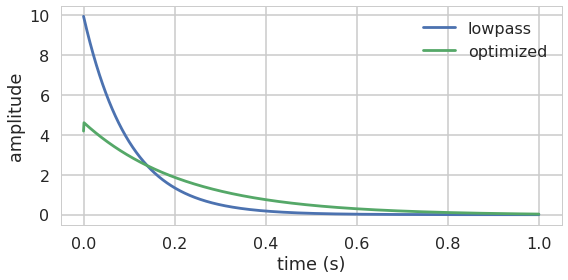

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

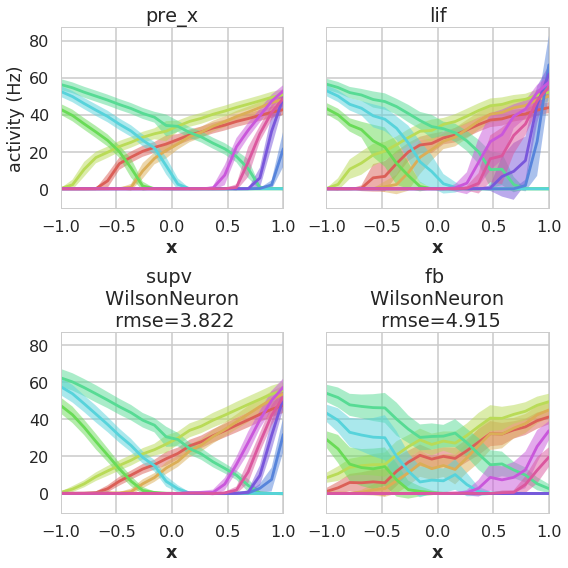

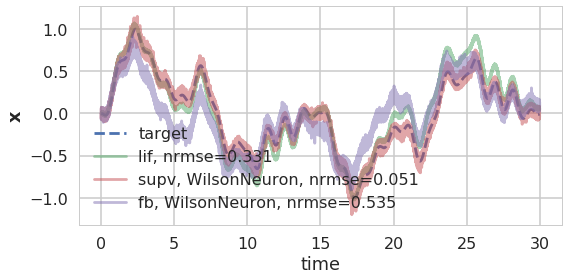

In [16]:
kwargs = dict(
    t=30,
    dt=0.00005,
    dt_sample=0.00005,
    n_neurons=100,
    freq=1,
    amp=1,
    max_rates=Uniform(40, 60),
    intercepts=Default,
    neuron_type=WilsonNeuron(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    n_num=3, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=3000,
    signal='white_noise')

d_pre, d_supv, d_fb = run(optimize_h=True, **kwargs)

oracle method to compute decoders for pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

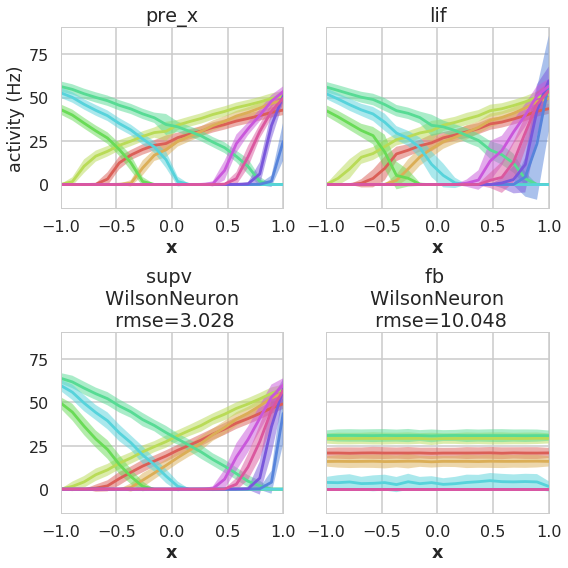

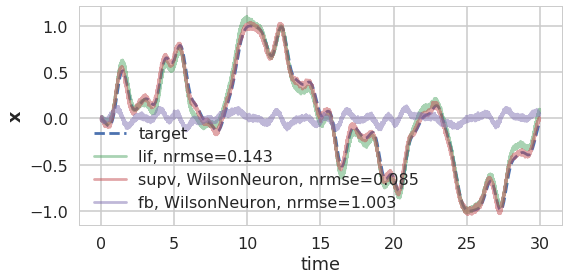

filter optimization for computing xhat_supv from spk_supv and d_supv


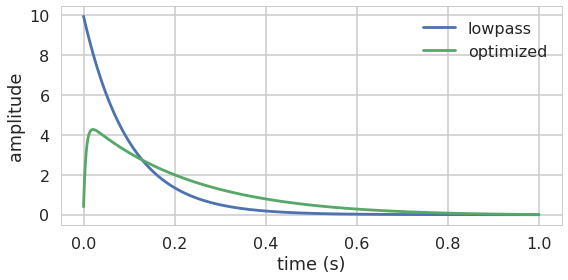

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

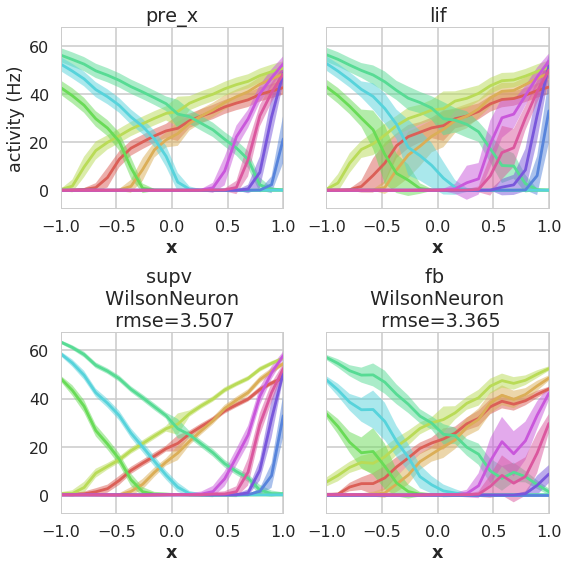

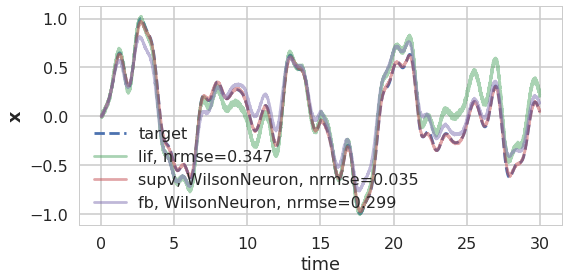

In [17]:
kwargs = dict(
    t=30,
    dt=0.000025,
    dt_sample=0.000025,
    n_neurons=100,
    freq=1,
    amp=1,
    max_rates=Uniform(40, 60),
    intercepts=Default,
    neuron_type=WilsonNeuron(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=2000,
    signal='white_noise')

d_pre, d_supv, d_fb = run(optimize_h=True, **kwargs)

oracle method to compute decoders for pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

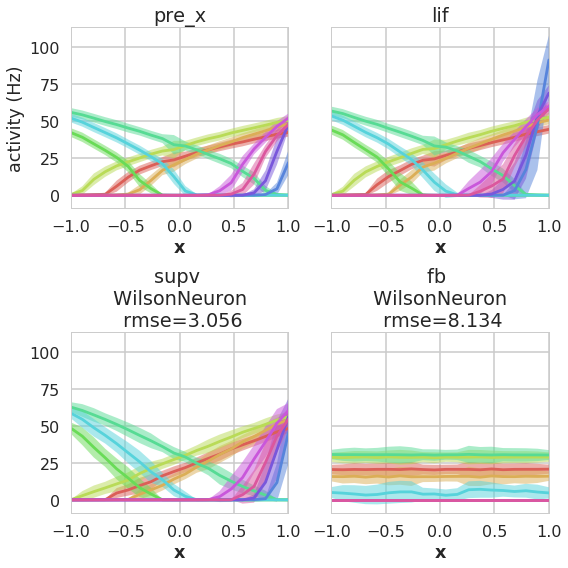

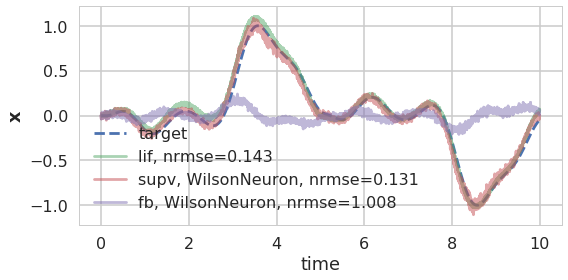

filter optimization for computing xhat_supv from spk_supv and d_supv


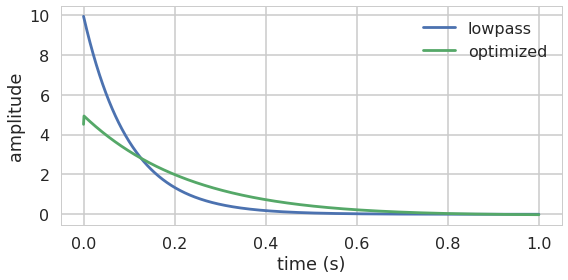

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

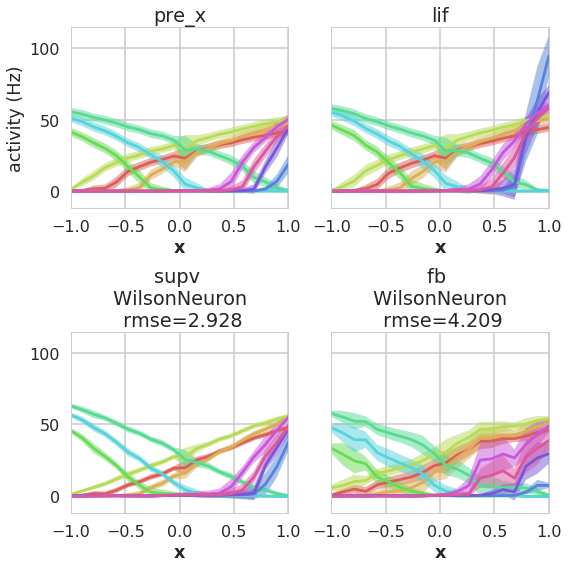

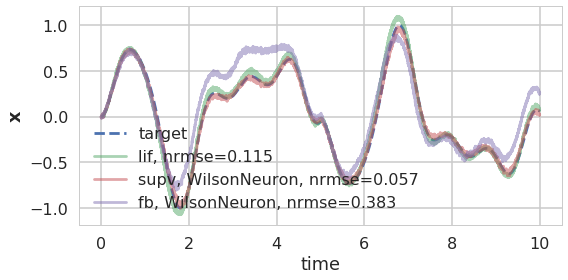

In [18]:
kwargs = dict(
    t=10,
    dt=0.00005,
    dt_sample=0.00005,
    n_neurons=100,
    freq=1,
    amp=1,
    max_rates=Uniform(40, 60),
    intercepts=Default,
    neuron_type=WilsonNeuron(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

d_pre, d_supv, d_fb = run(optimize_h=True, **kwargs)

oracle method to compute decoders for pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

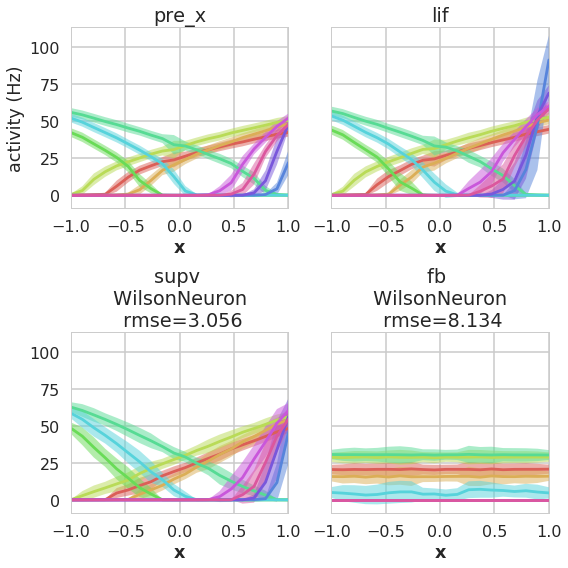

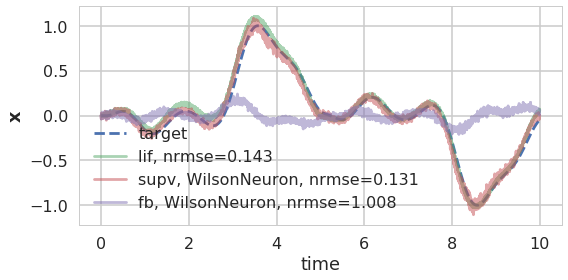

filter optimization for computing xhat_supv from spk_supv and d_supv


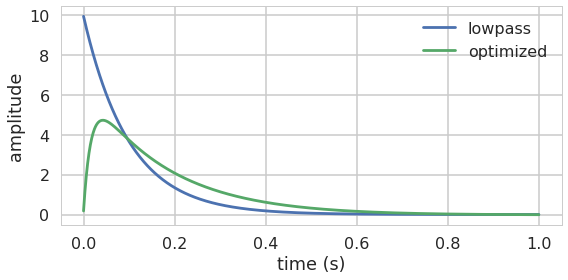

testing (no supervision)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

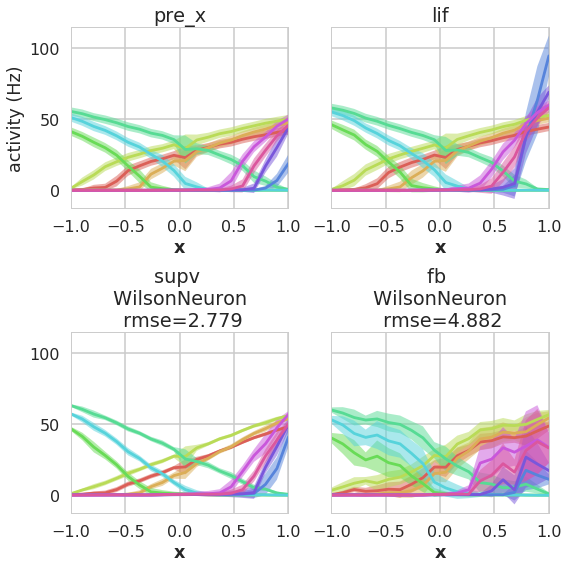

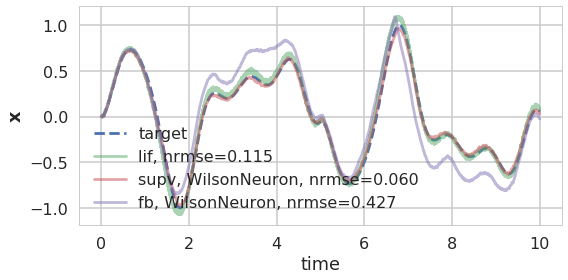

In [19]:
kwargs = dict(
    t=10,
    dt=0.00005,
    dt_sample=0.00005,
    n_neurons=100,
    freq=1,
    amp=1,
    max_rates=Uniform(40, 60),
    intercepts=Default,
    neuron_type=WilsonNeuron(),
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=3000,
    signal='white_noise')

d_pre, d_supv, d_fb = run(optimize_h=True, **kwargs)

# Multi-trial Simulations

neuron_type = LIF()
oracle method to compute decoders for pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

filter optimization for computing xhat_supv from spk_supv and d_supv


testing
trial 0


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

trial 1


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

trial 2


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

neuron_type = AdaptiveLIF(tau_n=0.1, inc_n=0.1)
oracle method to compute decoders for pre_x => supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

filter optimization for computing xhat_supv from spk_supv and d_supv


testing
trial 0


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

trial 1


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

trial 2


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

neuron_type = WilsonNeuron()
oracle method to compute decoders for pre_x => supv


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

filter optimization for computing xhat_supv from spk_supv and d_supv


testing
trial 0


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

trial 1


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

trial 2


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

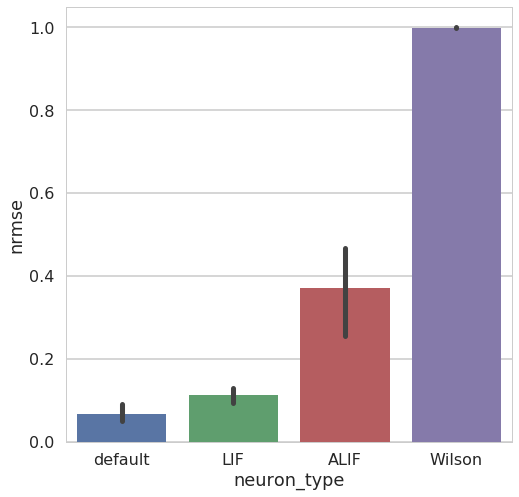

In [77]:
kwargs = dict(
    t=10,
    dt=0.00005,
    dt_sample=0.00005,
    n_neurons=100,
    freq=1,
    amp=1,
    max_rates=Default,
    intercepts=Default,
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=1000,
    signal='white_noise')

run_trials_types(3, **kwargs)

In [78]:
kwargs = dict(
    t=30,
    dt=0.000025,
    dt_sample=0.000025,
    n_neurons=100,
    freq=1,
    amp=1,
    max_rates=Default,
    intercepts=Default,
    taus={'network': 0.1, 'readout': 0.1},
    seeds={'ns': 1, 'ss':2, 'es': 3, 'cs': 4, 'ls': 5},
    reg=1e-2,
    n_num=1, 
    n_den=3,
    num_min=0,
    num_max=1,
    den_min=0,
    den_max=1,
    max_evals=2000,
    signal='white_noise')

run_trials_types(3, **kwargs)

neuron_type = LIF()
oracle method to compute decoders for pre_x => supv


/home/pduggins/.virtualenvs/nbn/lib/python3.6/site-packages/nengolib/signal/system.py:197: UserWarning: y0 (None!=0) does not properly initialize the system; see Nengo issue #1124.
  "Nengo issue #1124." % y0, UserWarning)


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

oracle method to compute decoders for supv (readout) and fb => fb


HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc.set('progress', 'progress_bar', 'nengo.utils.progress.TerminalProgressBar')`.

<IPython.core.display.Javascript object>

filter optimization for computing xhat_supv from spk_supv and d_supv


KeyboardInterrupt: 